Installing and importing
--

In [14]:
import praw
import requests
from datetime import datetime, timedelta
import pandas as pd
from prawcore import Forbidden, NotFound
from tqdm import tqdm
import prawcore
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from collections import defaultdict
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import time
from wordcloud import WordCloud
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [277]:
#nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/gisooshams/nltk_data...


True

Setting the client
--

In [5]:
reddit = praw.Reddit(
    client_id='c1zPstvJWTomkEcLRHoYtw',
    client_secret='8OngFIaoK-wkB7TUPJ1M_YLavDEeiw',
    user_agent='ThesisApp/0.1 by /u/Relative-Chocolate-8'
)

# Best sustainability posts

Being best is based on:

Score (Upvotes - Downvotes)

Engagement

Recency

User Votes Velocity

Subreddit Rules and Filters

User Interaction Quality

Reports and Moderation Actions

Assumptions

- More posts, more score

- More members, more score

- More negative sentiment, more sore

- More karma, more score
    

## Environmental sustainability

In [950]:
query = 'environmental sustainability'
sort_by = 'best'  # Sort by score
limit = 2000 # Number of top posts to fetch

# Perform the search and retrieve top posts
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Initialize a counter
counter = 0
max_posts = 10

# Dictionary to store the count of posts in each subreddit
subreddit_count = defaultdict(int)

# Print information about 10 best post
for post in posts_best:
    
    if counter >= max_posts:
        break
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Creation Date: {datetime.fromtimestamp(post.created_utc)}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print('----')
    
    # Increment the counter
    counter += 1

Subreddit: worldnews
Creation Date: 2023-03-15 14:38:23
Title: UK Budget 2023: Nuclear power to be reclassed as 'environmentally sustainable'
Text:


Score: 4430
Number of Comments: 487
Author: ead09
URL: https://www.scotsman.com/news/environment/budget-2023-nuclear-power-to-be-reclassed-as-environmentally-sustainable-4065514
----
Subreddit: science
Creation Date: 2022-10-02 12:00:32
Title: Low-meat diets nutritionally adequate for recommendation to the general population in reaching environmental sustainability.
Text:


Score: 2825
Number of Comments: 570
Author: tzaeru
URL: https://academic.oup.com/ajcn/advance-article-abstract/doi/10.1093/ajcn/nqac253/6702416
----
Subreddit: tearsofthekingdom
Creation Date: 2023-10-25 08:56:17
Title: environmentally sustainable mining
Text:


Score: 1178
Number of Comments: 51
Author: evanthebouncy
URL: https://v.redd.it/y1h7q7ttqawb1
----
Subreddit: science
Creation Date: 2022-10-10 14:53:01
Title: Researchers describe in a paper how growing algae 

### Dig deep in subreddits

In [952]:
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_count[subreddit_name] += 1
    
# Sort the subreddits by the number of posts in descending order
sorted_subreddits = sorted(subreddit_count.items(), key=lambda x: x[1], reverse=True)
    
# Get the top N subreddits
top_subreddits = sorted_subreddits[:10]

subreddit_names = []
num_posts = []
num_members = []
    
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    description = subreddit.public_description
    members = subreddit.subscribers

    subreddit_names.append(subreddit_name)
    num_posts.append(count)
    num_members.append(members)

    print(f'Subreddit: {subreddit_name}')
    print(f'   Number of posts: {count}')
    print(f'   Number of members: {members}')
    print(f'   Description: {description}\n')

Subreddit: HappyEcoFriendly
   Number of posts: 51
   Number of members: 515
   Description: Do you want to live more friendly to our environment, our website is the solution. On Happy Eco Friendly website you will find a lot of information about eco-friendly homes, eco-friendly living, minimalism, tiny homes, and home automation.

Subreddit: Environmental_Careers
   Number of posts: 9
   Number of members: 30645
   Description: A place to discuss careers and professional development related to environmental sciences and engineering, including compliance, permitting, assessments, remediation, and related fields.  An emphasis is placed on career advice and job hunting.

Subreddit: science
   Number of posts: 6
   Number of members: 32564696
   Description: This community is a place to share and discuss new scientific research. Read about the latest advances in astronomy, biology, medicine, physics, social science, and more. Find and submit new publications and popular science coverage o

##### More post More score?

In [954]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


subreddit_scores = defaultdict(list)

# Collect data for each post
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_count[subreddit_name] += 1
    subreddit_scores[subreddit_name].append(post.score)

In [955]:
# Collect data for plotting
top_subreddit_names = []
num_posts = []
avg_scores = []

for subreddit_name, count in top_subreddits:
    top_subreddit_names.append(subreddit_name)
    num_posts.append(count)
    avg_scores.append(sum(subreddit_scores[subreddit_name]) / len(subreddit_scores[subreddit_name]))

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/3378047863.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')


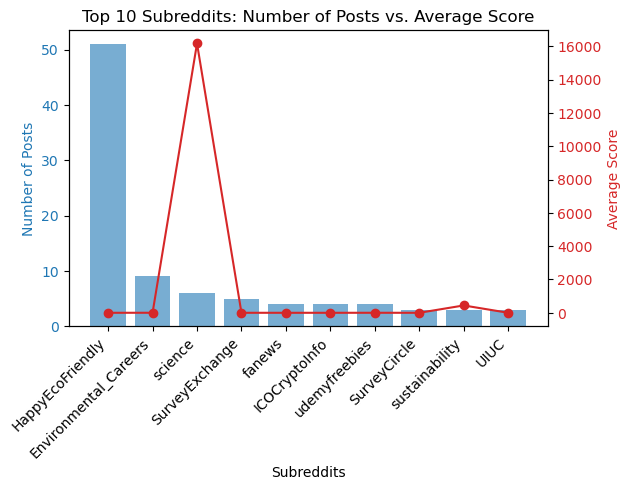

In [956]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(top_subreddit_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(top_subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Number of Posts vs. Average Score')
plt.show()

But what did Science talk about to have such a high score?

In [958]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the 'surveycircle' subreddit
science_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'science']

In [959]:
print(f"\nPosts from 'science' subreddit: ")
for post in science_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'science' subreddit: 
Subreddit: science
Title: Low-meat diets nutritionally adequate for recommendation to the general population in reaching environmental sustainability.
Text:


Score: 2838
URL: https://academic.oup.com/ajcn/advance-article-abstract/doi/10.1093/ajcn/nqac253/6702416
Sentiment Score: 0.19166666666666665
----
Subreddit: science
Title: Researchers describe in a paper how growing algae onshore could close a projected gap in society’s future nutritional demands while also improving environmental sustainability
Text:


Score: 29180
URL: https://news.cornell.edu/stories/2022/10/onshore-algae-farms-could-feed-world-sustainably
Sentiment Score: 0.0
----
Subreddit: science
Title: A model for ‘sustainable’ US beef production - If Americans reduced their mean beef consumption from the current ≈460 g per person per week to ≈200 g per person per week (corresponding to f = 0.5), the US beef industry could become environmentally sustainable.
Text:


Score: 32134
URL: htt

Most score comes from:

    Title: Chemists developed two sustainable plastic alternatives to polyethylene, derived from plants, that can be recycled with a recovery rate of more than 96%, as low-waste, environmentally friendly replacements to conventional fossil fuel-based plastics. (Nature, 17 Feb)
Text:


Score: 71992
URL: https://academictimes.com/new-plant-based-plastics-can-be-chemically-recycled-with-near-perfect-efficiency/
Sentiment Score: 0.20803571428571427

AND

Title: A model for ‘sustainable’ US beef production - If Americans reduced their mean beef consumption from the current ≈460 g per person per week to ≈200 g per person per week (corresponding to f = 0.5), the US beef industry could become environmentally sustainable.
Text:


Score: 32138
URL: https://www.nature.com/articles/s41559-017-0390-5
Sentiment Score: -0.15625

----

While least is from:

Subreddit: science
Title: The relative benefits for environmental sustainability of vegan diets for dogs, cats and people
Text:


Score: 0
URL: https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0291791
Sentiment Score: 0.0

which is an article without summary, 

AND

Subreddit: science
Title: The environmental sustainability of digital content consumption
Text:


Score: 39
URL: https://www.nature.com/articles/s41467-024-47621-w
Sentiment Score: 0.0

the same story

----

seems like the longer the title the more the score, and being neutral in the sentiemtn does not help getting attention.

##### More member More score?

In [961]:
subreddit_names = []
num_posts = []
avg_scores = []
num_members = []

In [962]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    num_posts.append(count)
    avg_scores.append(sum(subreddit_scores[subreddit_name]) / len(subreddit_scores[subreddit_name]))
    num_members.append(subreddit.subscribers)
    subreddit_names.append(subreddit_name)

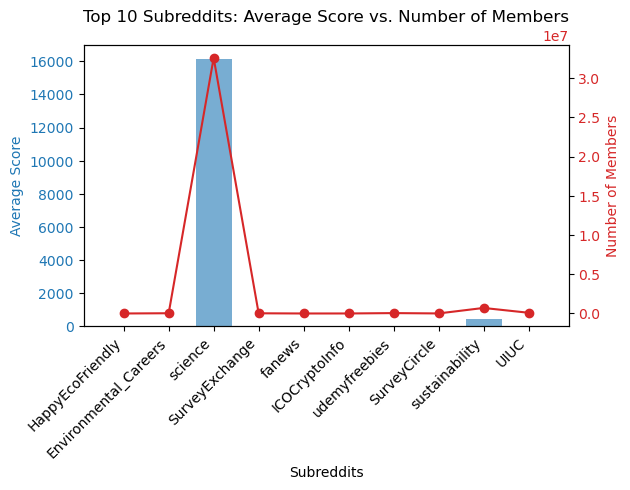

In [963]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(subreddit_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(subreddit_names)))
ax1.set_xticklabels(subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Number of Members', color=color)
ax2.plot(subreddit_names, num_members, color=color, marker='o', label='Number of Members')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Average Score vs. Number of Members')
plt.show()

Memeber Assumption: YES

##### More negative more score?

In [965]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

subreddit_sentiment = defaultdict(list)

sentiment_envo = defaultdict(list)

# Analyze sentiment for posts in top subreddits
for post in posts_best:
    
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"
    
    if subreddit_name in dict(top_subreddits):
        text = (post.title or "") + ' ' + (post.selftext or "")
        if text.strip():  # Ensure there's some text to analyze
            sentiment = TextBlob(text).sentiment.polarity
            subreddit_sentiment[subreddit_name].append(sentiment)
            sentiment_envo[subreddit_name].append((author_name, sentiment))
            
        else:
            print(f"Empty text for post in subreddit: {subreddit_name}")

In [966]:
sentiment_envo

defaultdict(list,
            {'science': [('tzaeru', 0.19166666666666665),
              ('giuliomagnifico', 0.0),
              ('mvea', -0.15625),
              ('mvdm_42', 0.0),
              ('Vegoonmoon', 0.0),
              ('mvea', 0.01393939393939394),
              ('Wagamaga', -0.04444444444444443),
              ('mvea', 0.20803571428571427),
              ('Wagamaga', 0.06666666666666667)],
             'sustainability': [('lenasamford', 0.0),
              ('mvdm_42', 0.0),
              ('m3hn0w', 0.2),
              ('kreatio-welma', 0.27070707070707073)],
             'SurveyCircle': [('surveycircle_bot', 0.0),
              ('surveycircle_bot', 0.0),
              ('Hey_BK', -0.2)],
             'HappyEcoFriendly': [('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
              ('Eco-Uday', 0.0),
      

In [967]:
# Calculate average sentiment for each subreddit
avg_sentiment = {
    subreddit: sum(sentiments) / len(sentiments) if sentiments else 0
    for subreddit, sentiments in subreddit_sentiment.items()
}

In [968]:
subreddits = [subreddit for subreddit, _ in top_subreddits]
num_posts = [count for _, count in top_subreddits]
sentiments = [avg_sentiment.get(subreddit, 0) for subreddit in subreddits]

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/552014847.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(subreddits, rotation=45, ha='right')


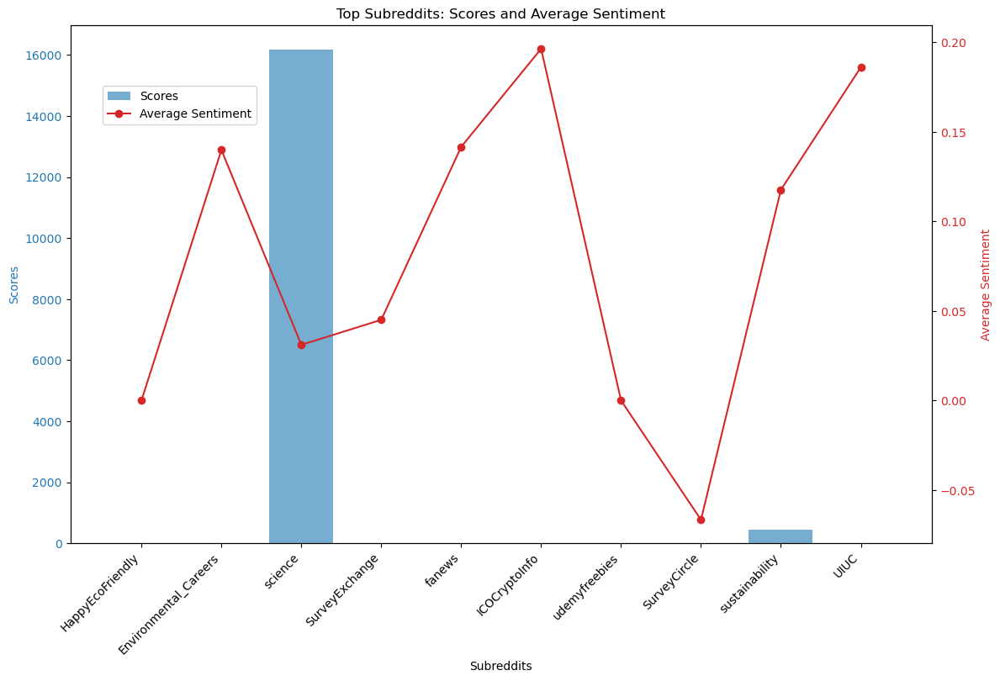

In [969]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Scores', color=color)
ax1.bar(subreddits, avg_scores, color=color, alpha=0.6, label='Scores')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(subreddits, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(subreddits, sentiments, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.9))
plt.title('Top Subreddits: Scores and Average Sentiment')
plt.show()

Sentiment Assumption: NO

In [971]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the 'surveycircle' subreddit
surveycircle_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'surveycircle']

In [972]:
print(f"\nPosts from 'surveycircle' subreddit:")
for post in surveycircle_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'surveycircle' subreddit:
Subreddit: SurveyCircle
Title: Environmental Sustainability
Text:


Score: 1
URL: https://i.redd.it/sdkpbbcc2lpc1.jpeg
Sentiment Score: 0.0
----
Subreddit: SurveyCircle
Title: Diet Environmental Sustainability
Text:


Score: 1
URL: https://i.redd.it/1t4zjx7l6ftc1.jpeg
Sentiment Score: 0.0
----
Subreddit: SurveyCircle
Title: How can Green Building Architects in the eco-design sector contribute to environmental sustainability? 
Text:
https://docs.google.com/forms/u/0/d/e/1FAIpQLSe2jlUX-ofNb_HpuGXWDEnGpmLqttII5uR_gK5nFqfEaeIdMg/formResponse

Score: 1
URL: https://www.reddit.com/r/SurveyCircle/comments/1cr4ble/how_can_green_building_architects_in_the/
Sentiment Score: -0.2
----


In [973]:
# If you want to calculate and print the average sentiment for 'surveycircle'
sentiments = [TextBlob((post.title or "") + ' ' + (post.selftext or "")).sentiment.polarity 
              for post in surveycircle_posts if (post.title or "").strip() or (post.selftext or "").strip()]

avg_sentiment = sum(sentiments) / len(sentiments) if sentiments else 0
print(f"Average Sentiment for 'surveycircle': {avg_sentiment}")

Average Sentiment for 'surveycircle': -0.06666666666666667


Doesn't seem anything odd. 

### Dig deep in authors

In [976]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_count = defaultdict(int)
    
# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

In [977]:
# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# Get the top N authors
top_authors = sorted_authors[:10]

authors_envo = top_authors

In [978]:
author_names = [author for author, count in top_authors]

author_envo_names = author_names

num_posts = [count for author, count in top_authors]

In [979]:
print(f'\nTop {10} most frequent authors:')
for i, (author, count) in enumerate(top_authors, 1):
        print(f'{i}. Author: {author}, Number of posts: {count}')


Top 10 most frequent authors:
1. Author: Eco-Uday, Number of posts: 51
2. Author: iam_the_good_guy, Number of posts: 5
3. Author: WinterBeginning1757, Number of posts: 5
4. Author: powerlilies, Number of posts: 5
5. Author: LazyHose, Number of posts: 4
6. Author: bobateaman14, Number of posts: 4
7. Author: ami_nil1987, Number of posts: 4
8. Author: mike_gifford, Number of posts: 4
9. Author: smartybrome, Number of posts: 4
10. Author: Wagamaga, Number of posts: 3


In [980]:
author_details = []

author_envo = []

for i, (author_name, count) in enumerate(top_authors, 1):
    if author_name == "[deleted]":
        post_karma = comment_karma = cake_day = "N/A"
    else:
        author = reddit.redditor(author_name)
        post_karma = author.link_karma
        comment_karma = author.comment_karma
        cake_day = datetime.fromtimestamp(author.created_utc).strftime('%Y-%m-%d')

    author_details.append((author_name, count, post_karma, comment_karma, cake_day))
    
    author_envo.append((author_name, count, post_karma, comment_karma, cake_day))

    print(f'{i}. Author: {author_name}')
    print(f'   Number of posts: {count}')
    print(f'   Post karma: {post_karma}')
    print(f'   Comment karma: {comment_karma}')
    print(f'   Cake day: {cake_day}')
    print()

1. Author: Eco-Uday
   Number of posts: 51
   Post karma: 9
   Comment karma: 0
   Cake day: 2021-09-19

2. Author: iam_the_good_guy
   Number of posts: 5
   Post karma: 82
   Comment karma: 9
   Cake day: 2022-01-10

3. Author: WinterBeginning1757
   Number of posts: 5
   Post karma: 1
   Comment karma: 5
   Cake day: 2021-12-30

4. Author: powerlilies
   Number of posts: 5
   Post karma: 1766
   Comment karma: 45
   Cake day: 2020-10-27

5. Author: LazyHose
   Number of posts: 4
   Post karma: 525
   Comment karma: 0
   Cake day: 2022-02-14

6. Author: bobateaman14
   Number of posts: 4
   Post karma: 874
   Comment karma: 1496
   Cake day: 2022-06-22

7. Author: ami_nil1987
   Number of posts: 4
   Post karma: 5535
   Comment karma: 410
   Cake day: 2018-04-01

8. Author: mike_gifford
   Number of posts: 4
   Post karma: 20431
   Comment karma: 404
   Cake day: 2012-08-10

9. Author: smartybrome
   Number of posts: 4
   Post karma: 42418
   Comment karma: 79
   Cake day: 2021-03-22


#### Assumption Checks

##### More post more score?

In [982]:
# Perform the search and retrieve top posts
posts_best = list(reddit.subreddit('all').search(query, sort=sort_by, limit=limit))


In [983]:
author_names = [author for author, _, _, _, _ in author_details]
num_posts = [count for _, count, _, _, _ in author_details]
combined_karmas = [post_karma + comment_karma if post_karma != "N/A" else 0 for _, _, post_karma, comment_karma, _ in author_details]

In [984]:
author_scores = defaultdict(int)

# Collect data for each post
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_scores[author_name] += post.score

In [985]:
total_scores = [author_scores[author] for author in author_names]

# Calculate average scores for plotting
avg_scores = [total_scores[i] / num_posts[i] if num_posts[i] > 0 else 0 for i in range(len(total_scores))]

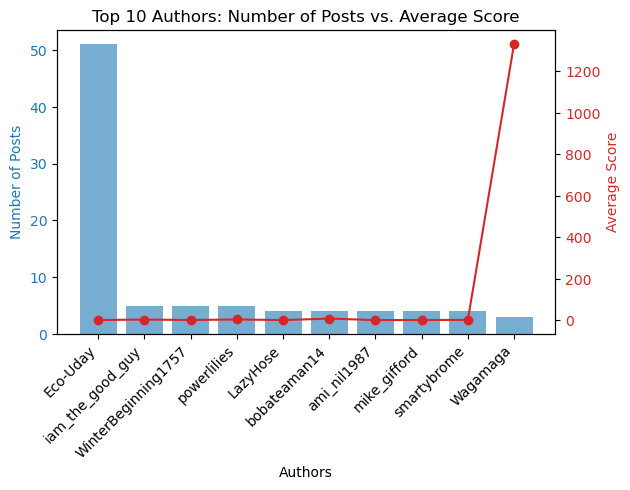

In [986]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(author_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(author_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Number of Posts vs. Average Score')
plt.show()

Post Assumption: No

In [988]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the author 'Wagamaga' and include sentiment scores
Wagamaga_posts = [post for post in posts_best if post.author and post.author.name == 'Wagamaga']

In [989]:
print(f"\nPosts from author 'Wagamaga':")
for post in Wagamaga_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'Wagamaga':
Subreddit: technology
Title: Deutsche Bank: Crypto is not environmentally sustainable
Text:


Score: 341
Number of Comments: 194
Author: Wagamaga
URL: https://invezz.com/news/2021/12/10/deutsche-bank-crypto-is-not-environmentally-sustainable/
Sentiment Score: 0.0
----
Subreddit: science
Title: Sustainable alternatives key to combating fast fashion's environmental toll. In 2018, over 11.3 million tons of clothing and textiles were discarded, creating serious environmental challenges.
Text:


Score: 930
Number of Comments: 44
Author: Wagamaga
URL: https://www.sfu.ca/sfunews/stories/2023/11/sustainable-alternatives-key-to-combating-fast-fashion-s-environ.html
Sentiment Score: -0.04444444444444443
----
Subreddit: science
Title: Chronic inflammation caused by stress is affecting our collective thinking and behavior, and it’s keeping society in a “self-sustaining cycle of societal dysfunction and environmental degradation” which is keeping us from taking action

He/she talks about science and technology, and his post with the longest title got the most score, and its about stress and environment! Its sentiment is positive. The second most scored post is also in the science subreddit which we saw above is very successful, and has the second longest title.Though its sentiment is not positive, but as seen before, it is not neutral. It is negative.Its again about another human aspect vs environment: fashion

##### More negative More score?

In [991]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_sentiment = defaultdict(list)
# Analyze sentiment for posts by top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    if author_name in dict(top_authors):
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        author_sentiment[author_name].append(sentiment)

In [992]:
# Calculate average sentiment for each author
avg_sentiment = {author: sum(sentiments) / len(sentiments) if sentiments else 0
                 for author, sentiments in author_sentiment.items()}

In [993]:
avg_sentiment

{'Wagamaga': 0.007407407407407411,
 'Eco-Uday': 0.0,
 'LazyHose': 0.14166666666666666,
 'bobateaman14': 0.14371527777777776,
 'ami_nil1987': 0.19645908094098885,
 'iam_the_good_guy': 0.22727272727272724,
 'WinterBeginning1757': 0.07052116402116401,
 'powerlilies': 0.0,
 'mike_gifford': 0.6,
 'smartybrome': 0.0}

In [994]:
author_names = [author for author, count in top_authors]

# Calculate average sentiment and average scores
avg_sentiment = [sum(author_sentiment[author]) / len(author_sentiment[author]) if author_sentiment[author] else 0 for author in 
                 author_names]

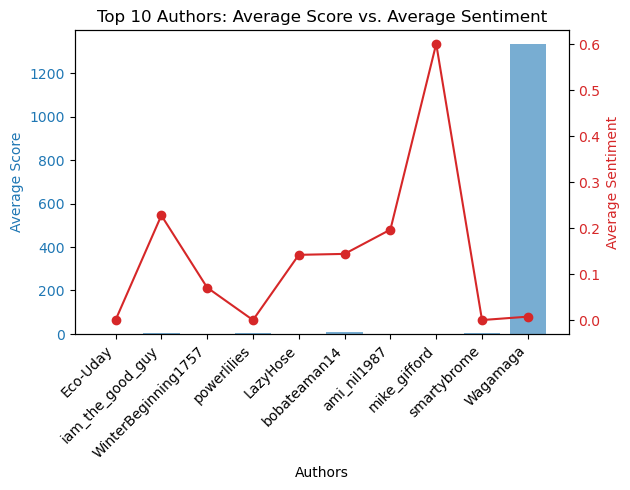

In [995]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(author_names, avg_sentiment, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Average Sentiment')
plt.show()

Still can't say sentiment assumption holds.

Sentiment assumption: No

In [997]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'mike_gifford' and include sentiment scores
mike_gifford_posts = [post for post in posts_best if post.author and post.author.name.lower() == 'mike_gifford']

In [998]:
print(f"\nPosts from author 'mike_gifford':")
for post in mike_gifford_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'mike_gifford':
Subreddit: drupal
Title: FOSDEM 2024 - Web Accessibility and Environmental Sustainability and with Popular CMS
Text:


Score: 1
Number of Comments: 1
Author: mike_gifford
URL: https://fosdem.org/2024/schedule/event/fosdem-2024-3317-web-accessibility-and-environmental-sustainability-and-with-popular-cms/
Sentiment Score: 0.6
----
Subreddit: Wordpress
Title: FOSDEM 2024 - Web Accessibility and Environmental Sustainability and with Popular CMS
Text:


Score: 1
Number of Comments: 0
Author: mike_gifford
URL: https://fosdem.org/2024/schedule/event/fosdem-2024-3317-web-accessibility-and-environmental-sustainability-and-with-popular-cms/
Sentiment Score: 0.6
----
Subreddit: WagtailCMS
Title: FOSDEM 2024 - Web Accessibility and Environmental Sustainability and with Popular CMS
Text:


Score: 2
Number of Comments: 0
Author: mike_gifford
URL: https://fosdem.org/2024/schedule/event/fosdem-2024-3317-web-accessibility-and-environmental-sustainability-and-with-popu

All the same, in 3 different subreddits: Short title about an event!

##### More karma more score?

In [1000]:
# Perform the search and retrieve top posts
posts_best = list(reddit.subreddit('all').search(query, sort=sort_by, limit=limit))


# Initialize a counter to count posts per author
author_count = defaultdict(int)

In [1001]:
# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

In [1002]:
# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# Get the top 10 authors
top_authors = sorted_authors[:10]
author_names = [author for author, _ in top_authors]

In [1003]:
# Initialize dictionaries to store scores and karma for the top authors
author_scores = defaultdict(list)
author_karma = {}

In [1004]:
# Collect scores and karma data for the top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    
    if author_name in author_names:
        author_scores[author_name].append(post.score)
        
        # Fetch karma for the top authors if not already fetched
        if author_name not in author_karma:
            try:
                author = reddit.redditor(author_name)
                
                post_karma = author.link_karma  # Post karma
                comment_karma = author.comment_karma  # Comment karma
                author_karma[author_name] = post_karma + comment_karma  # Sum of both karmas
            except Exception as e:
                print(f"An error occurred for author {author_name}: {e}")
                author_karma[author_name] = None  # Set karma to None in case of error

In [1005]:
# Prepare data for plotting
karma_values = []
avg_scores = []

In [1006]:
for author_name in author_names:
    if author_karma.get(author_name) is not None:  # Ensure valid karma data
        avg_scores.append(sum(author_scores[author_name]) / len(author_scores[author_name]))
        karma_values.append(author_karma[author_name])

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/1090625036.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(author_names, rotation=45, ha='right')


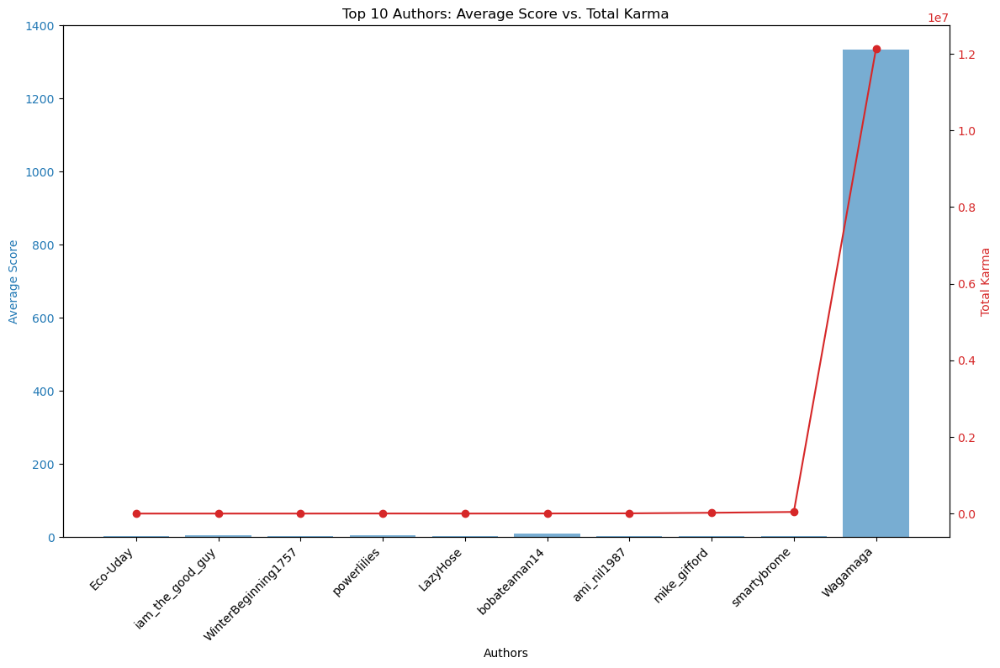

In [1007]:
# Plotting
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for average scores
color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(author_names, rotation=45, ha='right')

# Line plot for total karma
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Karma', color=color)
ax2.plot(author_names, karma_values, color=color, marker='o', label='Total Karma')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Total Karma')
plt.show()

In [1008]:
karma_values

[9, 91, 6, 1811, 525, 2370, 5945, 20835, 42497, 12136145]

Seems like it matches with Karma assumption.

In [1010]:
# Specify the author
author_name = 'Wagamaga'

# Initialize data structures to store details
posts_details = []
comments_sentiment = defaultdict(list)

In [1011]:
# Process posts to filter those by Wagamaga
for post in posts_best:
    if post.author and post.author.name == author_name:
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        posts_details.append({
            'id': post.id,
            'title': post.title,
            'score': post.score,
            'url': post.url,
            'sentiment': sentiment,
            'num_comments': post.num_comments,
            'created_utc': datetime.fromtimestamp(post.created_utc)
        })

        # Fetch comments on Wagamaga's posts and analyze sentiment
        post.comments.replace_more(limit=None)  # Replace "MoreComments" objects with actual comments
        for comment in post.comments.list():
            comment_sentiment = TextBlob(comment.body).sentiment.polarity
            comments_sentiment[post.id].append(comment_sentiment)

In [1012]:
# Fetch Redditor's karma
try:
    author = reddit.redditor(author_name)
   
    post_karma = author.link_karma  # Post karma
    comment_karma = author.comment_karma  # Comment karma
except Exception as e:
    print(f"An error occurred while fetching data for {author_name}: {e}")
    post_karma = comment_karma = None

In [1013]:
# Print the data
print(f"Author: {author_name}")
print(f"Post Karma: {post_karma}")
print(f"Comment Karma: {comment_karma}\n")

print("Posts by Wagamaga in the search results:")
for post in posts_details:
    print(f"Title: {post['title']}")
    print(f"Score: {post['score']}")
    print(f"Sentiment: {post['sentiment']}")
    print(f"Number of Comments: {post['num_comments']}")
    print(f"URL: {post['url']}")
    print(f"Creation Date: {post['created_utc']}")
    
    # Print sentiment of comments for this post
    post_comments_sentiments = comments_sentiment.get(post['id'], [])
    if post_comments_sentiments:
        avg_comment_sentiment = sum(post_comments_sentiments) / len(post_comments_sentiments)
        print(f"Average Comment Sentiment: {avg_comment_sentiment:.2f}")
    else:
        print("No comments found or all comments have neutral sentiment.")
    
    print("----")

Author: Wagamaga
Post Karma: 11764518
Comment Karma: 371627

Posts by Wagamaga in the search results:
Title: Deutsche Bank: Crypto is not environmentally sustainable
Score: 340
Sentiment: 0.0
Number of Comments: 194
URL: https://invezz.com/news/2021/12/10/deutsche-bank-crypto-is-not-environmentally-sustainable/
Creation Date: 2021-12-10 16:24:57
Average Comment Sentiment: 0.04
----
Title: Sustainable alternatives key to combating fast fashion's environmental toll. In 2018, over 11.3 million tons of clothing and textiles were discarded, creating serious environmental challenges.
Score: 926
Sentiment: -0.04444444444444443
Number of Comments: 44
URL: https://www.sfu.ca/sfunews/stories/2023/11/sustainable-alternatives-key-to-combating-fast-fashion-s-environ.html
Creation Date: 2023-11-04 18:05:25
Average Comment Sentiment: 0.08
----
Title: Chronic inflammation caused by stress is affecting our collective thinking and behavior, and it’s keeping society in a “self-sustaining cycle of societa

## Human sustainability

Human sustainability: the degree to which the organization creates value for people as human beings, leaving them with greater health and well-being, stronger skills and greater employability, good jobs, opportunities for advancement, progress toward equity, increased belonging, and heightened connection to purpose.

The Human Sustainability Index provides data-driven insights into wellbeing, resilience and sustainability at the individual, team and organizational levels.

In [1015]:
query = 'human sustainability'
sort_by = 'best'  # Sort by score
limit = 2000 # Number of top posts to fetch

In [1016]:
# Perform the search and retrieve top posts
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Initialize a counter
counter = 0
max_posts = 10

In [1017]:
# Print information about 10 best post
for post in posts_best:
    
    if counter >= max_posts:
        break
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Creation Date: {datetime.fromtimestamp(post.created_utc)}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print('----')
    
    # Increment the counter
    counter += 1

Subreddit: sustainability
Creation Date: 2022-11-13 17:45:01
Title: Sustainability of Humanity
Text:


Score: 2308
Number of Comments: 88
Author: Affectionate-Net-707
URL: https://i.redd.it/rbq4zmslgsz91.jpg
----
Subreddit: SurveyCircle
Creation Date: 2024-06-18 13:15:15
Title: Human Sustainability
Text:


Score: 1
Number of Comments: 1
Author: surveycircle_bot
URL: https://i.redd.it/eekfk5h7db7d1.jpeg
----
Subreddit: space
Creation Date: 2017-10-29 20:58:52
Title: SpaceX envisions a “permanent, self-sustaining human presence” on the red planet.
Text:


Score: 8957
Number of Comments: 516
Author: JM-Rie
URL: https://v.redd.it/e9hrm6cvqtuz
----
Subreddit: worldbuilding
Creation Date: 2024-02-13 21:50:31
Title: How to hunt humans sustainably
Text:
There are some creatures in fiction that need to eat humans to survive. For example, the Nagaraja clan of vampires from the Vampire: the masquerade rpg comes to mind. In Korean folklore, a tiger that eats human flesh gains the power to take on 

### Dig deep in subreddits

In [1019]:
# Dictionary to store the count of posts in each subreddit
subreddit_count = defaultdict(int)

for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_count[subreddit_name] += 1

In [1020]:
# Sort the subreddits by the number of posts in descending order
sorted_subreddits = sorted(subreddit_count.items(), key=lambda x: x[1], reverse=True)
    
# Get the top N subreddits
N = 10
top_subreddits = sorted_subreddits[:N]

In [1021]:
subreddit_names = []
num_posts = []
num_members = []

In [1022]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    description = subreddit.public_description
    members = subreddit.subscribers

    subreddit_names.append(subreddit_name)
    num_posts.append(count)
    num_members.append(members)

    print(f'Subreddit: {subreddit_name}')
    print(f'   Number of posts: {count}')
    print(f'   Number of members: {members}')
    print(f'   Description: {description}\n')

Subreddit: tomorrowsworld
   Number of posts: 29
   Number of members: 1384
   Description: The future of the world

Subreddit: changemyview
   Number of posts: 6
   Number of members: 3682093
   Description: A place to post an opinion you accept may be flawed, in an effort to understand other perspectives on the issue. Enter with a mindset for conversation, not debate.

Subreddit: science
   Number of posts: 6
   Number of members: 32564699
   Description: This community is a place to share and discuss new scientific research. Read about the latest advances in astronomy, biology, medicine, physics, social science, and more. Find and submit new publications and popular science coverage of current research.

Subreddit: AskReddit
   Number of posts: 6
   Number of members: 47813499
   Description: r/AskReddit is the place to ask and answer thought-provoking questions.

Subreddit: theydidthemath
   Number of posts: 5
   Number of members: 1529203
   Description: And they said math has no 

#### Assumption Checks

##### More post More score?

In [1024]:
subreddit_scores = defaultdict(list)
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Collect data for each post
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_scores[subreddit_name].append(post.score)

In [1025]:
# Collect data for plotting
top_subreddit_names = []
num_posts = []
avg_scores = []

In [1026]:
for subreddit_name, count in top_subreddits:
    top_subreddit_names.append(subreddit_name)
    num_posts.append(count)
    avg_scores.append(sum(subreddit_scores[subreddit_name]) / len(subreddit_scores[subreddit_name]))

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/3378047863.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')


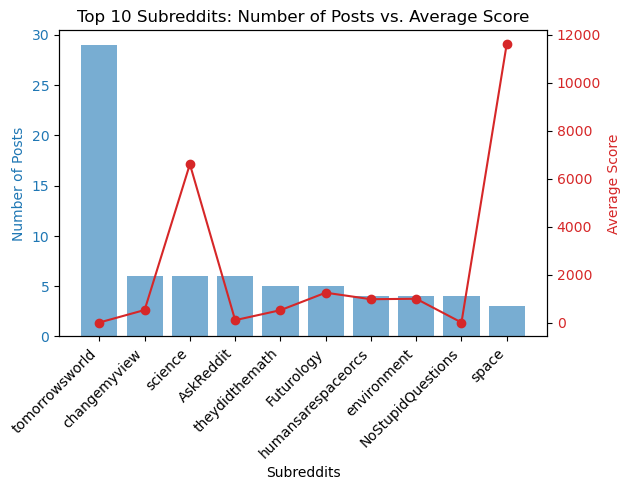

In [1027]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(top_subreddit_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(top_subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Number of Posts vs. Average Score')
plt.show()

Again, Post Assumption does not hold.

In [1029]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the 'surveycircle' subreddit
space_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'space']

In [1030]:
print(f"\nPosts from 'space' subreddit: ")
for post in space_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'space' subreddit: 
Subreddit: space
Title: SpaceX envisions a “permanent, self-sustaining human presence” on the red planet.
Text:


Score: 8963
URL: https://v.redd.it/e9hrm6cvqtuz
Sentiment Score: 0.0
----
Subreddit: space
Title: For the first time since the Apollo era, NASA has funding for a human lunar lander. The Agency's 2020 budget provides an additional $1.3 billion to accelerate sustained exploration of the Moon through the Artemis program.
Text:


Score: 15623
URL: https://twitter.com/JimBridenstine/status/1208236090592768002
Sentiment Score: 0.125
----
Subreddit: space
Title: Amazon's Jeff Bezos is enamored with the idea of O'Neill colonies: spinning space cities that might sustain future humans. “If we move out into the solar system, for all practical purposes, we have unlimited resources,” Bezos said. “We could have a trillion people out in the solar system.”
Text:


Score: 21865
URL: http://www.astronomy.com/news/2019/05/oneill-colonies-a-decades-long-dream-fo

Again here we see the longer the title, the more the score.
Countrary to the previous section, the highest scored post is neutral in sentiment.

##### More member More score?

In [1032]:
subreddit_names = []

num_members = []

In [1033]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    num_members.append(subreddit.subscribers)
    subreddit_names.append(subreddit_name)

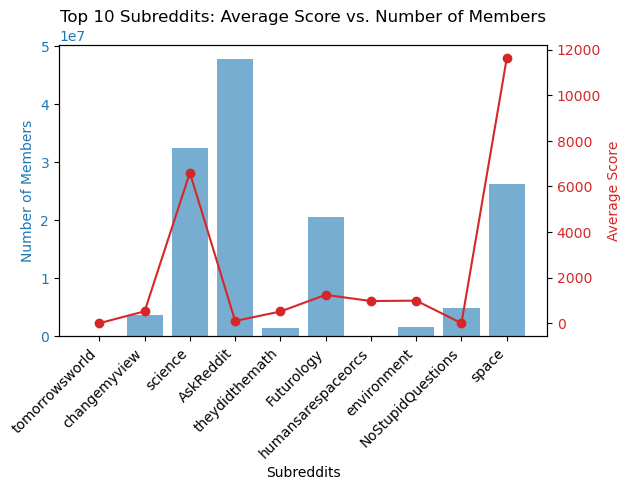

In [1034]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Members', color=color)
ax1.bar(subreddit_names, num_members, color=color, alpha=0.6, label='Number of Members')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(subreddit_names)))
ax1.set_xticklabels(subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Average Score vs. Number of Members')
plt.show()

Member assumption does not seem to hold here, but the two most high scored subreddits have #members above the average.

In [1036]:
import numpy as np
np.mean(num_members)

13900924.1

##### More negative more score?

In [1037]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

subreddit_sentiment = defaultdict(list)

In [1038]:
sentiment_human = defaultdict(list)

# Analyze sentiment for posts in top subreddits
for post in posts_best:

    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"
    
    if subreddit_name in dict(top_subreddits):
        text = (post.title or "") + ' ' + (post.selftext or "")
        if text.strip():  # Ensure there's some text to analyze
            sentiment = TextBlob(text).sentiment.polarity
            subreddit_sentiment[subreddit_name].append(sentiment)
            sentiment_human[subreddit_name].append((author_name, sentiment))
        else:
            print(f"Empty text for post in subreddit: {subreddit_name}")

In [1039]:
# Calculate average sentiment for each subreddit
avg_sentiment = {
    subreddit: sum(sentiments) / len(sentiments) if sentiments else 0
    for subreddit, sentiments in subreddit_sentiment.items()
}

In [1040]:
subreddits = [subreddit for subreddit, _ in top_subreddits]

sentiments = [avg_sentiment.get(subreddit, 0) for subreddit in subreddits]

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/552014847.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(subreddits, rotation=45, ha='right')


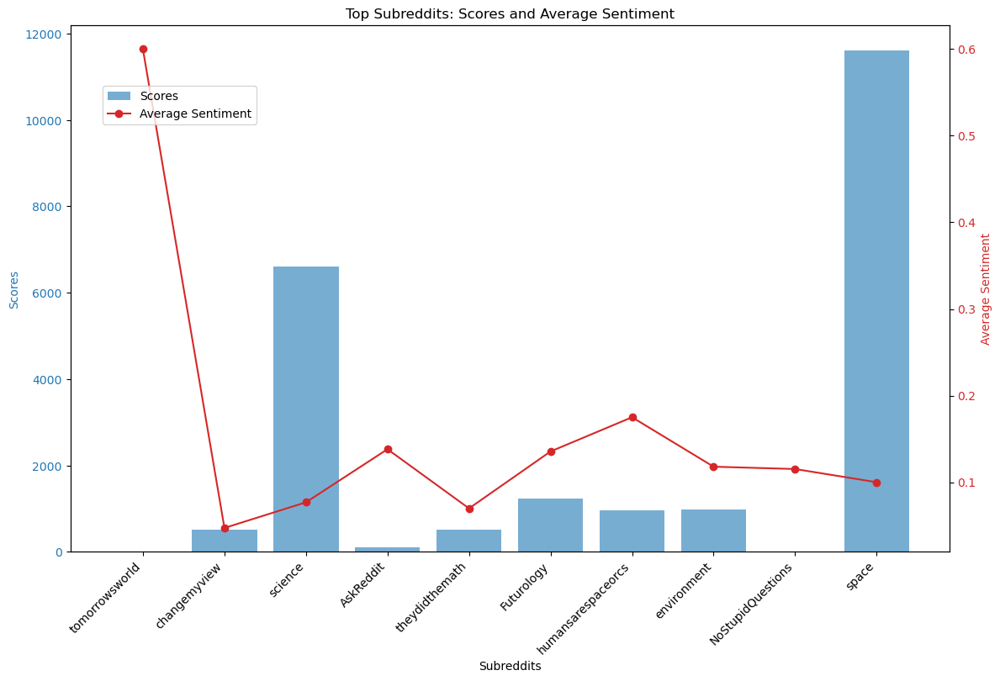

In [1041]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Scores', color=color)
ax1.bar(subreddits, avg_scores, color=color, alpha=0.6, label='Scores')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(subreddits, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(subreddits, sentiments, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.9))
plt.title('Top Subreddits: Scores and Average Sentiment')
plt.show()

In [1042]:
np.mean(sentiments)

0.15754088883652034

All the sentiments are positive in this subject!

The most positively sentimented subreddit is thde least scored.

The highest scored subreddits do not have the least sentiment, but their sentiment, though positive, is below mean.

Hoewver, sentiment being close to 0 does not guarantee a high score, as we also saw in the previous section.

In [1044]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)
# Now, print the posts specifically from the 'surveycircle' subreddit
tomorrowsworld_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'tomorrowsworld']

In [1045]:
print(f"\nPosts from 'tomorrowsworld' subreddit:")
for post in tomorrowsworld_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'tomorrowsworld' subreddit:
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=US&ceid=US:en
Sentiment Score: 0.6
----
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=US&ceid=US:en
Sentiment Score: 0.6
----
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=US&ceid=US:en
Sentiment Score: 0.6
----
Subreddit: tomorrowsworld
Title: Ancient farm practice could

### Dig deep in authors

In [1047]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_count = defaultdict(int)

In [1048]:
# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

In [1049]:
# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# Get the top N authors
top_authors = sorted_authors[:10]

In [1050]:
author_names = [author for author, count in top_authors]
num_posts = [count for author, count in top_authors]

In [1051]:
print(f'\nTop {10} most frequent authors:')
for i, (author, count) in enumerate(top_authors, 1):
        print(f'{i}. Author: {author}, Number of posts: {count}')


Top 10 most frequent authors:
1. Author: tw_bot, Number of posts: 29
2. Author: Calade2024, Number of posts: 5
3. Author: Free_Swimming, Number of posts: 4
4. Author: IAmTheCurtis, Number of posts: 4
5. Author: AutoNewsAdmin, Number of posts: 4
6. Author: Wagamaga, Number of posts: 2
7. Author: ADignifiedLife, Number of posts: 2
8. Author: mvea, Number of posts: 2
9. Author: hajutze, Number of posts: 2
10. Author: Aeromarine_eng, Number of posts: 2


In [1052]:
author_details = []

author_human = []

for i, (author_name, count) in enumerate(top_authors, 1):
    if author_name == "[deleted]":
        post_karma = comment_karma = cake_day = "N/A"
    else:
        author = reddit.redditor(author_name)
        post_karma = author.link_karma
        comment_karma = author.comment_karma
        cake_day = datetime.fromtimestamp(author.created_utc).strftime('%Y-%m-%d')

    author_details.append((author_name, count, post_karma, comment_karma, cake_day))
    
    author_human.append((author_name, count, post_karma, comment_karma, cake_day))

    print(f'{i}. Author: {author_name}')
    print(f'   Number of posts: {count}')
    print(f'   Post karma: {post_karma}')
    print(f'   Comment karma: {comment_karma}')
    print(f'   Cake day: {cake_day}')
    print()

1. Author: tw_bot
   Number of posts: 29
   Post karma: 3155
   Comment karma: 0
   Cake day: 2019-07-12

2. Author: Calade2024
   Number of posts: 5
   Post karma: 86
   Comment karma: 323
   Cake day: 2024-05-11

3. Author: Free_Swimming
   Number of posts: 4
   Post karma: 1055030
   Comment karma: 9590
   Cake day: 2018-12-10

4. Author: IAmTheCurtis
   Number of posts: 4
   Post karma: 58
   Comment karma: 231
   Cake day: 2023-12-07

5. Author: AutoNewsAdmin
   Number of posts: 4
   Post karma: 327857
   Comment karma: 10
   Cake day: 2016-10-27

6. Author: Wagamaga
   Number of posts: 2
   Post karma: 11764518
   Comment karma: 371627
   Cake day: 2014-06-04

7. Author: ADignifiedLife
   Number of posts: 2
   Post karma: 1363102
   Comment karma: 71297
   Cake day: 2022-04-20

8. Author: mvea
   Number of posts: 2
   Post karma: 29487673
   Comment karma: 384385
   Cake day: 2006-05-24

9. Author: hajutze
   Number of posts: 2
   Post karma: 335
   Comment karma: 9202
   Cake da

#### Assumption Checks

##### More post more score?

In [1054]:
author_names = [author for author, _, _, _, _ in author_details]
num_posts = [count for _, count, _, _, _ in author_details]

In [1055]:
combined_karmas = [post_karma + comment_karma if post_karma != "N/A" else 0 for _, _, post_karma, comment_karma, _ in author_details]
author_scores = defaultdict(int)

In [1056]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Collect data for each post
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_scores[author_name] += post.score

In [1057]:
total_scores = [author_scores[author] for author in author_names]

# Calculate average scores for plotting
avg_scores = [total_scores[i] / num_posts[i] if num_posts[i] > 0 else 0 for i in range(len(total_scores))]

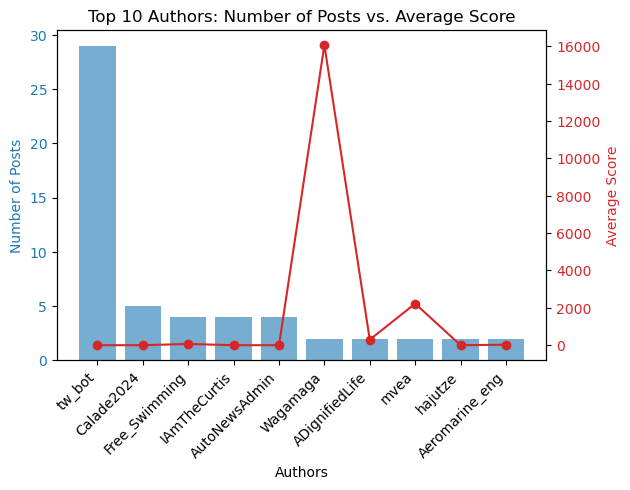

In [1058]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(author_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(author_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Number of Posts vs. Average Score')
plt.show()

Number of posts assumption does not hold here.

In [1060]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'Wagamaga' and include sentiment scores
Wagamaga_posts = [post for post in posts_best if post.author and post.author.name == 'Wagamaga']

print(f"\nPosts from author 'Wagamaga':")
for post in Wagamaga_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'Wagamaga':
Subreddit: science
Title: A team of scientists has developed a 'smart' food packaging material that is biodegradable, sustainable and kills microbes that are harmful to humans. It could also extend the shelf-life of fresh fruit by two to three days.
Text:


Score: 31433
Number of Comments: 591
Author: Wagamaga
URL: https://www.ntu.edu.sg/news/detail/bacteria-killing-food-packaging-that-keeps-food-fresh
Sentiment Score: 0.20476190476190478
----
Subreddit: Futurology
Title: 77% Of People Want To Learn How To Live More Sustainably. A significant majority of Americans and Australians are intent on learning more about humanity’s impact on the environment, and what they can do to live a more sustainable lifestyle.
Text:


Score: 699
Number of Comments: 57
Author: Wagamaga
URL: https://online.scu.edu.au/blog/going-green/
Sentiment Score: 0.3579545454545454
----


This time the longer title did not get the higher score, though the lenghts do not differ much.

##### More negative More score?

In [1062]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_sentiment = defaultdict(list)

In [1063]:
# Analyze sentiment for posts by top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    if author_name in dict(top_authors):
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        author_sentiment[author_name].append(sentiment)

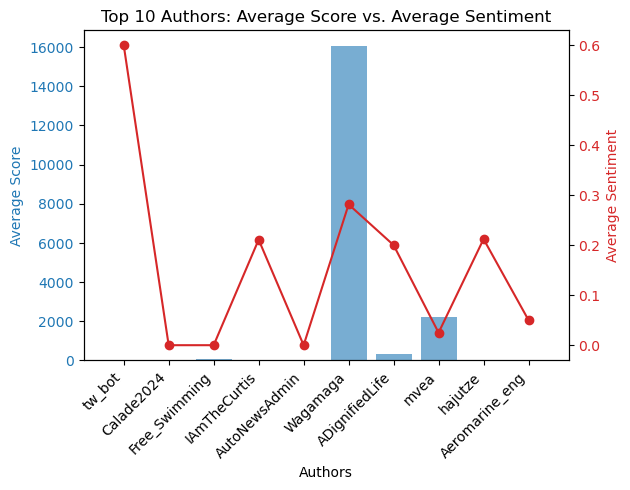

In [1064]:
# Calculate average sentiment and average scores
avg_sentiment = [sum(author_sentiment[author]) / len(author_sentiment[author]) if author_sentiment[author] else 0 for author in 
                 author_names]

# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(author_names, avg_sentiment, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Average Sentiment')
plt.show()

Still we can't say the sentiment assumption holds.

At this point so far we rarely have seen too negatively sentimented post.

In [1066]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'mike_gifford' and include sentiment scores
tw_bot_posts = [post for post in posts_best if post.author and post.author.name.lower() == 'tw_bot']

In [1067]:
print(f"\nPosts from author 'tw_bot':")
for post in tw_bot_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'tw_bot':
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
Number of Comments: 0
Author: tw_bot
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=US&ceid=US:en
Sentiment Score: 0.6
----
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
Number of Comments: 0
Author: tw_bot
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=US&ceid=US:en
Sentiment Score: 0.6
----
Subreddit: tomorrowsworld
Title: Ancient farm practice could help sustain humans on Mars - Popular Science
Text:


Score: 1
Number of Comments: 0
Author: tw_bot
URL: https://news.google.com/atom/articles/CBMiMWh0dHBzOi8vd3d3LnBvcHNjaS5jb20vc2NpZW5jZS9tYXJzLWZhcm1zLWZ1dHVyZS_SAQA?oc=5&hl=en-US&gl=

Just like in the previous section, the outlier in the sentiment graph repeated a positive news over and over again. 

The difference is posting only in one subreddit (tomorrowsworld)

This can explain why tomorrowsworld did not have much success in gaining score and member, though it has a high number of posts.

##### More karma more score?

In [1069]:
# Perform the search and retrieve top posts
posts_best = list(reddit.subreddit('all').search(query, sort=sort_by, limit=limit))
author_karma = {}

In [1070]:
# Collect scores and karma data for the top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    
    if author_name in author_names:
        #author_scores[author_name].append(post.score)
        
        # Fetch karma for the top authors if not already fetched
        if author_name not in author_karma:
            try:
                author = reddit.redditor(author_name)
                
                post_karma = author.link_karma  # Post karma
                comment_karma = author.comment_karma  # Comment karma
                author_karma[author_name] = post_karma + comment_karma  # Sum of both karmas
            except Exception as e:
                print(f"An error occurred for author {author_name}: {e}")
                author_karma[author_name] = None  # Set karma to None in case of error

In [1071]:
# Prepare data for plotting
karma_values = []
#avg_scores = []

In [1072]:
for author_name in author_names:
    if author_karma.get(author_name) is not None:  # Ensure valid karma data
        #avg_scores.append(sum(author_scores[author_name]) / len(author_scores[author_name]))
        karma_values.append(author_karma[author_name])

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/1090625036.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(author_names, rotation=45, ha='right')


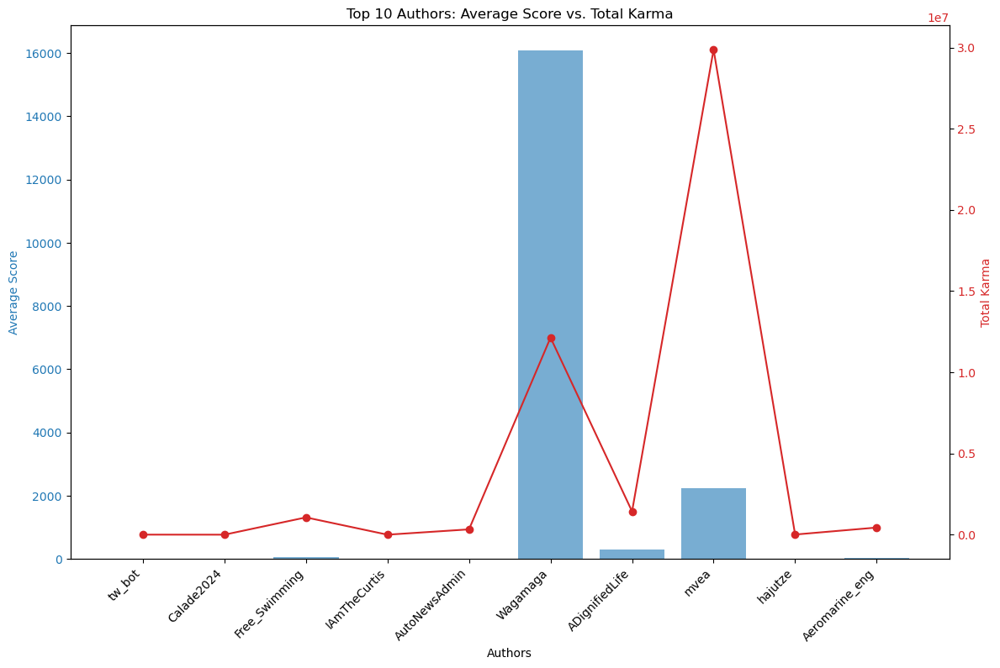

In [1073]:
# Plotting
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for average scores
color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(author_names, rotation=45, ha='right')

# Line plot for total karma
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Karma', color=color)
ax2.plot(author_names, karma_values, color=color, marker='o', label='Total Karma')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Total Karma')
plt.show()

Though karma is caluclated based on scores, but we can see that highest karamd person overall, might not get the highest scores in a certain topic, in this case human sustainability.

However we can see that the 3 highest scored authores are also highest kramad ones, though not in the same order.

In [1075]:
# Specify the author
author_name = 'mvea'

# Initialize data structures to store details
posts_details = []
comments_sentiment = defaultdict(list)

In [1076]:
# Process posts to filter those by Wagamaga
for post in posts_best:
    if post.author and post.author.name == author_name:
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        posts_details.append({
            'id': post.id,
            'title': post.title,
            'score': post.score,
            'url': post.url,
            'sentiment': sentiment,
            'num_comments': post.num_comments,
            'created_utc': datetime.fromtimestamp(post.created_utc)
        })

        # Fetch comments on Wagamaga's posts and analyze sentiment
        post.comments.replace_more(limit=None)  # Replace "MoreComments" objects with actual comments
        for comment in post.comments.list():
            comment_sentiment = TextBlob(comment.body).sentiment.polarity
            comments_sentiment[post.id].append(comment_sentiment)

In [1077]:
# Fetch Redditor's karma
try:
    author = reddit.redditor(author_name)
   
    post_karma = author.link_karma  # Post karma
    comment_karma = author.comment_karma  # Comment karma
except Exception as e:
    print(f"An error occurred while fetching data for {author_name}: {e}")
    post_karma = comment_karma = None

In [1078]:
# Print the data
print(f"Author: {author_name}")
print(f"Post Karma: {post_karma}")
print(f"Comment Karma: {comment_karma}\n")

print("Posts by mvea in the search results:")
for post in posts_details:
    print(f"Title: {post['title']}")
    print(f"Score: {post['score']}")
    print(f"Sentiment: {post['sentiment']}")
    print(f"Number of Comments: {post['num_comments']}")
    print(f"URL: {post['url']}")
    print(f"Creation Date: {post['created_utc']}")
    
    # Print sentiment of comments for this post
    post_comments_sentiments = comments_sentiment.get(post['id'], [])
    if post_comments_sentiments:
        avg_comment_sentiment = sum(post_comments_sentiments) / len(post_comments_sentiments)
        print(f"Average Comment Sentiment: {avg_comment_sentiment:.2f}")
    else:
        print("No comments found or all comments have neutral sentiment.")
    
    print("----")

Author: mvea
Post Karma: 29487675
Comment Karma: 384385

Posts by mvea in the search results:
Title: Placing human decision-making, known as the "optometrist's algorithm", at the center of computer optimization, yielded sustained hot plasmas in a colliding beam fusion reactor.
Score: 3153
Sentiment: 0.049999999999999996
Number of Comments: 100
URL: https://www.nature.com/articles/s41598-017-06645-7
Creation Date: 2017-07-30 15:56:19
Average Comment Sentiment: 0.06
----
Title: Not having children a way to cut a person's carbon footprint, some environmental groups say - Voluntary Human Extinction Movement, Population Matters say having fewer kids key to sustaining our existence
Score: 1312
Sentiment: 0.0
Number of Comments: 227
URL: https://www.cbc.ca/news/canada/british-columbia/groups-believe-not-having-children-is-way-to-cut-a-person-s-carbon-footprint-1.5090786
Creation Date: 2019-04-10 14:24:48
Average Comment Sentiment: 0.07
----


The reason might be that the author is not active in this subject, having written only 2 posts.

## Economic sustainability

Economic sustainability refers to practices that support long-term economic growth without negatively impacting social, environmental,
and cultural aspects of the community.

In [1081]:
query = 'economic sustainability'
sort_by = 'best'  # Sort by score

In [1082]:
limit = 2000 # Number of top posts to fetch

# Perform the search and retrieve top posts
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

In [1083]:
# Initialize a counter
counter = 0
max_posts = 10

In [1084]:
# Print information about 10 best post
for post in posts_best:
    
    if counter >= max_posts:
        break
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Creation Date: {datetime.fromtimestamp(post.created_utc)}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print('----')
    
    # Increment the counter
    counter += 1

Subreddit: eupersonalfinance
Creation Date: 2023-10-05 13:46:48
Title: How is EU economically sustainable?
Text:
My experience with Ireland and Germany has me questioning how Europe's model is sustainable. I find many European socialism to be without checks and balances, very much exploited at the expense of hard working tax payers with a very little in return. 

Ireland's whole economy is sham. Germany has a real economy but I don't find them efficient in terms of spending. Also, I think peak of German economy is gone.

I am struggling to believe any of the tax money paid by me (I pay 10x of local avg in income taxes) will be worth it. Also, I don't think Govt will be able to keep paying for pension and/or healthcare. Most govts in EU are running in deficit and economy is getting notably worse.

What's your thoughts on this?

This is consuming me to the extent that I am believing more and more that countries with "no tax, no representation" i.e. the likes of UAE or Singapore is better

### Dig deep in subreddits

In [1086]:
# Dictionary to store the count of posts in each subreddit
subreddit_count = defaultdict(int)

for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_count[subreddit_name] += 1

In [1087]:
# Sort the subreddits by the number of posts in descending order
sorted_subreddits = sorted(subreddit_count.items(), key=lambda x: x[1], reverse=True)
    
# Get the top N subreddits
N = 10
top_subreddits = sorted_subreddits[:N]

In [1088]:
subreddit_names = []
num_posts = []
num_members = []

In [1089]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    description = subreddit.public_description
    members = subreddit.subscribers

    subreddit_names.append(subreddit_name)
    num_posts.append(count)
    num_members.append(members)

    print(f'Subreddit: {subreddit_name}')
    print(f'   Number of posts: {count}')
    print(f'   Number of members: {members}')
    print(f'   Description: {description}\n')

Subreddit: tomorrowsworld
   Number of posts: 37
   Number of members: 1384
   Description: The future of the world

Subreddit: AutoNewspaper
   Number of posts: 7
   Number of members: 22485
   Description: Automated News Feed Subreddit

No Censorship, Just News.

Subreddit: politics
   Number of posts: 4
   Number of members: 8610595
   Description: /r/Politics is for news and discussion about U.S. politics.

Subreddit: AskEconomics
   Number of posts: 4
   Number of members: 1310387
   Description: A central repository for questions about economic theory, research, and policy.

Please read the rules before posting, as we remove all comments which break the rules. Answers must be in-depth and comprehensive, or they will be removed. Posts should be in the form of a question.

Subreddit: economy
   Number of posts: 4
   Number of members: 1027906
   Description: Forum for economy, business, politics, stocks, bonds, product releases, IPOs, advice, news, investment, videos, predictions, 

Science is present in the top 10 as it was also in the 2 previous subjects.

Also, we are starting to see that in each subject, the top subredddit, has way higher posts than others. 

#### Assumption checks

##### More post More score?

In [1093]:
subreddit_scores = defaultdict(list)
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Collect data for each post
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_scores[subreddit_name].append(post.score)

In [1094]:
# Collect data for plotting
top_subreddit_names = []
num_posts = []
avg_scores = []

In [1095]:
for subreddit_name, count in top_subreddits:
    top_subreddit_names.append(subreddit_name)
    num_posts.append(count)
    avg_scores.append(sum(subreddit_scores[subreddit_name]) / len(subreddit_scores[subreddit_name]))

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/3378047863.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')


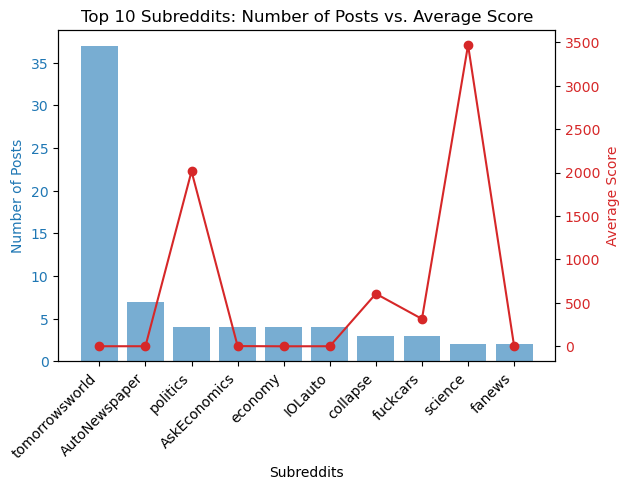

In [1096]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(top_subreddit_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(top_subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Number of Posts vs. Average Score')
plt.show()

As before, the assumption does not seem to hold.

In [1098]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the 'surveycircle' subreddit
science_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'science']

In [1099]:
print(f"\nPosts from 'science' subreddit: ")
for post in science_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'science' subreddit: 
Subreddit: science
Title: Fracking is one of the least sustainable ways to produce electricity, says new study. When comparing environmental, economic and social sustainability, scientists find shale gas extraction ranks 7th out of 9 different energy sources.
Text:


Score: 5695
URL: http://www.independent.co.uk/environment/fracking-electricity-production-energy-shale-gas-extraction-sustainable-a8160661.html
Sentiment Score: 0.01393939393939394
----
Subreddit: science
Title: We can get 100 percent of our energy from wind, 
water, and solar power. And we can do it today—
efficiently, reliably, safely, sustainably, and 
economically.
Text:


Score: 1245
URL: http://spectrum.ieee.org/energy/renewables/wind-water-and-solar-power-for-the-world/0
Sentiment Score: 0.4
----


The first post was also present in the environmental sustainability analysis.

It has more words in the title, and more score, and it is more close to neutral than positve.

##### More member More score?

In [1102]:
subreddit_names = []

num_members = []

In [1103]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    num_members.append(subreddit.subscribers)
    subreddit_names.append(subreddit_name)

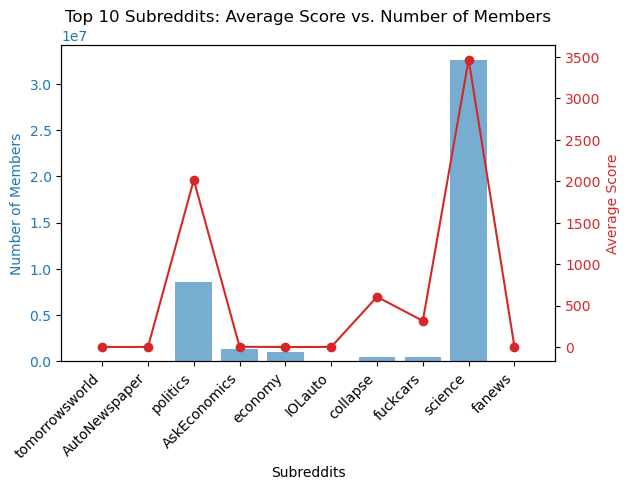

In [1104]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Members', color=color)
ax1.bar(subreddit_names, num_members, color=color, alpha=0.6, label='Number of Members')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(subreddit_names)))
ax1.set_xticklabels(subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Average Score vs. Number of Members')
plt.show()

Not completely, but more or less follows the assumption.

##### More negative more score?

In [1107]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

subreddit_sentiment = defaultdict(list)

In [1108]:
sentiment_eco = defaultdict(list)

# Analyze sentiment for posts in top subreddits
for post in posts_best:
    
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"
    
    if subreddit_name in dict(top_subreddits):
        text = (post.title or "") + ' ' + (post.selftext or "")
        if text.strip():  # Ensure there's some text to analyze
            sentiment = TextBlob(text).sentiment.polarity
            subreddit_sentiment[subreddit_name].append(sentiment)
            sentiment_eco[subreddit_name].append((author_name, sentiment))
            
        else:
            print(f"Empty text for post in subreddit: {subreddit_name}")

In [1109]:
# Calculate average sentiment for each subreddit
avg_sentiment = {
    subreddit: sum(sentiments) / len(sentiments) if sentiments else 0
    for subreddit, sentiments in subreddit_sentiment.items()
}

In [1110]:
subreddits = [subreddit for subreddit, _ in top_subreddits]

sentiments = [avg_sentiment.get(subreddit, 0) for subreddit in subreddits]

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/552014847.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(subreddits, rotation=45, ha='right')


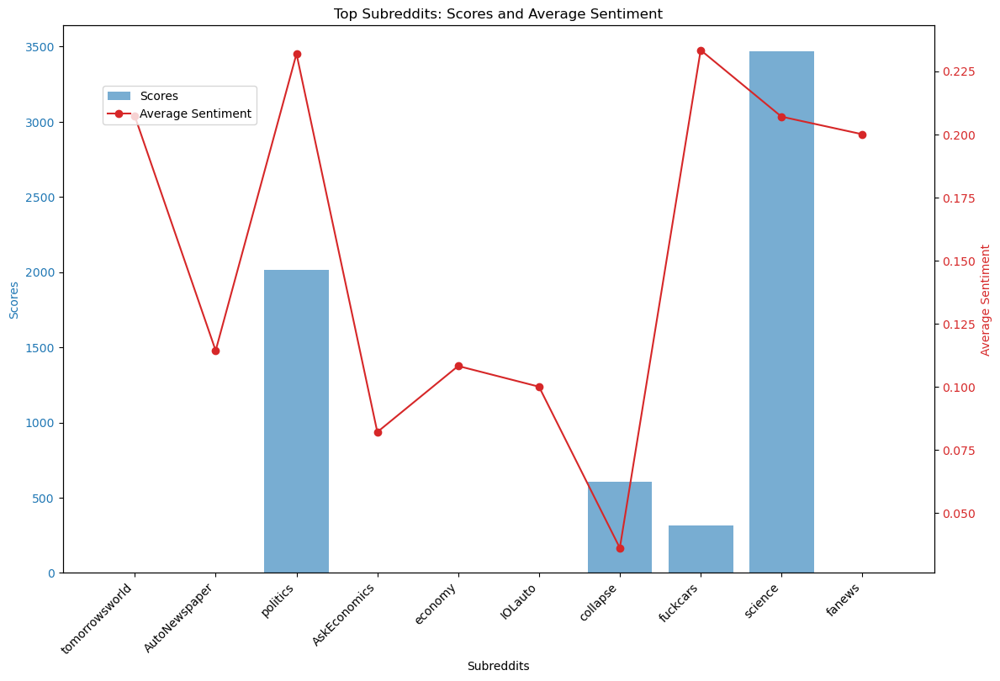

In [1111]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Scores', color=color)
ax1.bar(subreddits, avg_scores, color=color, alpha=0.6, label='Scores')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(subreddits, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(subreddits, sentiments, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.9))
plt.title('Top Subreddits: Scores and Average Sentiment')
plt.show()

Again as in the two previous sections, average sentiments across subreddits are positive.

Highly scored subreddits have either very high positive sentiment ( in respect to others , or in the case of the collapse subreddit, probably because of the subject of the subreddit, close to neutral.

However, we can not say having high sentiment always is correlated with having very high or close to 0 sentiments, as this is not the case for tomorrowsworld.

In any case the assumption, as before, does not hold.

In [1113]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the subreddit
collapse_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'collapse']

In [1114]:
print(f"\nPosts from 'collapse' subreddit:")
for post in collapse_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'collapse' subreddit:
Subreddit: collapse
Title: The Fallacy of Degrowth: Why Economic Growth Is Essential for Sustainable Progress
Text:


Score: 0
URL: https://www.thegnosi.com/p/the-fallacy-of-degrowth-why-economic
Sentiment Score: 0.1
----
Subreddit: collapse
Title: Infinite Growth Is Possible And It Can Be Sustainable | Economics Explained (Lethal levels of Copium within)
Text:


Score: 113
URL: https://www.youtube.com/watch?v=yxsLrteNl0E&ab_channel=EconomicsExplained
Sentiment Score: 0.0
----
Subreddit: collapse
Title: Overconsumption and growth economy key drivers of environmental crises - study | The researchers say that "green" or "sustainable growth" is a myth. "As long as there is growth—both economically and in population—technology cannot keep up, the overall environmental impacts will only increase."
Text:


Score: 1700
URL: https://phys.org/news/2020-06-overconsumption-growth-economy-key-drivers.html
Sentiment Score: 0.008333333333333331
----


One thing that again can be noticed here is that the highest scored post is the longest-titled post.

### Dig deep in authors

In [1117]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_count = defaultdict(int)

In [1118]:
# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

In [1119]:
# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# Get the top N authors
top_authors = sorted_authors[:10]

In [1120]:
author_names = [author for author, count in top_authors]

num_posts = [count for author, count in top_authors]

In [1121]:
print(f'\nTop {10} most frequent authors:')
for i, (author, count) in enumerate(top_authors, 1):
        print(f'{i}. Author: {author}, Number of posts: {count}')


Top 10 most frequent authors:
1. Author: tw_bot, Number of posts: 37
2. Author: AutoNewsAdmin, Number of posts: 7
3. Author: AutoNewspaperAdmin, Number of posts: 7
4. Author: Postgrowth_Snail, Number of posts: 5
5. Author: GroundbreakingSong89, Number of posts: 4
6. Author: SugarProfessional987, Number of posts: 4
7. Author: codepeach_, Number of posts: 3
8. Author: Pilast, Number of posts: 2
9. Author: Both_Wash908, Number of posts: 2
10. Author: mvea, Number of posts: 2


In [1122]:
author_details = []

author_eco = []

for i, (author_name, count) in enumerate(top_authors, 1):
    if author_name == "[deleted]":
        post_karma = comment_karma = cake_day = "N/A"
    else:
        author = reddit.redditor(author_name)
        post_karma = author.link_karma
        comment_karma = author.comment_karma
        cake_day = datetime.fromtimestamp(author.created_utc).strftime('%Y-%m-%d')

    author_details.append((author_name, count, post_karma, comment_karma, cake_day))
    
    author_eco.append((author_name, count, post_karma, comment_karma, cake_day))

    print(f'{i}. Author: {author_name}')
    print(f'   Number of posts: {count}')
    print(f'   Post karma: {post_karma}')
    print(f'   Comment karma: {comment_karma}')
    print(f'   Cake day: {cake_day}')
    print()

1. Author: tw_bot
   Number of posts: 37
   Post karma: 3155
   Comment karma: 0
   Cake day: 2019-07-12

2. Author: AutoNewsAdmin
   Number of posts: 7
   Post karma: 327857
   Comment karma: 10
   Cake day: 2016-10-27

3. Author: AutoNewspaperAdmin
   Number of posts: 7
   Post karma: 308761
   Comment karma: 1
   Cake day: 2016-10-29

4. Author: Postgrowth_Snail
   Number of posts: 5
   Post karma: 830
   Comment karma: 30
   Cake day: 2023-04-03

5. Author: GroundbreakingSong89
   Number of posts: 4
   Post karma: 2
   Comment karma: 0
   Cake day: 2020-07-01

6. Author: SugarProfessional987
   Number of posts: 4
   Post karma: 1
   Comment karma: 2
   Cake day: 2024-05-07

7. Author: codepeach_
   Number of posts: 3
   Post karma: 1780
   Comment karma: 57
   Cake day: 2022-02-04

8. Author: Pilast
   Number of posts: 2
   Post karma: 451971
   Comment karma: 9304
   Cake day: 2012-10-18

9. Author: Both_Wash908
   Number of posts: 2
   Post karma: 115
   Comment karma: 994
   Cak

#### Assumption checks

##### More post more score?

In [1125]:
author_names = [author for author, _, _, _, _ in author_details]

num_posts = [count for _, count, _, _, _ in author_details]

In [1126]:
combined_karmas = [post_karma + comment_karma if post_karma != "N/A" else 0 for _, _, post_karma, comment_karma, _ in author_details]

author_scores = defaultdict(int)

In [1127]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Collect data for each post
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_scores[author_name] += post.score

In [1128]:
total_scores = [author_scores[author] for author in author_names]

# Calculate average scores for plotting
avg_scores = [total_scores[i] / num_posts[i] if num_posts[i] > 0 else 0 for i in range(len(total_scores))]

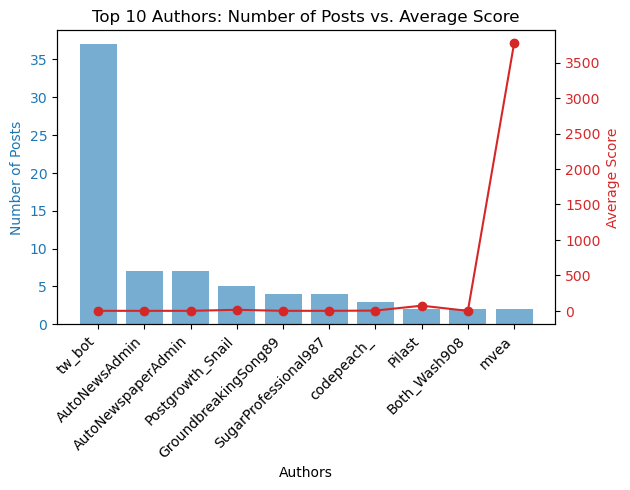

In [1129]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(author_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(author_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Number of Posts vs. Average Score')
plt.show()

Again like in the previous topic, we can see that tw_bot is the odd one out in terms of number of posts and it did not help with the score.

Rather, the amazing thing here is again mvea with least posts but the highest score.

In [1131]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'Wagamaga' and include sentiment scores
mvea_posts = [post for post in posts_best if post.author and post.author.name == 'mvea']

print(f"\nPosts from author 'mvea':")
for post in mvea_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'mvea':
Subreddit: science
Title: Fracking is one of the least sustainable ways to produce electricity, says new study. When comparing environmental, economic and social sustainability, scientists find shale gas extraction ranks 7th out of 9 different energy sources.
Text:


Score: 5694
Number of Comments: 275
Author: mvea
URL: http://www.independent.co.uk/environment/fracking-electricity-production-energy-shale-gas-extraction-sustainable-a8160661.html
Sentiment Score: 0.01393939393939394
----
Subreddit: Futurology
Title: Internet companies too big? FTC chair says more than market share counts: “we are spiraling towards a dystopian future where a few giant technology companies will ultimately gain sustained control over our economic lives.”
Text:


Score: 1859
Number of Comments: 141
Author: mvea
URL: https://www.usatoday.com/story/tech/2017/09/12/internet-companies-too-big-ftc-chair-says-more-than-market-share-counts/656394001/
Sentiment Score: 0.07142857142857142
-

As seen before, posting in the science subreddit about sustainability can be helpful to get score.

here also the longer title has the higher score.

both posts are slightly positive.

It is overall very interesting that such a highly scientific post about fracking is seen over and over in this analysis.

##### More negative More score?

In [1134]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_sentiment = defaultdict(list)

In [1135]:
# Analyze sentiment for posts by top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    if author_name in dict(top_authors):
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        author_sentiment[author_name].append(sentiment)

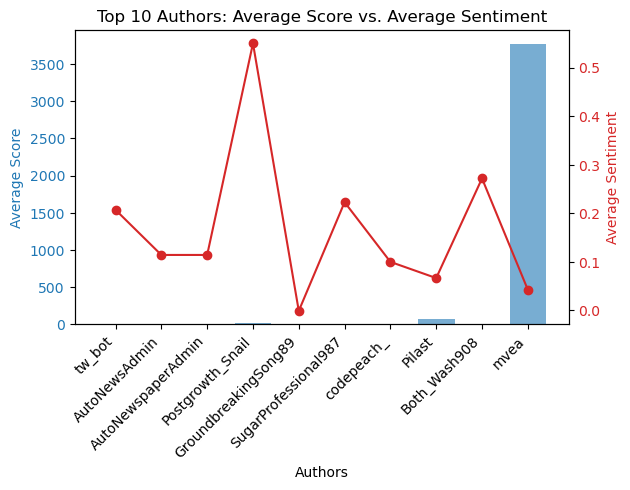

In [1136]:
# Calculate average sentiment and average scores
avg_sentiment = [sum(author_sentiment[author]) / len(author_sentiment[author]) if author_sentiment[author] else 0 for author in 
                 author_names]

# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(author_names, avg_sentiment, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Average Sentiment')
plt.show()

The assumption does not hold, but we can see that being positive and close to 0 might have helped.

Also being severely positive, but not much.

In [1138]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'mike_gifford' and include sentiment scores
postgrowth_snail_posts = [post for post in posts_best if post.author and post.author.name.lower() == 'postgrowth_snail']

In [1139]:
print(f"\nPosts from author 'postgrowth_snail':")
for post in postgrowth_snail_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'postgrowth_snail':
Subreddit: solarpunk
Title: Embracing Degrowth: The Controversial Path to Sustainable Economics
Text:


Score: 26
Number of Comments: 1
Author: Postgrowth_Snail
URL: https://www.youtube.com/watch?v=v1MpAf4KRbI
Sentiment Score: 0.55
----
Subreddit: capitalism_in_decay
Title: Embracing Degrowth: The Controversial Path to Sustainable Economics
Text:


Score: 12
Number of Comments: 2
Author: Postgrowth_Snail
URL: https://www.youtube.com/watch?v=v1MpAf4KRbI
Sentiment Score: 0.55
----
Subreddit: socialism
Title: Embracing Degrowth: The Controversial Path to Sustainable Economics
Text:


Score: 17
Number of Comments: 1
Author: Postgrowth_Snail
URL: https://www.youtube.com/watch?v=v1MpAf4KRbI
Sentiment Score: 0.55
----
Subreddit: Degrowth
Title: Embracing Degrowth: The Controversial Path to Sustainable Economics
Text:


Score: 10
Number of Comments: 1
Author: Postgrowth_Snail
URL: https://www.youtube.com/watch?v=v1MpAf4KRbI
Sentiment Score: 0.55
----
Subr

Again as we saw before, the oddly positve authors have bot-like behaviors.

##### More karma more score?

In [1142]:
# Perform the search and retrieve top posts
posts_best = list(reddit.subreddit('all').search(query, sort=sort_by, limit=limit))

author_karma = {}

In [1143]:
# Collect scores and karma data for the top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    
    if author_name in author_names:
        #author_scores[author_name].append(post.score)
        
        # Fetch karma for the top authors if not already fetched
        if author_name not in author_karma:
            try:
                author = reddit.redditor(author_name)
                
                post_karma = author.link_karma  # Post karma
                comment_karma = author.comment_karma  # Comment karma
                author_karma[author_name] = post_karma + comment_karma  # Sum of both karmas
            except Exception as e:
                print(f"An error occurred for author {author_name}: {e}")
                author_karma[author_name] = None  # Set karma to None in case of error

In [1144]:
# Prepare data for plotting
karma_values = []

for author_name in author_names:
    if author_karma.get(author_name) is not None:  # Ensure valid karma data
        #avg_scores.append(sum(author_scores[author_name]) / len(author_scores[author_name]))
        karma_values.append(author_karma[author_name])

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/1090625036.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(author_names, rotation=45, ha='right')


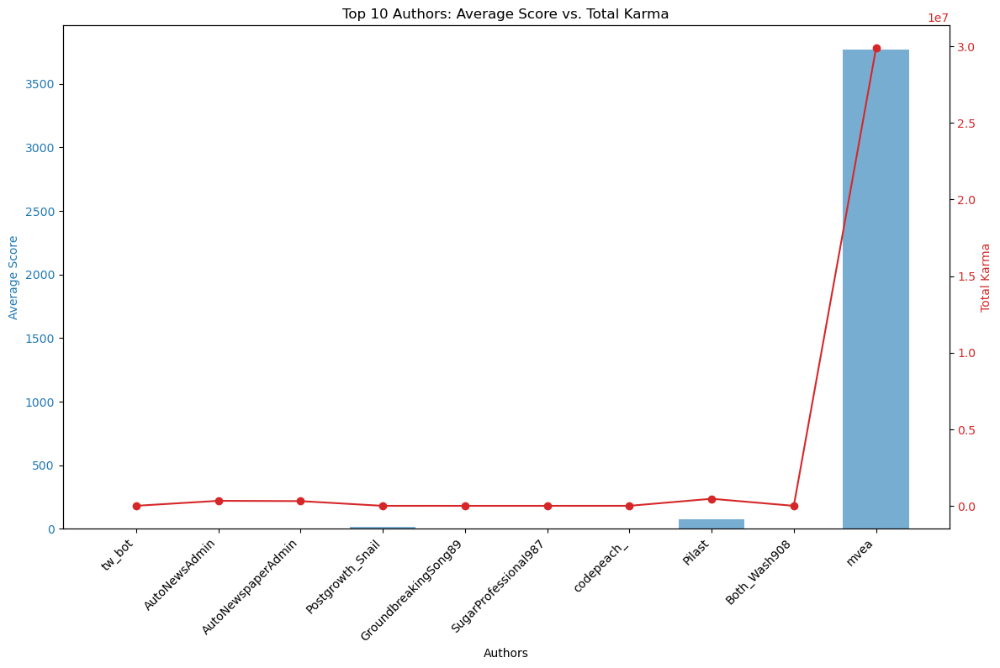

In [1145]:
# Plotting
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for average scores
color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(author_names, rotation=45, ha='right')

# Line plot for total karma
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Karma', color=color)
ax2.plot(author_names, karma_values, color=color, marker='o', label='Total Karma')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Total Karma')
plt.show()

More or less holds.

Again mvea is the highest karmad.

In [1147]:
karma_values

[3155, 327867, 308762, 860, 2, 3, 1837, 461275, 1109, 29872069]

## Social sustainability

Social sustainability can be defined as specifying and managing both positive and negative impacts of systems, processes, organizations, and activities on people and social life.

Social sustainability is about identifying and managing business impacts, both positive and negative, on people.

Social sustainability issues are focused on mitigating concerns like racism and discrimination in social communities, schools, and workplaces.

Social sustainability is about things like bringing people together, creating communities and shared experiences that build trust and help promote empowerment.



In [1149]:
query = 'social sustainability'

sort_by = 'best'  # Sort by score

In [1150]:
limit = 2000 # Number of top posts to fetch

# Perform the search and retrieve top posts
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

In [1151]:
# Initialize a counter
counter = 0
max_posts = 10

In [1152]:
# Print information about 10 best post
for post in posts_best:
    
    if counter >= max_posts:
        break
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Creation Date: {datetime.fromtimestamp(post.created_utc)}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print('----')
    
    # Increment the counter
    counter += 1

Subreddit: antiwork
Creation Date: 2022-03-12 02:55:06
Title: What's degrading about work is the social relations that sustain it
Text:


Score: 18524
Number of Comments: 383
Author: chichilcitlalli
URL: https://i.redd.it/ztrehaiyzum81.jpg
----
Subreddit: GreenAndPleasant
Creation Date: 2024-04-04 08:17:31
Title: Capitalism! The ideology so good, it needs socialism to sustain it 😀
Text:


Score: 2037
Number of Comments: 140
Author: UnderHisEye1411
URL: https://i.redd.it/mc92870qnesc1.jpeg
----
Subreddit: psychology
Creation Date: 2022-12-01 15:17:00
Title: Traumatic social experience blocks social reward and promotes sustained social avoidance, study finds
Text:


Score: 1315
Number of Comments: 105
Author: flacao9
URL: https://medicalxpress.com/news/2022-11-traumatic-social-blocks-reward-sustained.html
----
Subreddit: science
Creation Date: 2018-01-16 13:04:45
Title: Fracking is one of the least sustainable ways to produce electricity, says new study. When comparing environmental, eco

### Dig deep in subreddits

In [1154]:
# Dictionary to store the count of posts in each subreddit
subreddit_count = defaultdict(int)

for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_count[subreddit_name] += 1

In [1155]:
# Sort the subreddits by the number of posts in descending order
sorted_subreddits = sorted(subreddit_count.items(), key=lambda x: x[1], reverse=True)
    
# Get the top N subreddits
N = 10
top_subreddits = sorted_subreddits[:N]

In [1156]:
subreddit_names = []
num_posts = []
num_members = []

In [1157]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    description = subreddit.public_description
    members = subreddit.subscribers

    subreddit_names.append(subreddit_name)
    num_posts.append(count)
    num_members.append(members)

    print(f'Subreddit: {subreddit_name}')
    print(f'   Number of posts: {count}')
    print(f'   Number of members: {members}')
    print(f'   Description: {description}\n')

Subreddit: SurveyCircle
   Number of posts: 15
   Number of members: 6425
   Description: SurveyCircle.com is the world‘s largest community for finding survey participants and producing better research results through mutual support.

The website can be used to recruit participants for surveys, research studies, experiments, and market research projects.

SurveyCircle is made for those who need survey participants (e.g. students, PhD students, researchers, founders) and for everyone who simply loves to experience and support exciting research projects.

Are you curious? Join now!

Subreddit: SampleSize
   Number of posts: 11
   Number of members: 223440
   Description: A place for surveys and polls to be posted. Research studies for school purposes are welcome as well as opinion polls

We are also a place for people who enjoy responding to surveys to gather and help people obtain responses for their research.

Questions about a mild level of statistics or wording of surveys are also pe

#### Assumption checks

##### More post More score?

In [1160]:
subreddit_scores = defaultdict(list)
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Collect data for each post
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    subreddit_scores[subreddit_name].append(post.score)

In [1161]:
# Collect data for plotting
top_subreddit_names = []
num_posts = []
avg_scores = []

In [1162]:
for subreddit_name, count in top_subreddits:
    top_subreddit_names.append(subreddit_name)
    num_posts.append(count)
    avg_scores.append(sum(subreddit_scores[subreddit_name]) / len(subreddit_scores[subreddit_name]))

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/3378047863.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')


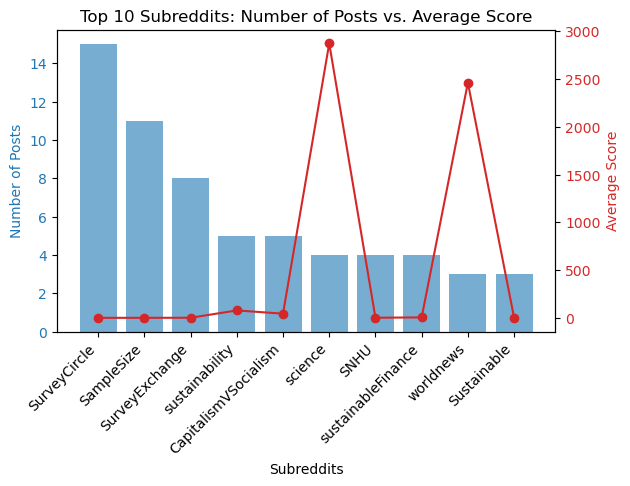

In [1163]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(top_subreddit_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(top_subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(top_subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Number of Posts vs. Average Score')
plt.show()

In [1164]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the 'surveycircle' subreddit
science_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'science']

In [1165]:
print(f"\nPosts from 'science' subreddit: ")
for post in science_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'science' subreddit: 
Subreddit: science
Title: Fracking is one of the least sustainable ways to produce electricity, says new study. When comparing environmental, economic and social sustainability, scientists find shale gas extraction ranks 7th out of 9 different energy sources.
Text:


Score: 5682
URL: http://www.independent.co.uk/environment/fracking-electricity-production-energy-shale-gas-extraction-sustainable-a8160661.html
Sentiment Score: 0.01393939393939394
----
Subreddit: science
Title: Chronic inflammation caused by stress is affecting our collective thinking and behavior, and it’s keeping society in a “self-sustaining cycle of societal dysfunction and environmental degradation” which is keeping us from taking action on issues like climate change and social unrest
Text:


Score: 2729
URL: https://www.frontiersin.org/news/2024/03/12/chronic-stress-inflammation-societal-environmental-impacts
Sentiment Score: 0.06666666666666667
----
Subreddit: science
Title: The so

##### More member More score?

In [1167]:
subreddit_names = []

num_members = []

In [1168]:
for subreddit_name, count in top_subreddits:
    subreddit = reddit.subreddit(subreddit_name)
    num_members.append(subreddit.subscribers)
    subreddit_names.append(subreddit_name)

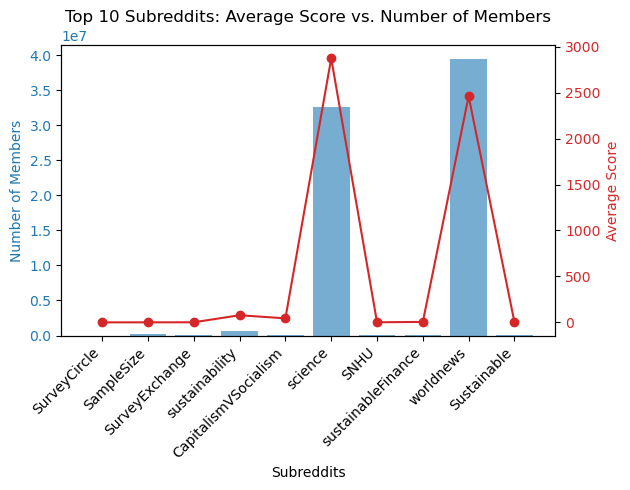

In [1169]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Number of Members', color=color)
ax1.bar(subreddit_names, num_members, color=color, alpha=0.6, label='Number of Members')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(subreddit_names)))
ax1.set_xticklabels(subreddit_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(subreddit_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Subreddits: Average Score vs. Number of Members')
plt.show()

Assumption a bit relatable

##### More negative more score?

In [1172]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

subreddit_sentiment = defaultdict(list)

In [1173]:
sentiment_social = defaultdict(list)

# Analyze sentiment for posts in top subreddits
for post in posts_best:
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"
    
    if subreddit_name in dict(top_subreddits):
        text = (post.title or "") + ' ' + (post.selftext or "")
        if text.strip():  # Ensure there's some text to analyze
            sentiment = TextBlob(text).sentiment.polarity
            subreddit_sentiment[subreddit_name].append(sentiment)
            sentiment_social[subreddit_name].append((author_name, sentiment))
            
        else:
            print(f"Empty text for post in subreddit: {subreddit_name}")

In [398]:
# Calculate average sentiment for each subreddit
avg_sentiment = {
    subreddit: sum(sentiments) / len(sentiments) if sentiments else 0
    for subreddit, sentiments in subreddit_sentiment.items()
}

In [401]:
subreddits = [subreddit for subreddit, _ in top_subreddits]

sentiments = [avg_sentiment.get(subreddit, 0) for subreddit in subreddits]

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/552014847.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(subreddits, rotation=45, ha='right')


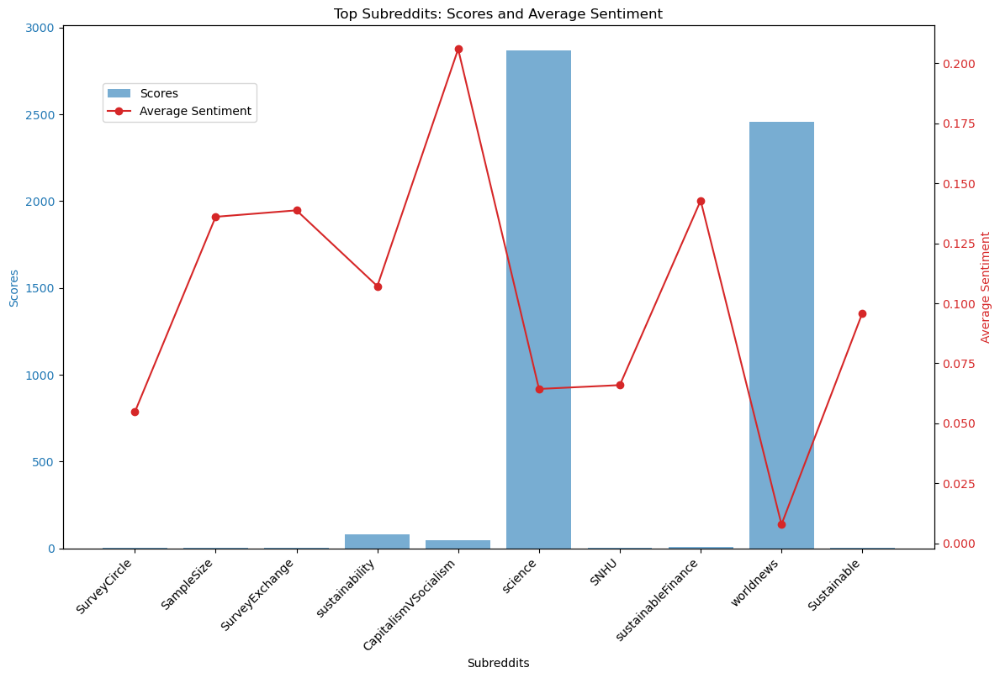

In [403]:
# Plotting the data
fig, ax1 = plt.subplots(figsize=(12, 8))

color = 'tab:blue'
ax1.set_xlabel('Subreddits')
ax1.set_ylabel('Scores', color=color)
ax1.bar(subreddits, avg_scores, color=color, alpha=0.6, label='Scores')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(subreddits, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(subreddits, sentiments, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.9))
plt.title('Top Subreddits: Scores and Average Sentiment')
plt.show()

In [405]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Now, print the posts specifically from the subreddit
worldnews_posts = [post for post in posts_best if post.subreddit.display_name.lower() == 'worldnews']

In [407]:
print(f"\nPosts from 'worldnews' subreddit:")
for post in worldnews_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from 'worldnews' subreddit:
Subreddit: worldnews
Title: The world economy is a direct cause of social breakdown and a key driver of climate change, a green coalition said Thursday launching the first assessment of how governments are regearing their economies towards sustainable growth
Text:


Score: 2656
URL: https://www.france24.com/en/20200123-economy-failing-on-climate-and-equality-ngos
Sentiment Score: 0.03666666666666667
----
Subreddit: worldnews
Title: Billionaire Cartier Owner Sees Wealth Gap Fueling Social Unrest “We cannot have 0.1 percent of 0.1 percent taking all the spoils,” said Rupert, who has a fortune worth $7.5 billion, according to data compiled by Bloomberg. “It’s unfair and it is not sustainable.”
Text:


Score: 4291
URL: http://www.bloomberg.com/news/articles/2015-06-08/billionaire-cartier-owner-sees-wealth-gap-fueling-social-unrest
Sentiment Score: -0.05555555555555556
----
Subreddit: worldnews
Title: Even ‘certified sustainable’ palm oil is linked to wors

### Dig deep in authors

In [410]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_count = defaultdict(int)

In [412]:
# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

In [414]:
# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# Get the top N authors
top_authors = sorted_authors[:10]

In [416]:
author_names = [author for author, count in top_authors]

num_posts = [count for author, count in top_authors]

In [418]:
print(f'\nTop {10} most frequent authors:')

for i, (author, count) in enumerate(top_authors, 1):
        print(f'{i}. Author: {author}, Number of posts: {count}')


Top 10 most frequent authors:
1. Author: surveycircle_bot, Number of posts: 14
2. Author: obeahwoman349, Number of posts: 7
3. Author: Ecogram, Number of posts: 4
4. Author: giorgiodidio, Number of posts: 3
5. Author: Automatic-Plan-2435, Number of posts: 2
6. Author: 2noame, Number of posts: 2
7. Author: assignment_acer, Number of posts: 2
8. Author: No_Investigator_1984, Number of posts: 2
9. Author: Intricate1779, Number of posts: 2
10. Author: meow_55555, Number of posts: 2


In [420]:
author_details = []

author_social = [] 

for i, (author_name, count) in enumerate(top_authors, 1):
    if author_name == "[deleted]":
        post_karma = comment_karma = cake_day = "N/A"
    else:
        author = reddit.redditor(author_name)
        post_karma = author.link_karma
        comment_karma = author.comment_karma
        cake_day = datetime.fromtimestamp(author.created_utc).strftime('%Y-%m-%d')

    author_details.append((author_name, count, post_karma, comment_karma, cake_day))
    
    author_social.append((author_name, count, post_karma, comment_karma, cake_day))

    print(f'{i}. Author: {author_name}')
    print(f'   Number of posts: {count}')
    print(f'   Post karma: {post_karma}')
    print(f'   Comment karma: {comment_karma}')
    print(f'   Cake day: {cake_day}')
    print()

1. Author: surveycircle_bot
   Number of posts: 14
   Post karma: 1326
   Comment karma: 1
   Cake day: 2021-03-02

2. Author: obeahwoman349
   Number of posts: 7
   Post karma: 10
   Comment karma: 3
   Cake day: 2022-04-04

3. Author: Ecogram
   Number of posts: 4
   Post karma: 9
   Comment karma: 18
   Cake day: 2023-03-07

4. Author: giorgiodidio
   Number of posts: 3
   Post karma: 927
   Comment karma: 59
   Cake day: 2020-05-03

5. Author: Automatic-Plan-2435
   Number of posts: 2
   Post karma: 1
   Comment karma: 3
   Cake day: 2024-06-15

6. Author: 2noame
   Number of posts: 2
   Post karma: 654000
   Comment karma: 64234
   Cake day: 2010-08-28

7. Author: assignment_acer
   Number of posts: 2
   Post karma: 16
   Comment karma: 0
   Cake day: 2021-06-16

8. Author: No_Investigator_1984
   Number of posts: 2
   Post karma: 12
   Comment karma: 10
   Cake day: 2023-07-23

9. Author: Intricate1779
   Number of posts: 2
   Post karma: 125396
   Comment karma: 12384
   Cake da

#### Assumption checks

##### More post more score?

In [424]:
author_names = [author for author, _, _, _, _ in author_details]

num_posts = [count for _, count, _, _, _ in author_details]

In [426]:
combined_karmas = [post_karma + comment_karma if post_karma != "N/A" else 0 for _, _, post_karma, comment_karma, _ in author_details]

author_scores = defaultdict(int)

In [428]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Collect data for each post
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_scores[author_name] += post.score

In [430]:
total_scores = [author_scores[author] for author in author_names]

# Calculate average scores for plotting
avg_scores = [total_scores[i] / num_posts[i] if num_posts[i] > 0 else 0 for i in range(len(total_scores))]

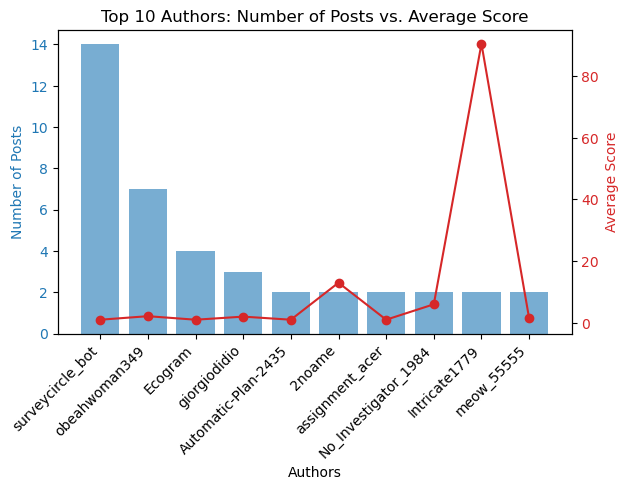

In [432]:
# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Number of Posts', color=color)
ax1.bar(author_names, num_posts, color=color, alpha=0.6, label='Number of Posts')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Score', color=color)
ax2.plot(author_names, avg_scores, color=color, marker='o', label='Average Score')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Number of Posts vs. Average Score')
plt.show()

In [434]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'Wagamaga' and include sentiment scores
mvea_posts = [post for post in posts_best if post.author and post.author.name == 'Intricate1779']

print(f"\nPosts from author 'Intricate1779':")
for post in mvea_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author 'Intricate1779':
Subreddit: EnoughCommieSpam
Title: "For a prosperous and sustainable socialism". Ration store in Cuba.
Text:


Score: 154
Number of Comments: 8
Author: Intricate1779
URL: https://i.redd.it/iwp7d2maxslc1.jpeg
Sentiment Score: 0.0
----
Subreddit: cuba
Title: "For a prosperous and sustainable socialism". Ration store in Cuba.
Text:


Score: 25
Number of Comments: 4
Author: Intricate1779
URL: https://i.redd.it/jmb7063gxslc1.jpeg
Sentiment Score: 0.0
----


##### More negative More score?

In [437]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

author_sentiment = defaultdict(list)

In [439]:
# Analyze sentiment for posts by top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    if author_name in dict(top_authors):
        text = post.title + ' ' + post.selftext
        sentiment = TextBlob(text).sentiment.polarity
        author_sentiment[author_name].append(sentiment)

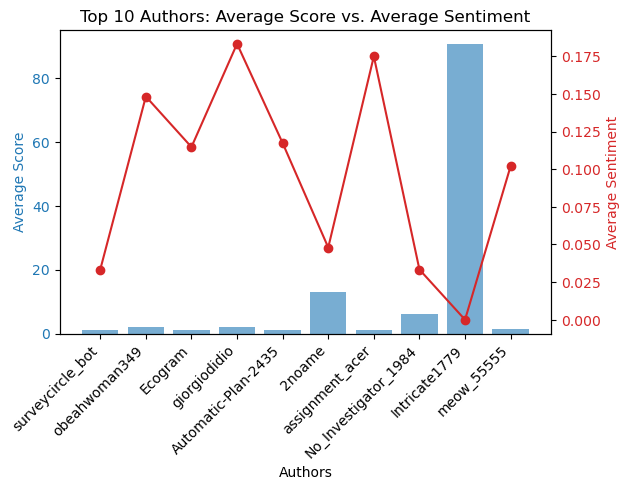

In [440]:
# Calculate average sentiment and average scores
avg_sentiment = [sum(author_sentiment[author]) / len(author_sentiment[author]) if author_sentiment[author] else 0 for author in 
                 author_names]

# Plotting
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(range(len(author_names)))
ax1.set_xticklabels(author_names, rotation=45, ha='right')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Sentiment', color=color)
ax2.plot(author_names, avg_sentiment, color=color, marker='o', label='Average Sentiment')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Average Sentiment')
plt.show()

The 3 least sentiments got the highest scores.

Can't say anything about vice versa.

In [444]:
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)


# Now, print the posts specifically from the author 'mike_gifford' and include sentiment scores
noame_posts = [post for post in posts_best if post.author and post.author.name.lower() == '2noame']

In [446]:
print(f"\nPosts from author '2noame':")
for post in noame_posts:
    text = (post.title or "") + ' ' + (post.selftext or "")
    sentiment = TextBlob(text).sentiment.polarity if text.strip() else None
    
    print(f'Subreddit: {post.subreddit.display_name}')
    print(f'Title: {post.title}')
    print(f'Text:\n{post.selftext}\n')
    print(f'Score: {post.score}')
    print(f'Number of Comments: {post.num_comments}')
    print(f'Author: {post.author.name if post.author else "[deleted]"}')
    print(f'URL: {post.url}')
    print(f'Sentiment Score: {sentiment}')
    print('----')


Posts from author '2noame':
Subreddit: BasicIncome
Title: "The way for a social sustainability? Welfare, labour, minimum wage and universal basic income in the EU"
Text:


Score: 20
Number of Comments: 0
Author: 2noame
URL: https://www.bin-italia.org/the-way-for-a-social-sustainability-welfare-labour-minimum-wage-and-universal-basic-income-in-the-eu-tesi-di-laurea/
Sentiment Score: 0.011111111111111112
----
Subreddit: BasicIncome
Title: Prof. Neumärker: Climate Justice and New Ordoliberalism: The Case for Social Sustainability and UBI
Text:


Score: 8
Number of Comments: 0
Author: 2noame
URL: https://youtu.be/02LtF3IgQVc
Sentiment Score: 0.08484848484848484
----


##### More karma more score?

In [449]:
# Perform the search and retrieve top posts
posts_best = list(reddit.subreddit('all').search(query, sort=sort_by, limit=limit))

author_karma = {}

In [451]:
# Collect scores and karma data for the top authors
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    
    if author_name in author_names:
        #author_scores[author_name].append(post.score)
        
        # Fetch karma for the top authors if not already fetched
        if author_name not in author_karma:
            try:
                author = reddit.redditor(author_name)
                
                post_karma = author.link_karma  # Post karma
                comment_karma = author.comment_karma  # Comment karma
                author_karma[author_name] = post_karma + comment_karma  # Sum of both karmas
            except Exception as e:
                print(f"An error occurred for author {author_name}: {e}")
                author_karma[author_name] = None  # Set karma to None in case of error

In [453]:
# Prepare data for plotting
karma_values = []

for author_name in author_names:
    if author_karma.get(author_name) is not None:  # Ensure valid karma data
        #avg_scores.append(sum(author_scores[author_name]) / len(author_scores[author_name]))
        karma_values.append(author_karma[author_name])

/var/folders/cv/8p3v6nnj09vgrlq0h88m03wh0000gn/T/ipykernel_15214/1090625036.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(author_names, rotation=45, ha='right')


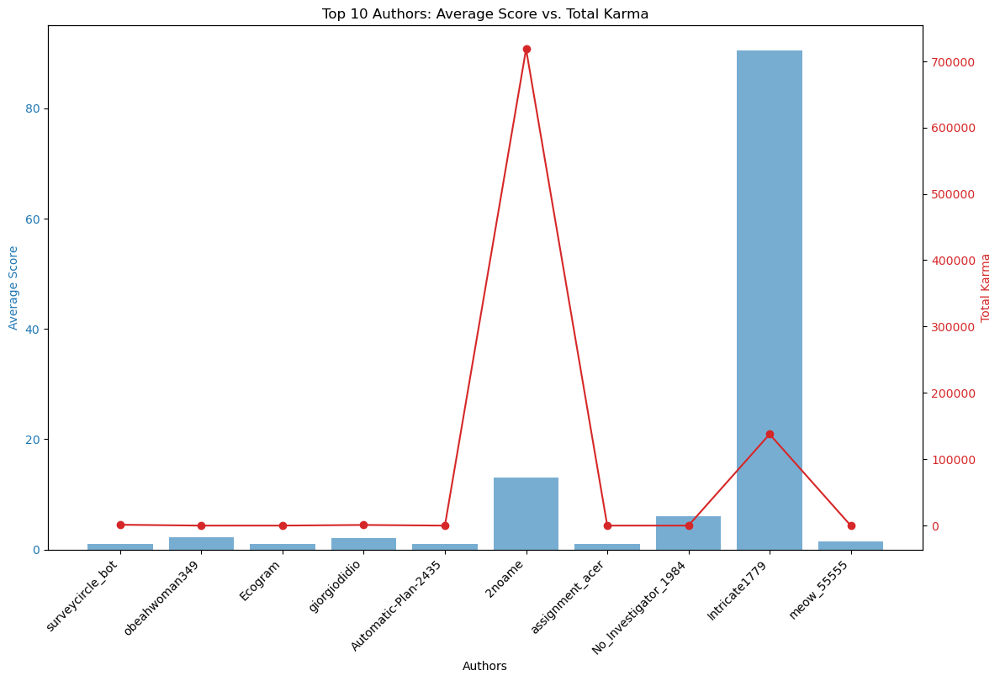

In [455]:
# Plotting
fig, ax1 = plt.subplots(figsize=(12, 8))

# Bar plot for average scores
color = 'tab:blue'
ax1.set_xlabel('Authors')
ax1.set_ylabel('Average Score', color=color)
ax1.bar(author_names, avg_scores, color=color, alpha=0.6, label='Average Score')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(author_names, rotation=45, ha='right')

# Line plot for total karma
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Karma', color=color)
ax2.plot(author_names, karma_values, color=color, marker='o', label='Total Karma')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Top 10 Authors: Average Score vs. Total Karma')
plt.show()

In [457]:
karma_values

[1327, 13, 27, 986, 4, 718234, 16, 22, 137780, 1]

Again the two highest scored have the highest karmas, though not in the same ordet.

## Karma Distribution

Of top 10 frequent authors whithin each subject, and all 2000 whithin each subject.

In [465]:
# Convert lists of tuples to DataFrames
columns = ['author_name', 'count', 'post_karma', 'comment_karma', 'cake_day']

df_envo = pd.DataFrame(author_envo, columns=columns)
df_social = pd.DataFrame(author_social, columns=columns)
df_eco = pd.DataFrame(author_eco, columns=columns)
df_human = pd.DataFrame(author_human, columns=columns)

In [469]:
# Display one of the DataFrames to ensure it looks correct
print(df_envo)

# Merge all DataFrames on 'author_name'
merged_df = pd.merge(df_envo, df_social, on='author_name', how='outer', suffixes=('_envo', '_social'))
merged_df = pd.merge(merged_df, df_eco, on='author_name', how='outer', suffixes=('', '_eco'))
merged_df = pd.merge(merged_df, df_human, on='author_name', how='outer', suffixes=('', '_human'))

           author_name  count  post_karma  comment_karma    cake_day
0             Eco-Uday     51           9              0  2021-09-19
1     iam_the_good_guy      5          82              9  2022-01-10
2  WinterBeginning1757      5           1              5  2021-12-30
3          powerlilies      5        1766             45  2020-10-27
4             LazyHose      4         525              0  2022-02-14
5         bobateaman14      4         874           1496  2022-06-22
6          ami_nil1987      4        5535            410  2018-04-01
7         mike_gifford      4       20430            404  2012-08-10
8          smartybrome      4       42417             79  2021-03-22
9             Wagamaga      3    11764234         371597  2014-06-04


In [473]:
# Fill NaN values with 0 for counts and karma
merged_df.fillna({'count_envo': 0, 'post_karma_envo': 0, 'comment_karma_envo': 0,
                  'count_social': 0, 'post_karma_social': 0, 'comment_karma_social': 0,
                  'count': 0, 'post_karma': 0, 'comment_karma': 0,
                  'count_human': 0, 'post_karma_human': 0, 'comment_karma_human': 0}, inplace=True)

# Display the merged DataFrame
print(merged_df)

             author_name  count_envo  post_karma_envo  comment_karma_envo  \
0               Eco-Uday        51.0              9.0                 0.0   
1       iam_the_good_guy         5.0             82.0                 9.0   
2    WinterBeginning1757         5.0              1.0                 5.0   
3            powerlilies         5.0           1766.0                45.0   
4               LazyHose         4.0            525.0                 0.0   
5           bobateaman14         4.0            874.0              1496.0   
6            ami_nil1987         4.0           5535.0               410.0   
7           mike_gifford         4.0          20430.0               404.0   
8            smartybrome         4.0          42417.0                79.0   
9               Wagamaga         3.0       11764234.0            371597.0   
10      surveycircle_bot         0.0              0.0                 0.0   
11         obeahwoman349         0.0              0.0                 0.0   

In [475]:
# Calculating total karma for each topic
merged_df['total_karma_envo'] = merged_df['post_karma_envo'] + merged_df['comment_karma_envo']
merged_df['total_karma_social'] = merged_df['post_karma_social'] + merged_df['comment_karma_social']
merged_df['total_karma_eco'] = merged_df['post_karma'] + merged_df['comment_karma']  # Eco karma
merged_df['total_karma_human'] = merged_df['post_karma_human'] + merged_df['comment_karma_human']

# Calculating overall total karma
merged_df['overall_total_karma'] = (merged_df['total_karma_envo'] + merged_df['total_karma_social'] +
                                    merged_df['total_karma_eco'] + merged_df['total_karma_human'])

In [477]:
# Display the DataFrame with the new columns
print(merged_df)

# Descriptive statistics for each karma type
stats = merged_df[['total_karma_envo', 'total_karma_social', 'total_karma_eco', 'total_karma_human']].describe()

             author_name  count_envo  post_karma_envo  comment_karma_envo  \
0               Eco-Uday        51.0              9.0                 0.0   
1       iam_the_good_guy         5.0             82.0                 9.0   
2    WinterBeginning1757         5.0              1.0                 5.0   
3            powerlilies         5.0           1766.0                45.0   
4               LazyHose         4.0            525.0                 0.0   
5           bobateaman14         4.0            874.0              1496.0   
6            ami_nil1987         4.0           5535.0               410.0   
7           mike_gifford         4.0          20430.0               404.0   
8            smartybrome         4.0          42417.0                79.0   
9               Wagamaga         3.0       11764234.0            371597.0   
10      surveycircle_bot         0.0              0.0                 0.0   
11         obeahwoman349         0.0              0.0                 0.0   

In [479]:
print(stats)

avg_karma = merged_df[['total_karma_envo', 'total_karma_social', 'total_karma_eco', 'total_karma_human']].mean()

       total_karma_envo  total_karma_social  total_karma_eco  \
count      3.600000e+01           36.000000     3.600000e+01   
mean       3.391644e+05        23844.722222     8.603937e+05   
std        2.022301e+06       121229.132983     4.974051e+06   
min        0.000000e+00            0.000000     0.000000e+00   
25%        0.000000e+00            0.000000     0.000000e+00   
50%        0.000000e+00            0.000000     0.000000e+00   
75%        6.750000e+00            1.750000     2.250000e+00   
max        1.213583e+07       718234.000000     2.986931e+07   

       total_karma_human  
count       3.600000e+01  
mean        1.257904e+06  
std         5.307624e+06  
min         0.000000e+00  
25%         0.000000e+00  
50%         0.000000e+00  
75%         3.190000e+02  
max         2.986929e+07  


Mean of karma is the highest for the economic sustainability, and lowest for social sustainability.

Standard deviation of human sustainability is the highest.

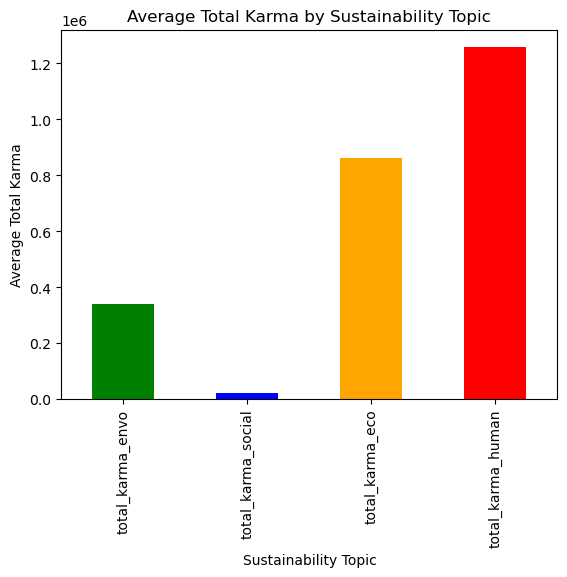

In [481]:
# Plotting the bar chart
avg_karma.plot(kind='bar', color=['green', 'blue', 'orange', 'red'])
plt.title('Average Total Karma by Sustainability Topic')
plt.xlabel('Sustainability Topic')
plt.ylabel('Average Total Karma')
plt.show()

In [516]:
posts_best = reddit.subreddit('all').search('environmental sustainability', sort=sort_by, limit=1000)

author_count = defaultdict(int)

# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# To store detailed author data including karma and cake day
author_data_envo = []

for author_name, count in sorted_authors:
    if author_name == "[deleted]":
        # Skip deleted users
        continue
    
    try:
        # Fetch the Redditor (author) object
        redditor = reddit.redditor(author_name)
        
        # Retrieve karma and cake day
        post_karma = redditor.link_karma
        comment_karma = redditor.comment_karma
        
        # Append the data as a tuple
        author_data_envo.append((author_name, count, post_karma, comment_karma))
        
    except Exception as e:
        print(f"An error occurred for author {author_name}: {e}")
        continue

# Display or further process the author data
for data in author_data_envo[:10]:
    print(data)

An error occurred for author millionreddit617: 'Redditor' object has no attribute 'link_karma'
An error occurred for author nuclearsciencelover: 'Redditor' object has no attribute 'link_karma'
An error occurred for author TheNIOandTeslaBull: 'Redditor' object has no attribute 'link_karma'
An error occurred for author mywifeknowsmyprimary: 'Redditor' object has no attribute 'link_karma'
('Eco-Uday', 51, 9, 0)
('iam_the_good_guy', 5, 82, 9)
('WinterBeginning1757', 5, 1, 5)
('powerlilies', 5, 1766, 45)
('LazyHose', 4, 525, 0)
('bobateaman14', 4, 874, 1496)
('ami_nil1987', 4, 5535, 410)
('mike_gifford', 4, 20430, 404)
('smartybrome', 4, 42417, 79)
('Wagamaga', 3, 11764364, 371617)


In [520]:
posts_best = reddit.subreddit('all').search('human sustainability', sort=sort_by, limit=1000)

author_count = defaultdict(int)

# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# To store detailed author data including karma and cake day
author_data_human = []

for author_name, count in sorted_authors:
    if author_name == "[deleted]":
        # Skip deleted users
        continue
    
    try:
        # Fetch the Redditor (author) object
        redditor = reddit.redditor(author_name)
        
        # Retrieve karma and cake day
        post_karma = redditor.link_karma
        comment_karma = redditor.comment_karma
        
        # Append the data as a tuple
        author_data_human.append((author_name, count, post_karma, comment_karma))
        
    except Exception as e:
        print(f"An error occurred for author {author_name}: {e}")
        continue

An error occurred for author JM-Rie: 'Redditor' object has no attribute 'link_karma'
An error occurred for author jayseph95: 'Redditor' object has no attribute 'link_karma'
An error occurred for author onyx1378: 'Redditor' object has no attribute 'link_karma'
An error occurred for author BroBogan: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Moon-town-bow: 'Redditor' object has no attribute 'link_karma'
An error occurred for author supersecretkgbfile: 'Redditor' object has no attribute 'link_karma'
An error occurred for author be_ep-b0-op: 'Redditor' object has no attribute 'link_karma'
An error occurred for author covkpitxwing: 'Redditor' object has no attribute 'link_karma'
An error occurred for author AgentSmith_GPT2: 'Redditor' object has no attribute 'link_karma'
An error occurred for author New-Reference9443: 'Redditor' object has no attribute 'link_karma'


In [522]:
posts_best = reddit.subreddit('all').search('social sustainability', sort=sort_by, limit=1000)

author_count = defaultdict(int)

# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# To store detailed author data including karma and cake day
author_data_social = []

for author_name, count in sorted_authors:
    if author_name == "[deleted]":
        # Skip deleted users
        continue
    
    try:
        # Fetch the Redditor (author) object
        redditor = reddit.redditor(author_name)
        
        # Retrieve karma and cake day
        post_karma = redditor.link_karma
        comment_karma = redditor.comment_karma
        
        # Append the data as a tuple
        author_data_social.append((author_name, count, post_karma, comment_karma))
        
    except Exception as e:
        print(f"An error occurred for author {author_name}: {e}")
        continue

An error occurred for author NilyGunner: 'Redditor' object has no attribute 'link_karma'
An error occurred for author cokeandethercreature: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Rodfar: 'Redditor' object has no attribute 'link_karma'
An error occurred for author DesignerAttitude98: 'Redditor' object has no attribute 'link_karma'
An error occurred for author alper: 'Redditor' object has no attribute 'link_karma'
An error occurred for author think-bot: 'Redditor' object has no attribute 'link_karma'
An error occurred for author gkm64: 'Redditor' object has no attribute 'link_karma'
An error occurred for author BigSpongEnergy: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Umbra65: 'Redditor' object has no attribute 'link_karma'
An error occurred for author StaticNocturne: 'Redditor' object has no attribute 'link_karma'


In [524]:
posts_best = reddit.subreddit('all').search('economic sustainability', sort=sort_by, limit=1000)

author_count = defaultdict(int)

# Count the number of posts by each author
for post in posts_best:
    author_name = post.author.name if post.author else "[deleted]"
    author_count[author_name] += 1

# Sort the authors by the number of posts in descending order
sorted_authors = sorted(author_count.items(), key=lambda x: x[1], reverse=True)

# To store detailed author data including karma and cake day
author_data_eco = []

for author_name, count in sorted_authors:
    if author_name == "[deleted]":
        # Skip deleted users
        continue
    
    try:
        # Fetch the Redditor (author) object
        redditor = reddit.redditor(author_name)
        
        # Retrieve karma and cake day
        post_karma = redditor.link_karma
        comment_karma = redditor.comment_karma
        
        # Append the data as a tuple
        author_data_eco.append((author_name, count, post_karma, comment_karma))
        
    except Exception as e:
        print(f"An error occurred for author {author_name}: {e}")
        continue

An error occurred for author SonOfABitchesBrew: 'Redditor' object has no attribute 'link_karma'
An error occurred for author dirtyharrison: received 404 HTTP response
An error occurred for author SunkenPretzel: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Sufficient_Animal_28: received 404 HTTP response
An error occurred for author Status-Possession534: 'Redditor' object has no attribute 'link_karma'
An error occurred for author rememberingthe70s: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Phenomenon98: 'Redditor' object has no attribute 'link_karma'
An error occurred for author Whiskey_Fiasco: 'Redditor' object has no attribute 'link_karma'
An error occurred for author WilliamOfOrange: 'Redditor' object has no attribute 'link_karma'


In [526]:
# Convert lists of tuples to DataFrames
columns = ['author_name', 'count', 'post_karma', 'comment_karma']

df_envo_T = pd.DataFrame(author_data_envo, columns=columns)
df_social_T = pd.DataFrame(author_data_social, columns=columns)
df_eco_T = pd.DataFrame(author_data_eco, columns=columns)
df_human_T = pd.DataFrame(author_data_human, columns=columns)

In [528]:
# Merge all DataFrames on 'author_name'
merged_df_T = pd.merge(df_envo_T, df_social_T, on='author_name', how='outer', suffixes=('_envo', '_social'))
merged_df_T = pd.merge(merged_df_T, df_eco_T, on='author_name', how='outer', suffixes=('', '_eco'))
merged_df_T = pd.merge(merged_df_T, df_human_T, on='author_name', how='outer', suffixes=('', '_human'))

In [530]:
# Step 1: Remove rows where all columns are NaN
merged_df_T_cleaned = merged_df_T.dropna(how='all')

# Step 2: Fill remaining NaN values with 0
merged_df_T_cleaned.fillna(0, inplace=True)

# Display the cleaned DataFrame
print(merged_df_T_cleaned)

             author_name  count_envo  post_karma_envo  comment_karma_envo  \
0               Eco-Uday        51.0              9.0                 0.0   
1       iam_the_good_guy         5.0             82.0                 9.0   
2    WinterBeginning1757         5.0              1.0                 5.0   
3            powerlilies         5.0           1766.0                45.0   
4               LazyHose         4.0            525.0                 0.0   
..                   ...         ...              ...                 ...   
595          Ewserneighm         0.0              0.0                 0.0   
596            qznc_bot2         0.0              0.0                 0.0   
597        PatientModBot         0.0              0.0                 0.0   
598             UnixxinU         0.0              0.0                 0.0   
599         theredditoro         0.0              0.0                 0.0   

     count_social  post_karma_social  comment_karma_social  count  post_kar

In [532]:
# Calculating total karma for each topic
merged_df_T_cleaned['total_karma_envo'] = merged_df_T_cleaned['post_karma_envo'] + merged_df_T_cleaned['comment_karma_envo']
merged_df_T_cleaned['total_karma_social'] = merged_df_T_cleaned['post_karma_social'] + merged_df_T_cleaned['comment_karma_social']
merged_df_T_cleaned['total_karma_eco'] = merged_df_T_cleaned['post_karma'] + merged_df_T_cleaned['comment_karma']  # Eco karma
merged_df_T_cleaned['total_karma_human'] = merged_df_T_cleaned['post_karma_human'] + merged_df_T_cleaned['comment_karma_human']

# Calculating overall total karma
merged_df_T_cleaned['overall_total_karma'] = (merged_df_T_cleaned['total_karma_envo'] + merged_df_T_cleaned['total_karma_social'] +
                                    merged_df_T_cleaned['total_karma_eco'] + merged_df_T_cleaned['total_karma_human'])

In [534]:
# Descriptive statistics for each karma type
stats_T = merged_df_T_cleaned[['total_karma_envo', 'total_karma_social', 'total_karma_eco', 'total_karma_human']].describe()

print(stats_T)

       total_karma_envo  total_karma_social  total_karma_eco  \
count      6.000000e+02        6.000000e+02     6.000000e+02   
mean       1.258336e+05        1.381677e+05     8.325032e+04   
std        1.449050e+06        1.407893e+06     1.237305e+06   
min        0.000000e+00       -1.000000e+00    -2.000000e+00   
25%        0.000000e+00        0.000000e+00     0.000000e+00   
50%        0.000000e+00        0.000000e+00     0.000000e+00   
75%        0.000000e+00        1.650000e+01     1.250000e+00   
max        2.987049e+07        2.987058e+07     2.987060e+07   

       total_karma_human  
count       6.000000e+02  
mean        1.370870e+05  
std         1.370730e+06  
min         0.000000e+00  
25%         0.000000e+00  
50%         0.000000e+00  
75%         2.062500e+02  
max         2.987054e+07  


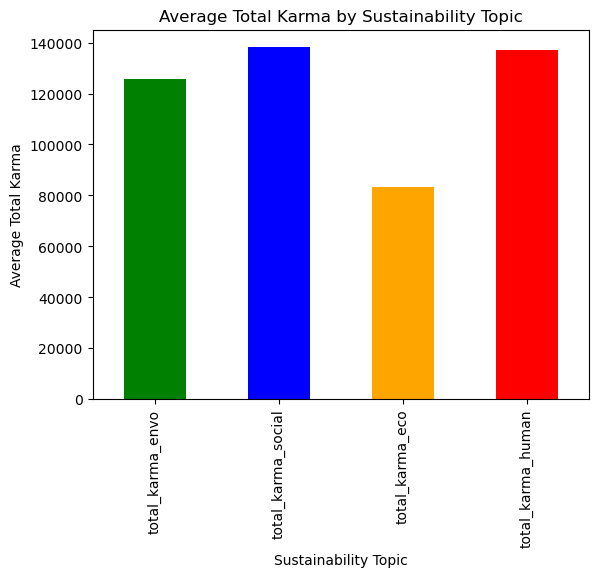

In [536]:
avg_karma_T = merged_df_T_cleaned[['total_karma_envo', 'total_karma_social', 'total_karma_eco', 'total_karma_human']].mean()

# Plotting the bar chart
avg_karma_T.plot(kind='bar', color=['green', 'blue', 'orange', 'red'])
plt.title('Average Total Karma by Sustainability Topic')
plt.xlabel('Sustainability Topic')
plt.ylabel('Average Total Karma')
plt.show()

By comparing this graph from the previous which was only for the top 10 frequent writers,I can deduce that People who have high karma and write about social sustainability, do not write about it often, or their writings in this subject are not considered best often.

Moreover, human sustainability karma stays the highest, meaning more or less all the best posts in this topic are written bhy high karmad authors.

also economic sustainability and environmental sustainability switch places with respect to the previous graph, leaving economic sustainability the subject having on average the least karma of authors in total.

## Sentiment Distribution

### Top frequent subreddits

whithin each query

In [1360]:
# Function to convert each sentiment dictionary into a DataFrame
def sentiment_dict_to_df(sentiment_dict, query_name):
    data = []
    for subreddit, sentiments in sentiment_dict.items():
        for author, sentiment in sentiments:
            data.append([query_name, subreddit, author, sentiment])
    
    return pd.DataFrame(data, columns=['query', 'subreddit', 'author_name', 'sentiment'])

In [1362]:
# Convert each sentiment dictionary into a DataFrame
df_envo = sentiment_dict_to_df(sentiment_envo, 'environmental')
df_human = sentiment_dict_to_df(sentiment_human, 'human')
df_eco = sentiment_dict_to_df(sentiment_eco, 'economic')
df_social = sentiment_dict_to_df(sentiment_social, 'social')

In [1364]:
# Combine all DataFrames into one
combined_df = pd.concat([df_envo, df_human, df_eco, df_social], ignore_index=True)

# Display the first few rows of the combined DataFrame
print(combined_df.head())

           query subreddit      author_name  sentiment
0  environmental   science           tzaeru   0.191667
1  environmental   science  giuliomagnifico   0.000000
2  environmental   science             mvea  -0.156250
3  environmental   science          mvdm_42   0.000000
4  environmental   science       Vegoonmoon   0.000000


In [1379]:
combined_df.describe()

,sentiment
count,304.000000
mean,0.147580
std,0.186553
min,-0.333333
25%,0.000000
50%,0.100000
75%,0.207143
max,0.700000


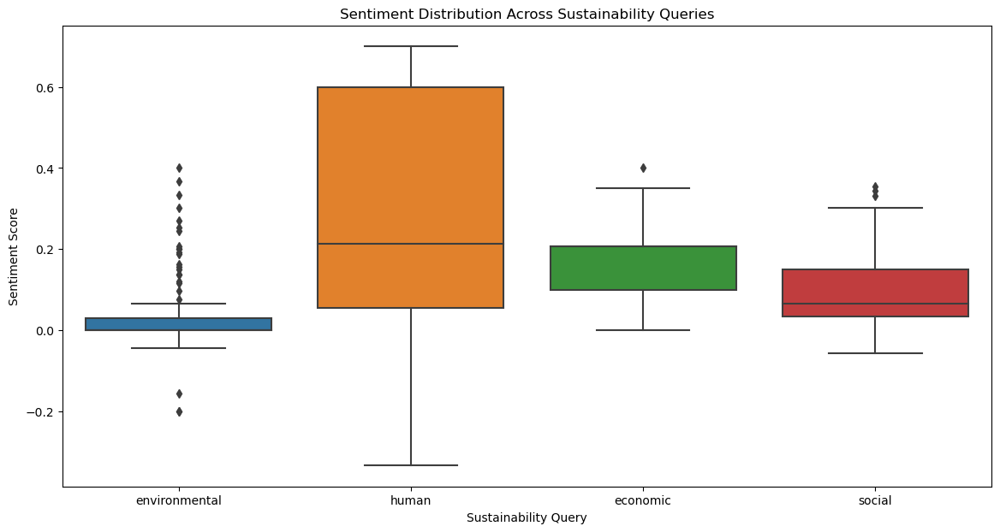

In [1366]:
# Box plot to compare sentiment distributions across queries
plt.figure(figsize=(14, 7))
sns.boxplot(x='query', y='sentiment', data=combined_df)
plt.title('Sentiment Distribution Across Sustainability Queries')
plt.xlabel('Sustainability Query')
plt.ylabel('Sentiment Score')
plt.show()

Environmental sustainability sentiment is basically made of outliers! There is not much distinctdistribution for it, and it ranges from -.2 to .4. 
Human sustainability with a median above all, and skewd to the positive side, can be considered mostly positive, though its range is wider than all from both sides. 
After that, economic sustainability is considered the next positive.
Overall environmental and social sustainability are the least positive with the most outliers in the positive side, respectively.

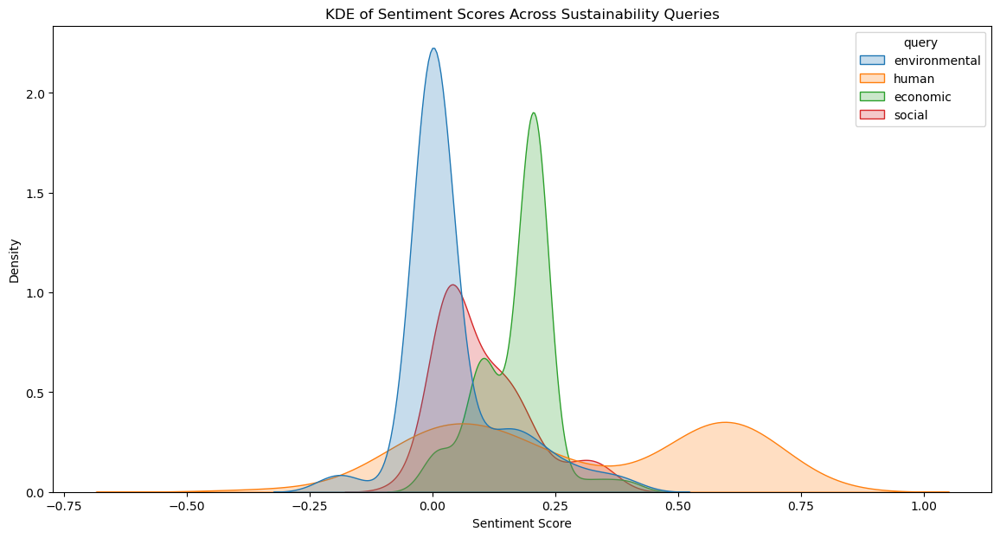

In [1368]:
# KDE plot to visualize the distribution of sentiment scores
plt.figure(figsize=(14, 7))
sns.kdeplot(data=combined_df, x='sentiment', hue='query', fill=True)
plt.title('KDE of Sentiment Scores Across Sustainability Queries')
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.show()

*Because the smoothing algorithm uses a Gaussian kernel, the estimated density curve can extend to values that do not make sense for a particular dataset*

The closest to normal is social sustainability, though more skewed to positivity, and the furthest is human sustainability, with having to spikes at neutrality and 0,6 which is closer to 1 than 0.

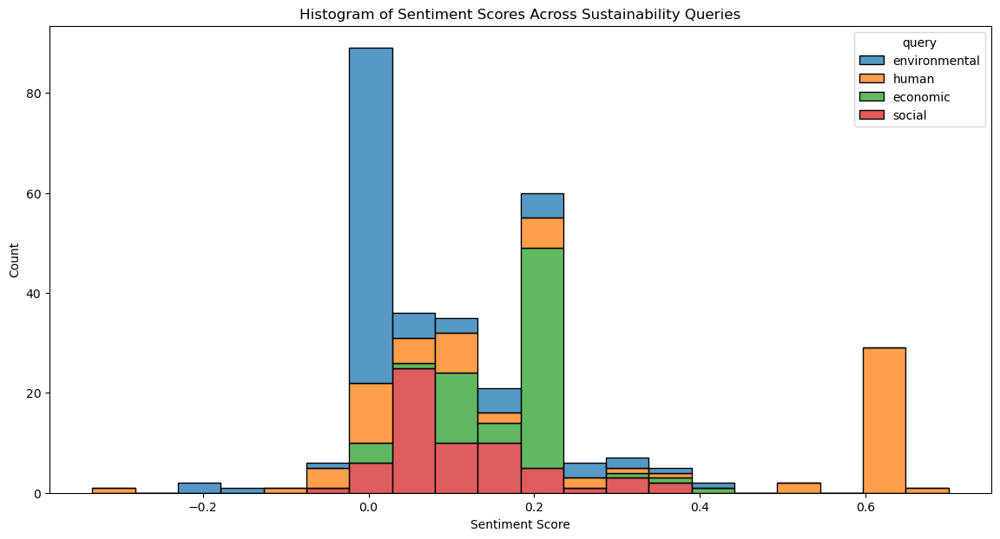

In [1370]:
#Histogram for each query type
plt.figure(figsize=(14, 7))
sns.histplot(data=combined_df, x='sentiment', hue='query', multiple='stack', bins=20)
plt.title('Histogram of Sentiment Scores Across Sustainability Queries')
plt.xlabel('Sentiment Score')
plt.ylabel('Count')
plt.show()

### All subreddits

whithin each query

In [1395]:
sentiment_data = {}

posts_best_envo = reddit.subreddit('all').search('environmental sustainability', sort='best', limit=1000)

In [1397]:
subreddit_sentiment_envo = defaultdict(list)

sentiment_dict_envo = defaultdict(list)

In [1399]:
# Analyze sentiment for each post
for post in posts_best_envo:
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"

    text = (post.title or "") + ' ' + (post.selftext or "")
    if text.strip():  # Ensure there's some text to analyze
        sentiment = TextBlob(text).sentiment.polarity
        subreddit_sentiment_envo[subreddit_name].append(sentiment)
        sentiment_dict_envo[subreddit_name].append((author_name, sentiment))

# Store sentiment data for this query
sentiment_data['environmental sustainability'] = sentiment_dict_envo

In [1403]:
posts_best_social = reddit.subreddit('all').search('social sustainability', sort='best', limit=1000)

subreddit_sentiment_social = defaultdict(list)

sentiment_dict_social = defaultdict(list)

In [1405]:
# Analyze sentiment for each post
for post in posts_best_social:
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"

    text = (post.title or "") + ' ' + (post.selftext or "")
    if text.strip():  # Ensure there's some text to analyze
        sentiment = TextBlob(text).sentiment.polarity
        subreddit_sentiment_social[subreddit_name].append(sentiment)
        sentiment_dict_social[subreddit_name].append((author_name, sentiment))

# Store sentiment data for this query
sentiment_data['social sustainability'] = sentiment_dict_social

In [1411]:
posts_best_eco = reddit.subreddit('all').search('economic sustainability', sort='best', limit=1000)

subreddit_sentiment_eco = defaultdict(list)

sentiment_dict_eco = defaultdict(list)

In [1413]:
# Analyze sentiment for each post
for post in posts_best_eco:
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"

    text = (post.title or "") + ' ' + (post.selftext or "")
    if text.strip():  # Ensure there's some text to analyze
        sentiment = TextBlob(text).sentiment.polarity
        subreddit_sentiment_eco[subreddit_name].append(sentiment)
        sentiment_dict_eco[subreddit_name].append((author_name, sentiment))

# Store sentiment data for this query
sentiment_data['economic sustainability'] = sentiment_dict_eco

In [1417]:
posts_best_human = reddit.subreddit('all').search('human sustainability', sort='best', limit=1000)

subreddit_sentiment_human = defaultdict(list)

sentiment_dict_human = defaultdict(list)

In [1419]:
# Analyze sentiment for each post
for post in posts_best_human:
    subreddit_name = post.subreddit.display_name
    author_name = post.author.name if post.author else "[deleted]"

    text = (post.title or "") + ' ' + (post.selftext or "")
    if text.strip():  # Ensure there's some text to analyze
        sentiment = TextBlob(text).sentiment.polarity
        subreddit_sentiment_human[subreddit_name].append(sentiment)
        sentiment_dict_human[subreddit_name].append((author_name, sentiment))

# Store sentiment data for this query
sentiment_data['human sustainability'] = sentiment_dict_human

In [1391]:
def sentiment_dict_to_df(sentiment_dict, query_name):
    data = []
    for subreddit, sentiments in sentiment_dict.items():
        for author, sentiment in sentiments:
            data.append([query_name, subreddit, author, sentiment])
    
    return pd.DataFrame(data, columns=['query', 'subreddit', 'author_name', 'sentiment'])

In [1423]:
query_names = ['environmental sustainability', 'human sustainability', 'economic sustainability', 'social sustainability']

# Combine all sentiment data into one DataFrame
df_combined_sentiment = pd.concat([sentiment_dict_to_df(sentiment_data[q], q) for q in query_names], ignore_index=True)

# Display the first few rows of the DataFrame
print(df_combined_sentiment.head())

                          query  subreddit          author_name  sentiment
0  environmental sustainability  worldnews                ead09   0.000000
1  environmental sustainability  worldnews  BattlemechJohnBrown   0.008333
2  environmental sustainability    science               tzaeru   0.191667
3  environmental sustainability    science      giuliomagnifico   0.000000
4  environmental sustainability    science                 mvea  -0.156250


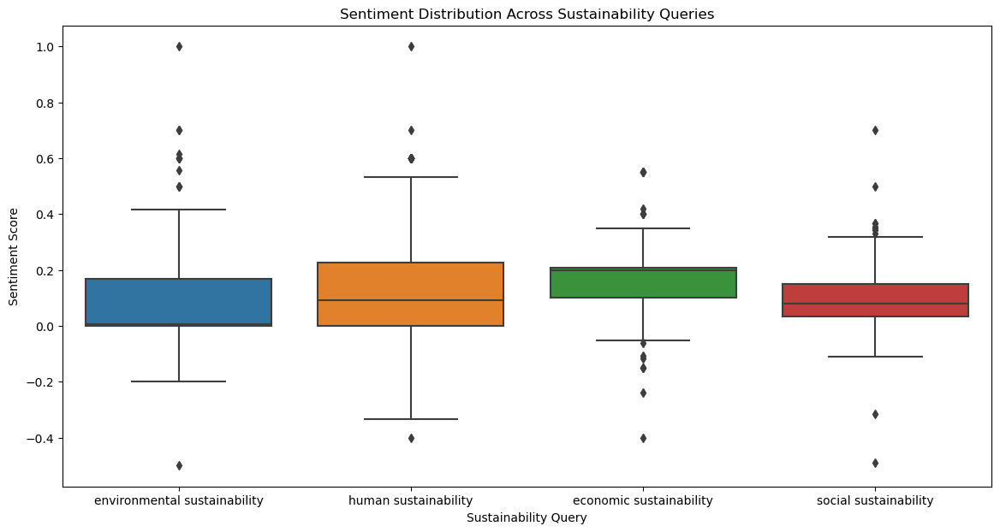

In [1425]:
# Box plot to compare sentiment distributions across queries
plt.figure(figsize=(14, 7))
sns.boxplot(x='query', y='sentiment', data=df_combined_sentiment)
plt.title('Sentiment Distribution Across Sustainability Queries')
plt.xlabel('Sustainability Query')
plt.ylabel('Sentiment Score')
plt.show()

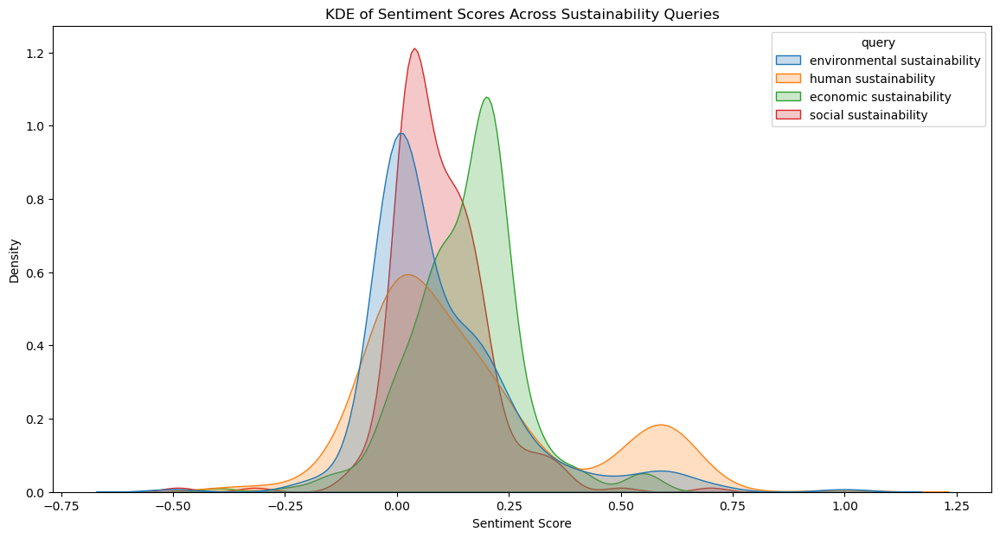

In [1427]:
# KDE plot to visualize the distribution of sentiment scores
plt.figure(figsize=(14, 7))
sns.kdeplot(data=df_combined_sentiment, x='sentiment', hue='query', fill=True)
plt.title('KDE of Sentiment Scores Across Sustainability Queries')
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.show()

# Top sustainability posts

What does top mean in Reddit?
the one with most amount of upvotes

Top is the one with most amount of upvotes. It's like the raw score. Best is most amount of upvotes with fewest downvotes. It is more about the proportion of upvotes to downvotes.

# News

NewsAPI (Free Tier):
    
NewsAPI is a popular service that aggregates news from thousands of sources.

Free Tier: The free tier allows you to make 500 requests per day, which should be enough for basic research.

API key is: 7b191cfcb7534c3a80a523f772062d05

In [38]:
import requests

api_key = '7b191cfcb7534c3a80a523f772062d05'
url = f'https://newsapi.org/v2/everything?q=sustainability&from=2020-01-01&to=2020-12-31&sortBy=relevancy&apiKey={api_key}'

response = requests.get(url)
data = response.json()

In [40]:
print(data)

{'status': 'error', 'code': 'parameterInvalid', 'message': 'You are trying to request results too far in the past. Your plan permits you to request articles as far back as 2024-07-21, but you have requested 2020-01-01. You may need to upgrade to a paid plan.'}


Let's see if there is any other way to get older news:

In [42]:
pip install feedparser

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 5.4 MB/s eta 0:00:00
  Created wheel for sgmllib3k: filename=sgmllib3k-1.0.0-py3-none-any.whl size=6049 sha256=c6e4bb3f9c931e496fe76d2e71885e1fe6b2f53ea3b66db385b7a4be68e35003
  Stored in directory: /Users/gisooshams/Library/Caches/pip/wheels/3b/25/2a/105d6a15df6914f4d15047691c6c28f9052cc1173e40285d03
Successfully built sgmllib3k

[notice] A new release of pip is available: 24.1.1 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [44]:
pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 29.5 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 24.1.1
    Uninstalling pip-24.1.1:
      Successfully uninstalled pip-24.1.1
Note: you may need to restart the kernel to use updated packages.


In [46]:
import feedparser

In [48]:
# RSS feed URL for The Guardian Environment
rss_url = 'https://www.theguardian.com/environment/rss'

In [50]:
# Parse the RSS feed
feed = feedparser.parse(rss_url)

In [66]:
keyword = 'ESG'
# Define the target year for filtering
target_year = 2023

In [68]:
# Iterate over the entries and filter by publication year
for entry in feed.entries:
    # Extract publication date and parse it
    pub_date = entry.published
    try:
        # Attempt to parse the publication date
        pub_date_obj = datetime.strptime(pub_date, '%a, %d %b %Y %H:%M:%S %z')
    except ValueError:
        # Handle cases where the date format is different
        try:
            pub_date_obj = datetime.strptime(pub_date, '%a, %d %b %Y %H:%M:%S %Z')
        except ValueError:
            # Skip entries with an unparseable date
            continue
            # Check if the entry's publication year matches the target year
    if pub_date_obj.year == target_year and keyword.lower() in entry.title.lower() or keyword.lower() in entry.summary.lower():
        title = entry.title
        link = entry.link
        summary = entry.summary
        published = entry.published

        # Print or process the filtered article
        print(f"Title: {title}")
        print(f"Link: {link}")
        print(f"Summary: {summary}")
        print(f"Published: {published}")
        print('-' * 80)

In [86]:
pip install webdriver_manager

Note: you may need to restart the kernel to use updated packages.


In [88]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager

In [90]:
# Setup Selenium WebDriver
chrome_options = Options()
chrome_options.add_argument("--headless")  # Run in headless mode
driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)

In [92]:
def fetch_news(keywords, year):
    query = '+'.join(keywords.split())
    url = f'https://news.google.com/search?q={query}&tbs=cdr:1,cd_min:{year}-01-01,cd_max:{year}-12-31'
    driver.get(url)

    # Give time for JavaScript to load content
    driver.implicitly_wait(10)

    articles = driver.find_elements(By.TAG_NAME, 'article')
    for article in articles:
        title_element = article.find_element(By.TAG_NAME, 'h3')
        title = title_element.text if title_element else 'No title'
        link_element = article.find_element(By.TAG_NAME, 'a')
        link = link_element.get_attribute('href') if link_element else 'No link'

        print(f"Title: {title}")
        print(f"Link: {link}")
        print('-' * 80)

In [94]:
# Example usage
fetch_news('sustainability', 2023)

driver.quit()

In [96]:
import requests
from bs4 import BeautifulSoup
from datetime import datetime

In [98]:
def fetch_news(keywords, year):
    query = '+'.join(keywords.split())
    url = f'https://news.google.com/search?q={query}&tbs=cdr:1,cd_min:{year}-01-01,cd_max:{year}-12-31'
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    }
    response = requests.get(url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')

    # Check the updated HTML structure
    articles = soup.find_all('article')
    if not articles:
        print("No articles found or structure may have changed.")
    
    for article in articles:
        title = article.find('h3').text if article.find('h3') else 'No title'
        link = article.find('a')['href'] if article.find('a') else 'No link'
        link = f'https://news.google.com{link}' if link.startswith('/') else link

        print(f"Title: {title}")
        print(f"Link: {link}")
        print('-' * 80)

In [100]:
# Example usage
fetch_news('sustainability', 2023)

No articles found or structure may have changed.


In [76]:
# Function to scrape Google News
def fetch_news(keywords, year):
    # Construct the search query
    query = '+'.join(keywords.split())
    url = f'https://news.google.com/search?q={query}&tbs=cdr:1,cd_min:{year}-01-01,cd_max:{year}-12-31'

    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    }

    response = requests.get(url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')

    # Extract article details
    articles = soup.find_all('article')
    for article in articles:
        title = article.find('h3').text if article.find('h3') else 'No title'
        link = article.find('a')['href'] if article.find('a') else 'No link'
        link = f'https://news.google.com{link}' if link.startswith('/') else link

        print(f"Title: {title}")
        print(f"Link: {link}")
        print('-' * 80)

In [78]:
# Example usage
fetch_news('sustainability', 2023)

In [80]:
def fetch_news(keywords, year):
    url = f'https://newsapi.org/v2/everything?q={keywords}&from={year}-01-01&to={year}-12-31&sortBy=relevancy&apiKey={api_key}'

    response = requests.get(url)
    data = response.json()

    if 'articles' in data:
        for article in data['articles']:
            title = article.get('title', 'No title')
            link = article.get('url', 'No link')
            print(f"Title: {title}")
            print(f"Link: {link}")
            print('-' * 80)
    else:
        print("No articles found or there was an issue with the request.")

In [82]:
# Example usage
fetch_news('sustainability', 2023)

No articles found or there was an issue with the request.


In [102]:
pip install feedparser python-dateutil

Note: you may need to restart the kernel to use updated packages.


In [116]:
import feedparser
from dateutil import parser
from dateutil import parser
from datetime import datetime
import pytz
from datetime import datetime

In [118]:
# Define the RSS feed URL (example: BBC World News)
rss_url = 'http://feeds.bbci.co.uk/news/world/rss.xml'

In [120]:
def fetch_and_filter_articles(keywords, year):
    # Parse the RSS feed
    feed = feedparser.parse(rss_url)

    # Define the start and end date for filtering
    # Use UTC timezone for consistency with RSS feed timestamps
    tz = pytz.UTC
    start_date = datetime(year, 1, 1, tzinfo=tz)
    end_date = datetime(year + 1, 1, 1, tzinfo=tz)

    # Iterate over the entries and filter by keywords and publication date
    for entry in feed.entries:
        # Parse the publication date
        pub_date_str = entry.published
        try:
            pub_date = parser.parse(pub_date_str).astimezone(tz)  # Convert to UTC timezone
        except ValueError:
            continue

        # Check if the publication date is within the target year
        if start_date <= pub_date < end_date:
            # Check if any keyword is in the title or summary
            if any(keyword.lower() in (entry.title + ' ' + (entry.summary or '')).lower() for keyword in keywords):
                title = entry.title
                link = entry.link
                summary = entry.summary
                published = pub_date_str

                print(f"Title: {title}")
                print(f"Link: {link}")
                print(f"Summary: {summary}")
                print(f"Published: {published}")
                print('-' * 80)

In [122]:
# Example usage
fetch_and_filter_articles(['sustainability', 'climate'], 2023)

So far the NewsAPI is the best which gives access to the past month, not just today. It lets you to locate articles and breaking news headlines from news sources and blogs across the web with a JSON API. But eah time it oly shows 100 news, which can't go back to more than 2 days ago naturally.

In [6]:
api_key = '7b191cfcb7534c3a80a523f772062d05'
url = "https://newsapi.org/v2/everything"

In [24]:
# Calculate the date one month ago
one_month_ago = (datetime.now() - timedelta(days=30)).strftime('%Y-%m-%d')

# Define the parameters
params = {
    'q': 'human sustainability',
    'from': one_month_ago,
    'sortBy': 'publishedAt',
    'apiKey': api_key
}

In [26]:
# Send the request to the News API
response = requests.get(url, params=params)
data = response.json()

In [27]:
# Process the articles
for article in data['articles']:
    print(f"Title: {article['title']}")
    print(f"Description: {article['description']}")
    print(f"URL: {article['url']}")
    print(f"Published At: {article['publishedAt']}")
    print(f"Source: {article['source']['name']}")
    print("\n")

Title: Hampton by Hilton Unveils First‑Ever Waffle Bosses for National Waffle Day
Description: Hampton by Hilton is celebrating National Waffle Day (August 24) by unveiling its first-ever group of Hampton Waffle Bosses. This trio of exceptional breakfast hosts from around the globe have been recognized for their outstanding skills in creating innovativ…
URL: https://www.hospitalitynet.org/news/4123412.html
Published At: 2024-08-23T10:01:00Z
Source: Hospitality Net


Title: KG Media successfully hosts Lestari Summit and Awards 2024
Description: JAKARTA: Indonesia’s Media Group of Kompas Gramedia (KG Media) has successfully hosted its Lestari Summit 2024, which further reaffirms its commitment to upholding and promoting sustainability values. Read full story
URL: https://www.thestar.com.my/news/nation/2024/08/23/kg-media-successfully-hosts-lestari-summit-and-awards-2024
Published At: 2024-08-23T09:17:00Z
Source: The Star Online


Title: 20th International Conference on Persuasive Technol

# Trends

## Environmental Sustainability

In [9]:
# Define your query and parameters
query = "environmental sustainability"
sort_by = "top"  # Can be 'relevance', 'hot', 'top', 'new', etc.
limit = 500  # Limit the number of posts to fetch

In [10]:
# Perform the search on all subreddits
posts_best = reddit.subreddit('all').search(query, sort=sort_by, limit=limit)

# Collect the posts, including author information
all_posts = []

In [11]:
for submission in posts_best:
    post_date = datetime.fromtimestamp(submission.created_utc)
    all_posts.append({
        'title': submission.title,
        'score': submission.score,
        'id': submission.id,
        'url': submission.url,
        'comms_num': submission.num_comments,
        'created': post_date,
        'subreddit': submission.subreddit.display_name,
        'body': submission.selftext,
        'author': str(submission.author)  # Add author information
    })

In [12]:
# Convert to DataFrame
df_all = pd.DataFrame(all_posts)

# Check if DataFrame is empty
if df_all.empty:
    print("No posts found for the query.")
else:
    print(f"Total posts found: {len(df_all)}")

Total posts found: 233


### 2019

In [14]:
# Analyze the data
df_all['month'] = df_all['created'].dt.to_period('M')

#Filter for 2019
df_2019 = df_all[(df_all['created'].dt.year == 2019)]
top_posts_per_month = df_2019.groupby('month').size()

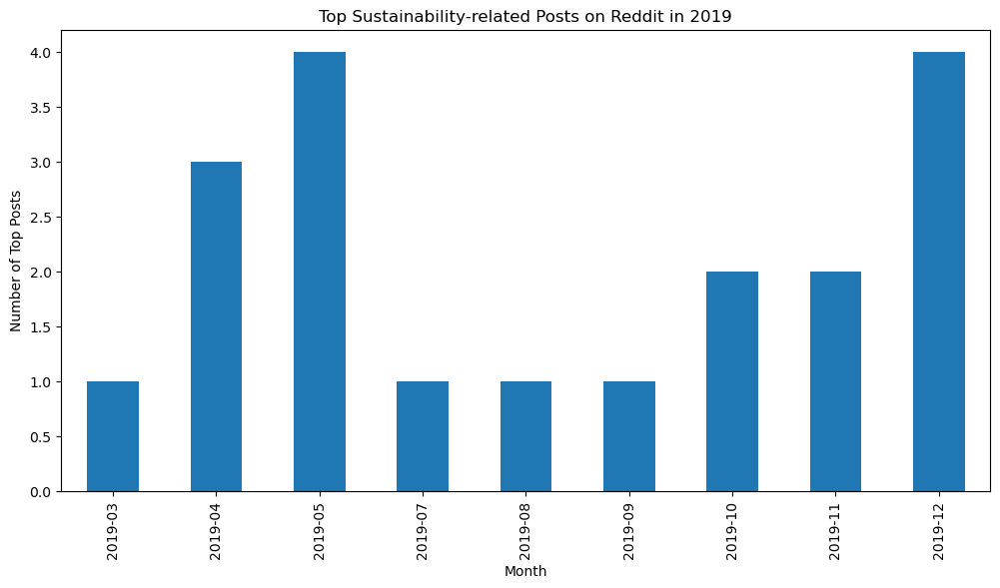

In [15]:
# Plotting the number of top posts over time
top_posts_per_month.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related Posts on Reddit in 2019")
plt.xlabel("Month")
plt.ylabel("Number of Top Posts")
plt.show()

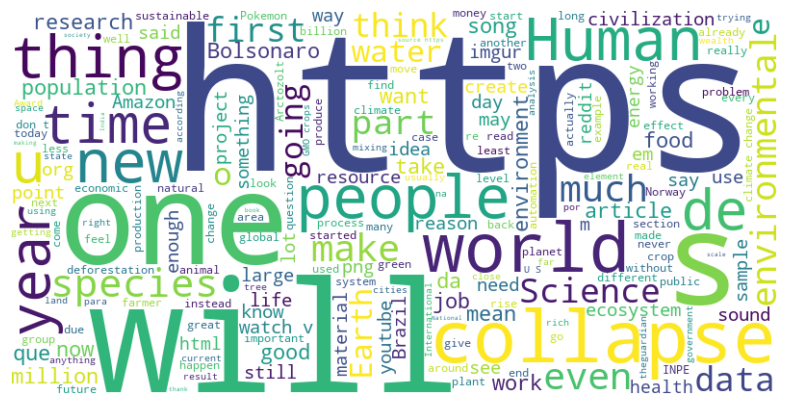

In [405]:
# Create the word cloud
# Concatenate the 'body' and 'text' columns into a single string
combined_text = ' '.join(df_2019['body'] + ' ' + df_2019['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)
# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Turn off axis
plt.show()

In [16]:
# Group by author and count the number of posts per author
author_distribution = df_2019['author'].value_counts()

# Print the top authors
print("Top Authors in 2019:")
print(author_distribution.head(10))

Top Authors in 2019:
author
ScienceModerator      3
MistWeaver80          1
giftedearth           1
PEERAttorneys         1
DoNotSexToThis        1
modsbr                1
mvea                  1
practicesimperfect    1
Ucumu                 1
Logiman43             1
Name: count, dtype: int64


In [17]:
author_name = 'ScienceModerator'

# Filter the DataFrame for posts by 'ScienceModerator'
author_posts = df_2019[df_2019['author'] == author_name]

In [18]:
author_posts.columns

Index(['title', 'score', 'id', 'url', 'comms_num', 'created', 'subreddit',
       'body', 'author', 'month'],
      dtype='object')

In [19]:
# If there are no posts by this author
if author_posts.empty:
    print(f"No posts found by {author_name}.")
else:
    # Calculate total posts, average score, total comments, etc.
    total_posts = author_posts.shape[0]
    total_score = author_posts['score'].sum()
    avg_score = author_posts['score'].mean()
    total_comments = author_posts['comms_num'].sum()
    avg_comments = author_posts['comms_num'].mean()

    # Print the information
    print(f"Information for author '{author_name}':")
    print("="*40)
    print(f"Total Posts: {total_posts}")
    print(f"Total Score: {total_score}")
    print(f"Average Score per Post: {avg_score:.2f}")
    print(f"Total Number of Comments: {total_comments}")
    print(f"Average Comments per Post: {avg_comments:.2f}")
    print("="*40)

Information for author 'ScienceModerator':
Total Posts: 3
Total Score: 26909
Average Score per Post: 8969.67
Total Number of Comments: 2496
Average Comments per Post: 832.00


In [20]:
# Fetch the user profile information
try:
    user = reddit.redditor("ScienceModerator")
    karma = user.link_karma + user.comment_karma

    print(f"User: {user.name}")
    print(f"Total Karma: {karma}")
    print(f"Link Karma: {user.link_karma}")
    print(f"Comment Karma: {user.comment_karma}")
    print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

except Exception as e:
    print(f"An error occurred: {e}")

User: ScienceModerator
Total Karma: 114919
Link Karma: 114236
Comment Karma: 683
Account Created: 2013-07-10 05:18:23


In [21]:
sub_distribution = df_2019['subreddit'].value_counts()

print(sub_distribution.head(10))

subreddit
science             4
worldnews           1
AmItheAsshole       1
australia           1
unpopularopinion    1
pokemon             1
childfree           1
DarkFuturology      1
HFY                 1
collapse            1
Name: count, dtype: int64


Sentiment

In [23]:
# Initialize Sentiment Analyzer
sid = SentimentIntensityAnalyzer()

# Define the start and end timestamps for 2019
start_timestamp = int(datetime(2019, 1, 1).timestamp())
end_timestamp = int(datetime(2019, 12, 31, 23, 59, 59).timestamp())

In [24]:
# Function to convert UTC timestamp to datetime
def utc_to_datetime(utc_timestamp):
    return datetime.fromtimestamp(utc_timestamp)

In [25]:
# Collect posts and their comments
posts_data = []

# Perform the search
print("Fetching posts...")

Fetching posts...


In [26]:
for submission in reddit.subreddit('all').search(query, sort=sort_by, limit=limit):
    post_date = utc_to_datetime(submission.created_utc)
    
    # Filter posts from 2019
    if start_timestamp <= submission.created_utc <= end_timestamp:
        # Analyze sentiment of the post
        post_text = submission.title + " " + submission.selftext
        post_sentiment = sid.polarity_scores(post_text)['compound']
        
        # Initialize list to store comment sentiments
        comment_sentiments = []
        
        # Fetch comments
        submission.comments.replace_more(limit=0)  # Replace "MoreComments" objects
        for comment in submission.comments.list():
            # Analyze sentiment of the comment
            comment_text = comment.body
            comment_sentiment = sid.polarity_scores(comment_text)['compound']
            comment_sentiments.append(comment_sentiment)
        
        # Calculate average comment sentiment
        avg_comment_sentiment = sum(comment_sentiments) / len(comment_sentiments) if comment_sentiments else 0
        
        # Append post data
        posts_data.append({
            'title': submission.title,
            'score': submission.score,
            'id': submission.id,
            'url': submission.url,
            'num_comments': submission.num_comments,
            'created': post_date,
            'subreddit': submission.subreddit.display_name,
            'author': str(submission.author),
            'selftext': submission.selftext,
            'post_sentiment': post_sentiment,
            'avg_comment_sentiment': avg_comment_sentiment
        })
        
        print(f"Processed post: {submission.title}")

print("Fetching complete.")

Processed post: India can sustainably enhance its food supply if its farmers plant less rice & more nutritious and environmentally-friendly crops, including finger millet, pearl millet, & sorghum, according to a study. Diversifying India's crops could provide better nutrition for 200 million undernourished people .
Processed post: Science Discussion Series: Batteries seem to power everything today- cell phones, cars, homes, even airplanes! We are a team of scientists and engineers working on batteries and energy storage, let's discuss!
Processed post: The true cost of cheap, unhealthy food is a spiralling public health crisis and environmental destruction, according to a high-level commission. It said the UK’s food and farming system must be radically transformed and become sustainable within 10 years.
Processed post: Science Discussion Series: What should and shouldn't be done with your personal genetic data? Who should benefit? We are researchers and advocates who are working on new 

In [27]:
# Convert collected data to a DataFrame
df_posts = pd.DataFrame(posts_data)

# Display basic information about the DataFrame
print(f"Total posts collected: {len(df_posts)}")
df_posts.head()

Total posts collected: 19


,title,score,id,url,num_comments,created,subreddit,author,selftext,post_sentiment,avg_comment_sentiment
0,India can sustainably enhance its food supply ...,29915,e7hp20,https://www.pnas.org/content/early/2019/11/20/...,943,2019-12-07 19:17:29,science,MistWeaver80,,0.4404,0.211536
1,Science Discussion Series: Batteries seem to p...,14435,bj3fpd,https://www.reddit.com/r/science/comments/bj3f...,1259,2019-04-30 15:40:15,science,ScienceModerator,[Hello Reddit!](https://i.imgur.com/sqOjWz6.pn...,0.9962,0.351152
2,"The true cost of cheap, unhealthy food is a sp...",8120,cdus2t,https://www.theguardian.com/environment/2019/j...,539,2019-07-16 11:31:31,worldnews,ManiaforBeatles,,-0.8555,0.062425
3,Science Discussion Series: What should and sho...,6899,dcqmq9,https://www.reddit.com/r/science/comments/dcqm...,413,2019-10-03 15:06:05,science,ScienceModerator,[Hi reddit](https://i.imgur.com/DGWqasT.png)! ...,0.9990,0.365643
4,Science discussion series: We are an interdisc...,5578,b91hql,https://www.reddit.com/r/science/comments/b91h...,824,2019-04-03 20:11:58,science,ScienceModerator,[Hi Reddit](https://i.imgur.com/sqOjWz6.png)! ...,0.9915,0.242570


In [28]:
# Descriptive statistics for post sentiments
print("Post Sentiment Statistics:")
print(df_posts['post_sentiment'].describe())

Post Sentiment Statistics:
count    19.000000
mean      0.449184
std       0.806246
min      -0.999800
25%       0.095200
50%       0.988600
75%       0.992750
max       0.999900
Name: post_sentiment, dtype: float64


Pretty big STD and positive median

In [30]:
# Descriptive statistics for comment sentiments
print("\nAverage Comment Sentiment Statistics:")
print(df_posts['avg_comment_sentiment'].describe())


Average Comment Sentiment Statistics:
count    19.000000
mean      0.147763
std       0.154035
min      -0.059804
25%       0.050554
50%       0.131435
75%       0.217301
max       0.556527
Name: avg_comment_sentiment, dtype: float64


Comments more neutral than posittive, even the max does not go above 0.6

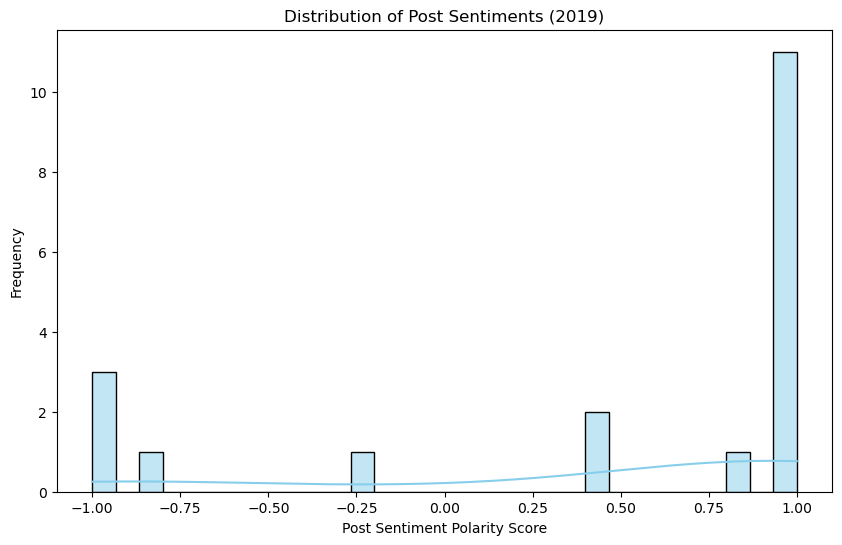

In [32]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['post_sentiment'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Post Sentiments (2019)')
plt.xlabel('Post Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

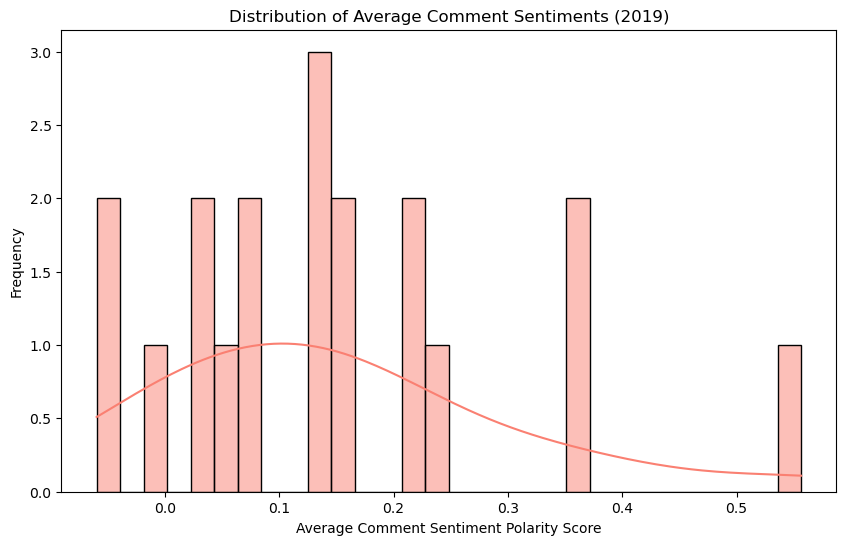

In [33]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['avg_comment_sentiment'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Average Comment Sentiments (2019)')
plt.xlabel('Average Comment Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

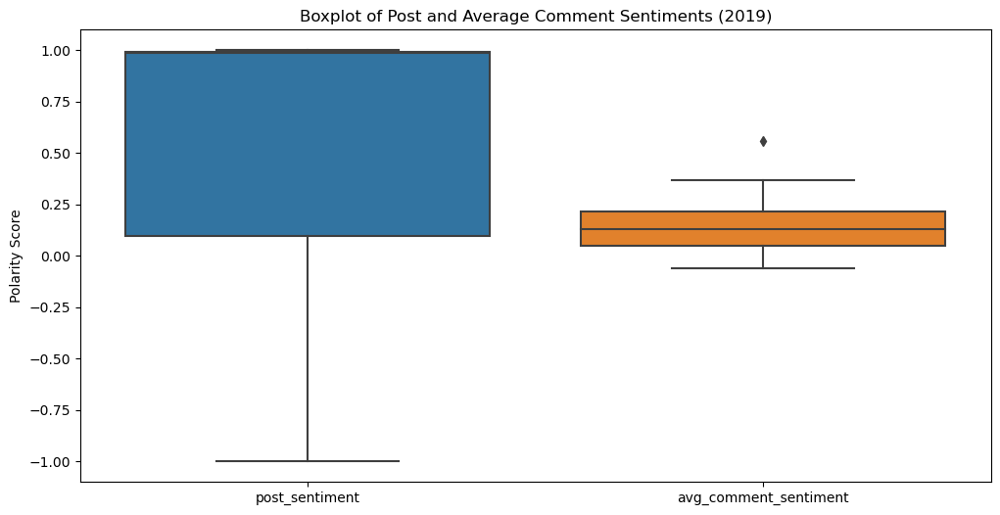

In [34]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_posts[['post_sentiment', 'avg_comment_sentiment']])
plt.title('Boxplot of Post and Average Comment Sentiments (2019)')
plt.ylabel('Polarity Score')
plt.show()

Posts Very Positive median
Comments very symmetric

In [36]:
# Extract month from the 'created' timestamp
df_posts['month'] = df_posts['created'].dt.month

# Calculate average sentiments per month
monthly_sentiments = df_posts.groupby('month').agg({
    'post_sentiment': 'mean',
    'avg_comment_sentiment': 'mean'
}).reset_index()

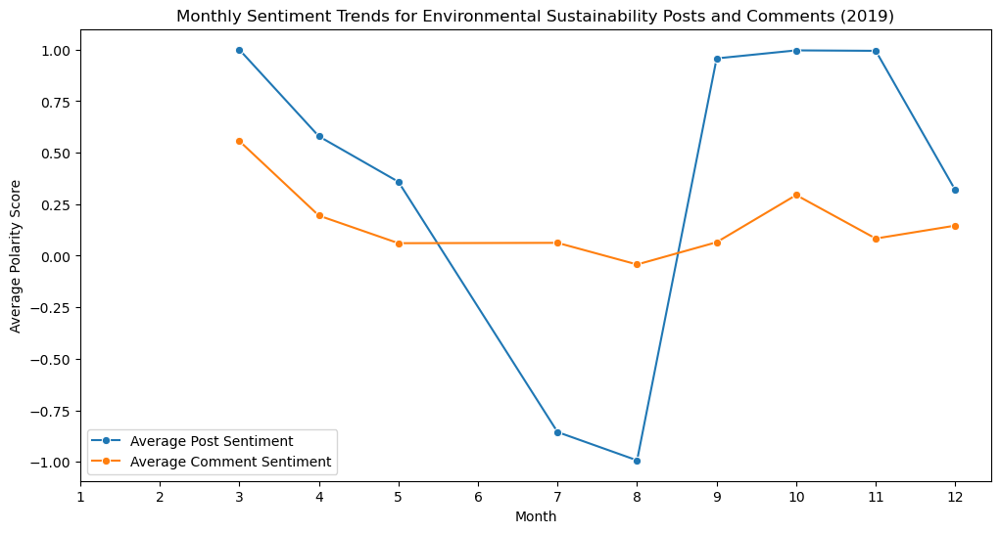

In [37]:
# Plotting the sentiment trends over months
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sentiments, x='month', y='post_sentiment', label='Average Post Sentiment', marker='o')
sns.lineplot(data=monthly_sentiments, x='month', y='avg_comment_sentiment', label='Average Comment Sentiment', marker='o')
plt.title('Monthly Sentiment Trends for Environmental Sustainability Posts and Comments (2019)')
plt.xlabel('Month')
plt.ylabel('Average Polarity Score')
plt.xticks(range(1, 13))
plt.legend()
plt.show()

Aug 2019

Forest Fires in Brasil:

In [40]:
# Filter posts created in August 2019
august_posts = df_posts[df_posts['created'].dt.month == 8]

# Print the posts and their comments
for index, post in august_posts.iterrows():
    print(f"Post {index + 1}")
    print("="*40)
    print(f"Title: {post['title']}")
    print(f"Author: {post['author']}")
    print(f"Subreddit: {post['subreddit']}")
    print(f"Date: {post['created'].strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"Score: {post['score']}")
    print(f"Comments: {post['num_comments']}")
    print(f"Post Content:\n{post['selftext']}")
    print(f"Post Sentiment: {post['post_sentiment']:.2f}")
    print("-"*40)
    
#     # Print comments for this post
#     try:
#         submission = reddit.submission(id=post['id'])
#         submission.comments.replace_more(limit=0)
#         for comment in submission.comments.list():
#             print(f"Comment by {comment.author}:")
#             print(comment.body)
#             print(f"Comment Sentiment: {sid.polarity_scores(comment.body)['compound']:.2f}")
#             print("-"*40)
#     except Exception as e:
#         print(f"Could not retrieve comments for post {post['id']}. Error: {e}")
    
#     print("="*40)
#     print("\n")

Post 16
Title: Megathread sobre os incêndios na Floresta Amazônica em Português/English Megathread regarding the Amazon forest fires
Author: modsbr
Subreddit: brasil
Date: 2019-08-22 14:05:36
Score: 1272
Comments: 374
Post Content:
https://i.redd.it/wxz48yv7bvh31.jpg

*Se alguém se oferecer a traduzir o conteúdo em espanhol, nós ficaríamos muito gratos!*

---

##1. That bullshit with INPE (Brazil's National Space Research Institute)

- INPE, as usual, [released their data](http://terrabrasilis.dpi.inpe.br/app/dashboard/alerts/legal/amazon/aggregated/). It got pretty popular and [received international coverage](https://www.theguardian.com/world/2019/jun/04/deforestation-of-brazilian-amazon-surges-to-record-high-bolsonaro) as it showed a substantial increase in deforestation.

- [Bolsonaro openly rejected the data](https://www.theguardian.com/world/2019/jul/19/jair-bolsonaro-brazil-amazon-rainforest-deforestation) and even said:

>“A questão do INPE, eu tenho a convicção que os dados sã

May 2019

In [42]:
df_may = df_2019[(df_2019['created'].dt.month == 5)]

if df_may.empty:
    print("No posts found for May 2019.")

df_may

,title,score,id,url,comms_num,created,subreddit,body,author,month
60,"Richard Di Natale, Leader of the Australian Gr...",2944,bmug1w,https://www.reddit.com/r/australia/comments/bm...,261,2019-05-10 07:32:14,australia,"Hey Reddit, it's been far too long between pos...",RichardDiNatale,2019-05
67,"GMO Crops are perfectly safe and healthy, and ...",2684,bk0dy1,https://www.reddit.com/r/unpopularopinion/comm...,429,2019-05-02 23:27:32,unpopularopinion,"\n\nAlmost all of our food today, in terms of...",Cheezcayk,2019-05
128,A Historical Perspective on Collapse,1484,br0vtq,https://www.reddit.com/r/collapse/comments/br0...,238,2019-05-20 22:30:20,collapse,"This is going to be a huge effort post, so bea...",Ucumu,2019-05
201,Elon's Actual Cost Cutting Letter For Tesla Em...,1001,bq50s8,https://www.reddit.com/r/teslamotors/comments/...,402,2019-05-18 17:13:02,teslamotors,\n\nFrom: Elon Musk\n\nTo: Everybody\n\nDate:...,Singuy888,2019-05


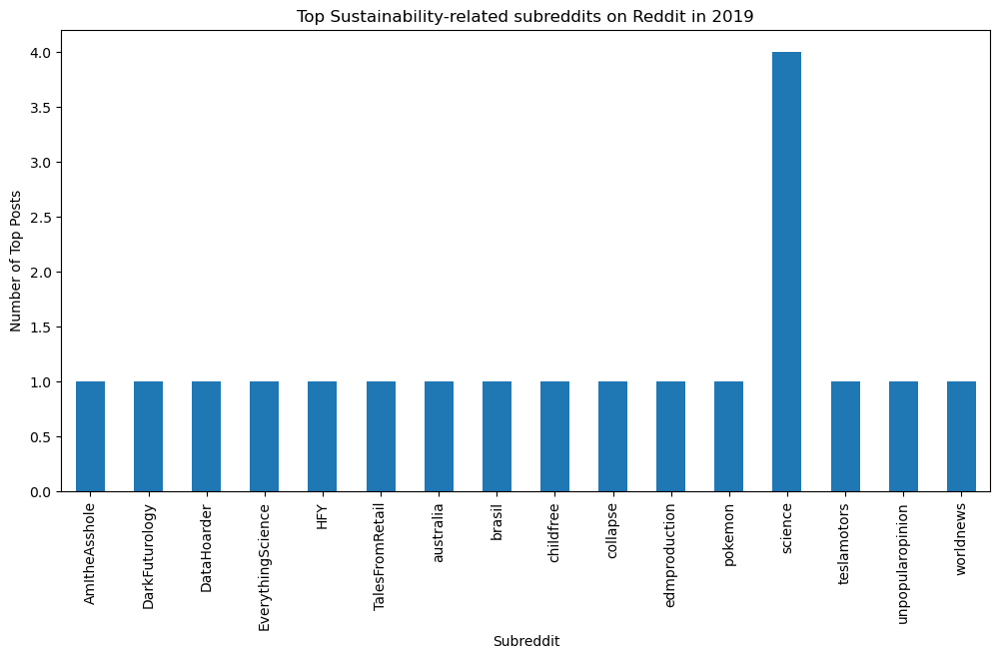

In [43]:
top_subs_per_freq = df_2019.groupby('subreddit').size()

top_subs_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related subreddits on Reddit in 2019")
plt.xlabel("Subreddit")
plt.ylabel("Number of Top Posts")
plt.show()

In [44]:
df_science = df_2019[(df_2019['subreddit'] == 'science')]

if df_science.empty:
    print("No posts found.")

df_science[['title', 'score', 'comms_num', 'created','author']]

,title,score,comms_num,created,author
4,India can sustainably enhance its food supply ...,29908,943,2019-12-07 19:17:29,MistWeaver80
8,Science Discussion Series: Batteries seem to p...,14429,1259,2019-04-30 15:40:15,ScienceModerator
17,Science Discussion Series: What should and sho...,6896,413,2019-10-03 15:06:05,ScienceModerator
27,Science discussion series: We are an interdisc...,5584,824,2019-04-03 20:11:58,ScienceModerator


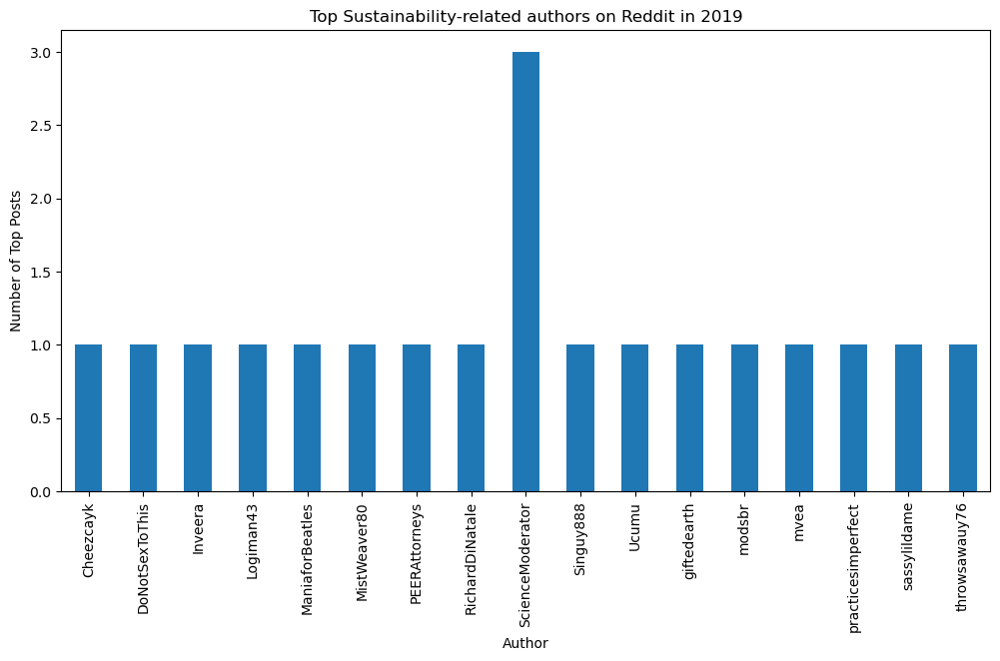

In [45]:
top_authors_per_freq = df_2019.groupby('author').size()

top_authors_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related authors on Reddit in 2019")
plt.xlabel("Author")
plt.ylabel("Number of Top Posts")
plt.show()

In [46]:
df_sm = df_2019[(df_2019['author'] == 'ScienceModerator')]

if df_sm.empty:
    print("No posts found.")

df_sm[['title', 'score', 'comms_num', 'created','subreddit']]

,title,score,comms_num,created,subreddit
8,Science Discussion Series: Batteries seem to p...,14429,1259,2019-04-30 15:40:15,science
17,Science Discussion Series: What should and sho...,6896,413,2019-10-03 15:06:05,science
27,Science discussion series: We are an interdisc...,5584,824,2019-04-03 20:11:58,science


Dec 2019

In [48]:
df_dec = df_2019[(df_2019['created'].dt.month == 12)]

if df_dec.empty:
    print("No posts found for May 2019.")

df_dec

,title,score,id,url,comms_num,created,subreddit,body,author,month
4,India can sustainably enhance its food supply ...,29908,e7hp20,https://www.pnas.org/content/early/2019/11/20/...,943,2019-12-07 19:17:29,science,,MistWeaver80,2019-12
124,Why the future is really Grim,1561,e8ahfs,https://www.reddit.com/r/DarkFuturology/commen...,284,2019-12-09 15:15:56,DarkFuturology,"Hi all,\n\nEDIT 2020: Posted this as an articl...",Logiman43,2019-12
147,Sorry we don't have that section,1315,efun0p,https://www.reddit.com/r/TalesFromRetail/comme...,138,2019-12-26 12:58:30,TalesFromRetail,I work in a large and busy department bookstor...,practicesimperfect,2019-12
175,Urgent Request: federal databases disappearing...,1158,ea0wx2,https://www.reddit.com/r/DataHoarder/comments/...,106,2019-12-13 08:30:57,DataHoarder,"Hello all,\n\nI'm new to this community but I'...",PEERAttorneys,2019-12


### 2020

In [50]:
df_2020 = df_all[(df_all['created'].dt.year == 2020)]
top_posts_per_month = df_2020.groupby('month').size()

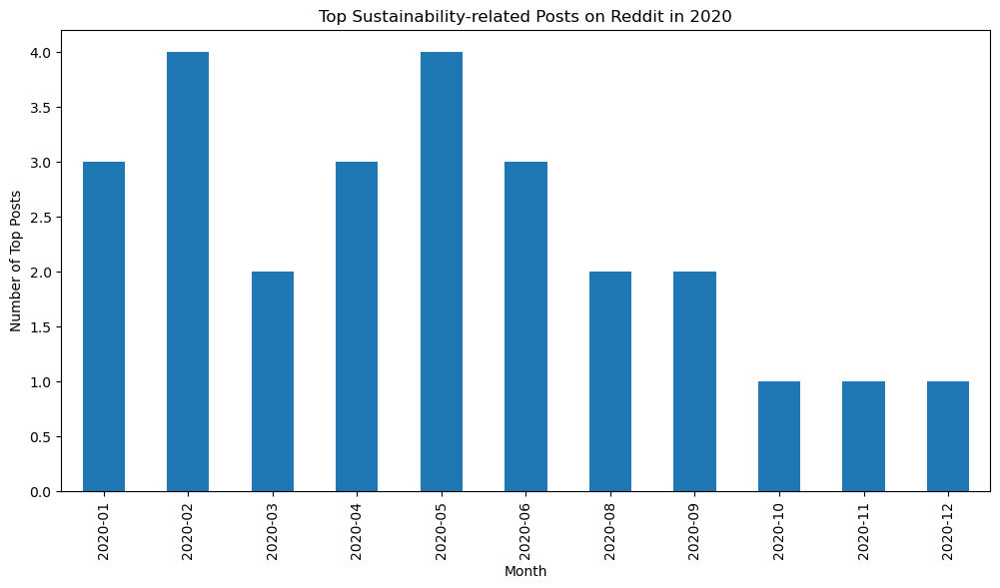

In [51]:
# Plotting the number of top posts over time
top_posts_per_month.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related Posts on Reddit in 2020")
plt.xlabel("Month")
plt.ylabel("Number of Top Posts")
plt.show()

In [52]:
df_feb = df_2020[(df_2020['created'].dt.month == 2)]

if df_feb.empty:
    print("No posts found ")

df_feb[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
39,First Contact - Part Two,4385,128,HFY,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
70,"How has Shinto, an animist/nature worshipping ...",2576,40,AskHistorians,Japan is often seen as an environmental leader...,Jackissocool
117,JPMorgan announces big moves to support enviro...,1687,148,stocks,https://www.cnbc.com/2020/02/25/jpmorgan-says-...,coolcomfort123
228,"In honor of President's Day, here is a list of...",886,50,suggestmeabook,"Chances are, you can't name all 44 former Pres...",vienna95


In [53]:
df_may = df_2020[(df_2020['created'].dt.month == 5)]

if df_may.empty:
    print("No posts found for May 2019.")

df_may[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
16,I am Andrew Romanoff and I'm running to flip t...,8105,162,SandersForPresident,Hey everybody! This is Andrew. I really apprec...,Romanoff2020
50,AskScience AMA Series: We're from the Pacific ...,3433,280,askscience,"Within the next decade, the blue economy could...",AskScienceModerator
73,First Contact Second Wave - Chapter 190,2538,172,HFY,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
74,First Contact Second Wave - Chapter 179 (Empire),2533,116,HFY,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne


In [54]:
df_hfy = df_2020[(df_2020['subreddit'] == 'HFY')]

if df_hfy.empty:
    print("No posts found ")

df_hfy[['title', 'score', 'comms_num', 'body', 'author']]

,title,score,comms_num,body,author
39,First Contact - Part Two,4385,128,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
69,First Contact - Third Wave - Chapter 393,2597,184,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
73,First Contact Second Wave - Chapter 190,2538,172,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
74,First Contact Second Wave - Chapter 179 (Empire),2533,116,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
78,First Contact - Second Wave Chpt 130,2469,182,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne
79,First Contact - TOTAL WAR - 267 (Lost Data),2404,96,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne


In [55]:
df_ralts = df_2020[(df_2020['author'] == 'Ralts_Bloodthorne')]

if df_ralts.empty:
    print("No posts ")

df_ralts[['title', 'score', 'comms_num', 'body', 'subreddit']]

,title,score,comms_num,body,subreddit
39,First Contact - Part Two,4385,128,\[[first](https://www.reddit.com/r/HFY/comment...,HFY
69,First Contact - Third Wave - Chapter 393,2597,184,\[[first](https://www.reddit.com/r/HFY/comment...,HFY
73,First Contact Second Wave - Chapter 190,2538,172,\[[first](https://www.reddit.com/r/HFY/comment...,HFY
74,First Contact Second Wave - Chapter 179 (Empire),2533,116,\[[first](https://www.reddit.com/r/HFY/comment...,HFY
78,First Contact - Second Wave Chpt 130,2469,182,\[[first](https://www.reddit.com/r/HFY/comment...,HFY
79,First Contact - TOTAL WAR - 267 (Lost Data),2404,96,\[[first](https://www.reddit.com/r/HFY/comment...,HFY


A series of fictional stories

In [57]:
# Fetch the subreddit information
subreddit = reddit.subreddit('HFY')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: HFY
Title: Humanity, Fuck Yeah!
Description/About:
We're a writing focused subreddit welcoming all media exhibiting the awesome potential of humanity, known as HFY or "Humanity, Fuck Yeah!"  

We welcome sci-fi, fantasy, and all other stories with a focus on humans being awesome!
Subscriber Count: 337281
Created on: 2013-08-20 02:53:16


In [58]:
user = reddit.redditor('Ralts_Bloodthorne')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: Ralts_Bloodthorne
Total Karma: 807518
Link Karma: 518241
Comment Karma: 289277
Account Created: 2015-09-20 05:41:55
Is Gold: True
Has Verified Email: True


In [59]:
# Define the start and end timestamps for 2020
start_timestamp = int(datetime(2020, 1, 1).timestamp())
end_timestamp = int(datetime(2020, 12, 31, 23, 59, 59).timestamp())

In [60]:
# Collect posts and their comments
posts_data = []

for submission in subreddit.search(query, sort=sort_by, limit=limit):
    post_date = utc_to_datetime(submission.created_utc)
    
    # Filter posts from 2020
    if start_timestamp <= submission.created_utc <= end_timestamp:
        # Analyze sentiment of the post
        post_text = submission.title + " " + submission.selftext
        post_sentiment = sid.polarity_scores(post_text)['compound']
        
        # Initialize list to store comment sentiments
        comment_sentiments = []
        
        # Fetch comments
        submission.comments.replace_more(limit=0)  # Replace "MoreComments" objects
        for comment in submission.comments.list():
            # Analyze sentiment of the comment
            comment_text = comment.body
            comment_sentiment = sid.polarity_scores(comment_text)['compound']
            comment_sentiments.append(comment_sentiment)
        
        # Calculate average comment sentiment
        avg_comment_sentiment = sum(comment_sentiments) / len(comment_sentiments) if comment_sentiments else 0
        
        # Append post data
        posts_data.append({
            'title': submission.title,
            'score': submission.score,
            'id': submission.id,
            'url': submission.url,
            'num_comments': submission.num_comments,
            'created': post_date,
            'subreddit': submission.subreddit.display_name,
            'author': str(submission.author),
            'selftext': submission.selftext,
            'post_sentiment': post_sentiment,
            'avg_comment_sentiment': avg_comment_sentiment
        })
        
        print(f"Processed post: {submission.title}")

Processed post: First Contact - Part Two
Processed post: First Contact - Third Wave - Chapter 393
Processed post: First Contact Second Wave - Chapter 190
Processed post: First Contact Second Wave - Chapter 179 (Empire)
Processed post: First Contact - Second Wave Chpt 130
Processed post: First Contact - TOTAL WAR - 267 (Lost Data)
Processed post: The HEL Jumper [Chapter 3.34]
Processed post: Bonfire of the Vanities
Processed post: Heritage (1)
Processed post: An Honest Mistake
Processed post: And They Smiled
Processed post: [OC] Listen Here
Processed post: Monsters are born in war - Part 4
Processed post: Discovery
Processed post: Sacrifices #63
Processed post: Humanity's Advancement in VR Technology
Processed post: URP-1003, Part 1: Expedition
Processed post: Burning Stars, Falling Skies - Chapter 23 - The Last Supper
Processed post: [Alien Crash] Bk2 V1 Ch 10 Dangerous Success
Processed post: Interplanetary Apocalypse 1.1 [OC]
Processed post: Project STARGAZER 36 For the Record
Proces

In [61]:
# Convert collected data to a DataFrame
df_posts = pd.DataFrame(posts_data)

# Display basic information about the DataFrame
print(f"Total posts collected: {len(df_posts)}")

Total posts collected: 23


In [62]:
# Descriptive statistics for post sentiments
print("Post Sentiment Statistics:")
print(df_posts['post_sentiment'].describe())

Post Sentiment Statistics:
count    23.000000
mean     -0.585830
std       0.793713
min      -1.000000
25%      -0.999300
50%      -0.997800
75%      -0.939250
max       1.000000
Name: post_sentiment, dtype: float64


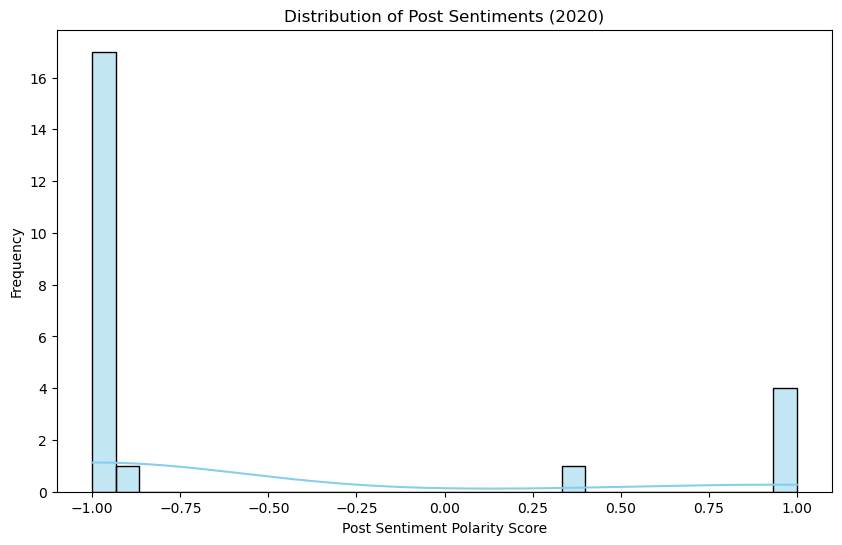

In [63]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['post_sentiment'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Post Sentiments (2020)')
plt.xlabel('Post Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

In [64]:
# Descriptive statistics for comment sentiments
print("\nAverage Comment Sentiment Statistics:")
print(df_posts['avg_comment_sentiment'].describe())


Average Comment Sentiment Statistics:
count    23.000000
mean      0.128893
std       0.189736
min      -0.134725
25%      -0.004045
50%       0.037479
75%       0.268522
max       0.463186
Name: avg_comment_sentiment, dtype: float64


Max and min are fairly clos to neutral like people were somehow indifferent towards positive like last year

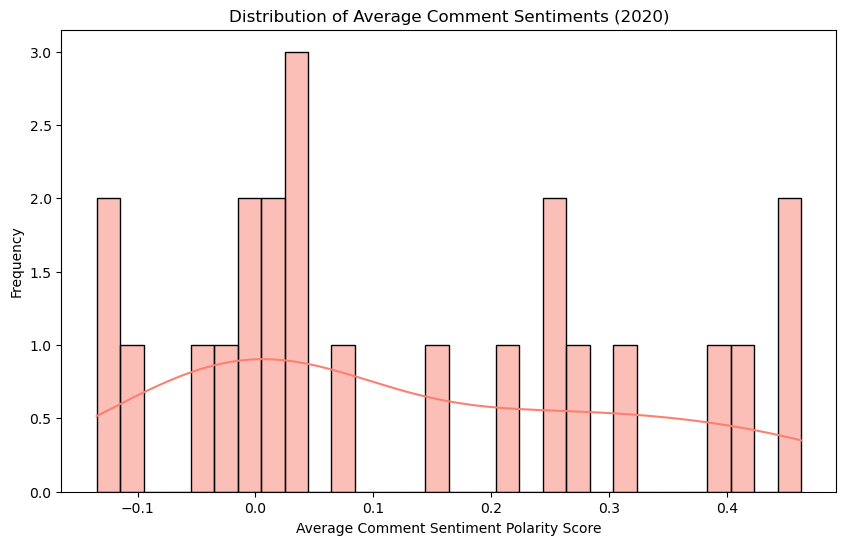

In [66]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['avg_comment_sentiment'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Average Comment Sentiments (2020)')
plt.xlabel('Average Comment Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

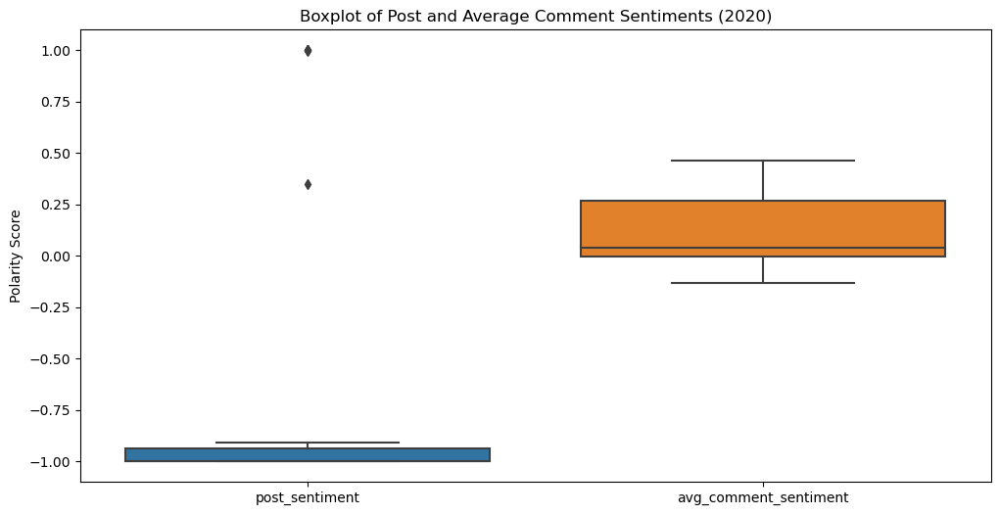

In [67]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_posts[['post_sentiment', 'avg_comment_sentiment']])
plt.title('Boxplot of Post and Average Comment Sentiments (2020)')
plt.ylabel('Polarity Score')
plt.show()

In [68]:
# Extract month from the 'created' timestamp
df_posts['month'] = df_posts['created'].dt.month

# Calculate average sentiments per month
monthly_sentiments = df_posts.groupby('month').agg({
    'post_sentiment': 'mean',
    'avg_comment_sentiment': 'mean'
}).reset_index()

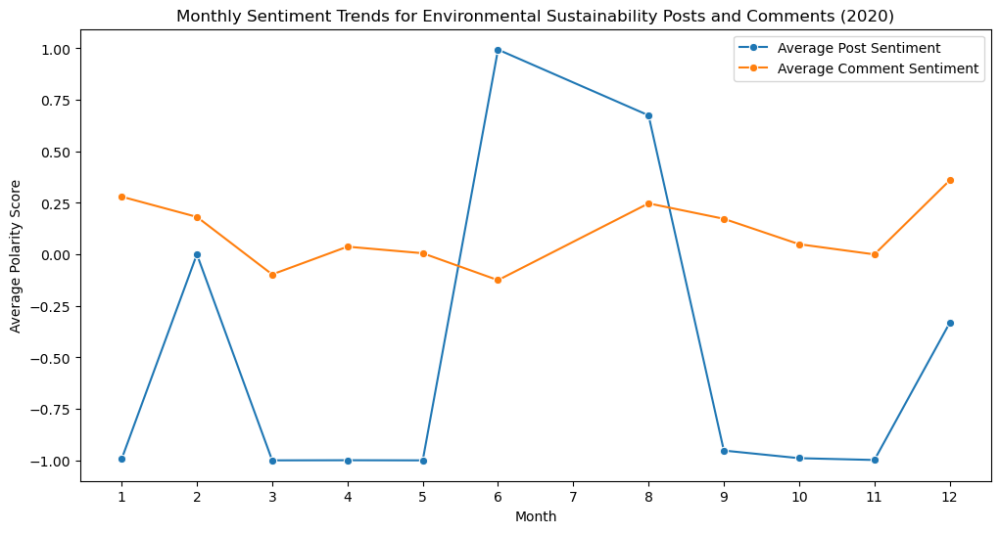

In [69]:
# Plotting the sentiment trends over months
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sentiments, x='month', y='post_sentiment', label='Average Post Sentiment', marker='o')
sns.lineplot(data=monthly_sentiments, x='month', y='avg_comment_sentiment', label='Average Comment Sentiment', marker='o')
plt.title('Monthly Sentiment Trends for Environmental Sustainability Posts and Comments (2020)')
plt.xlabel('Month')
plt.ylabel('Average Polarity Score')
plt.xticks(range(1, 13))
plt.legend()
plt.show()

- December to be checked - 

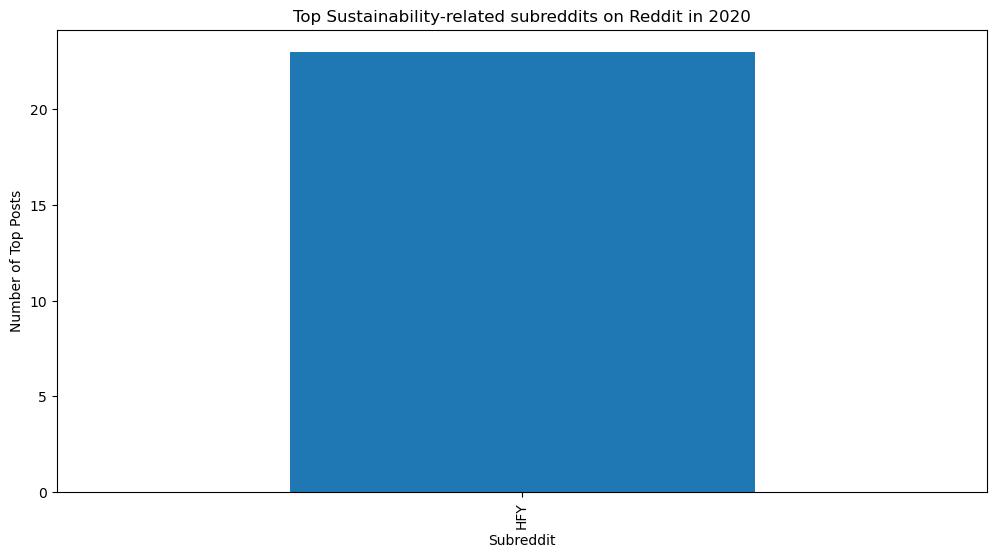

In [71]:
top_subs_per_freq = df_posts.groupby('subreddit').size()

top_subs_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related subreddits on Reddit in 2020")
plt.xlabel("Subreddit")
plt.ylabel("Number of Top Posts")
plt.show()

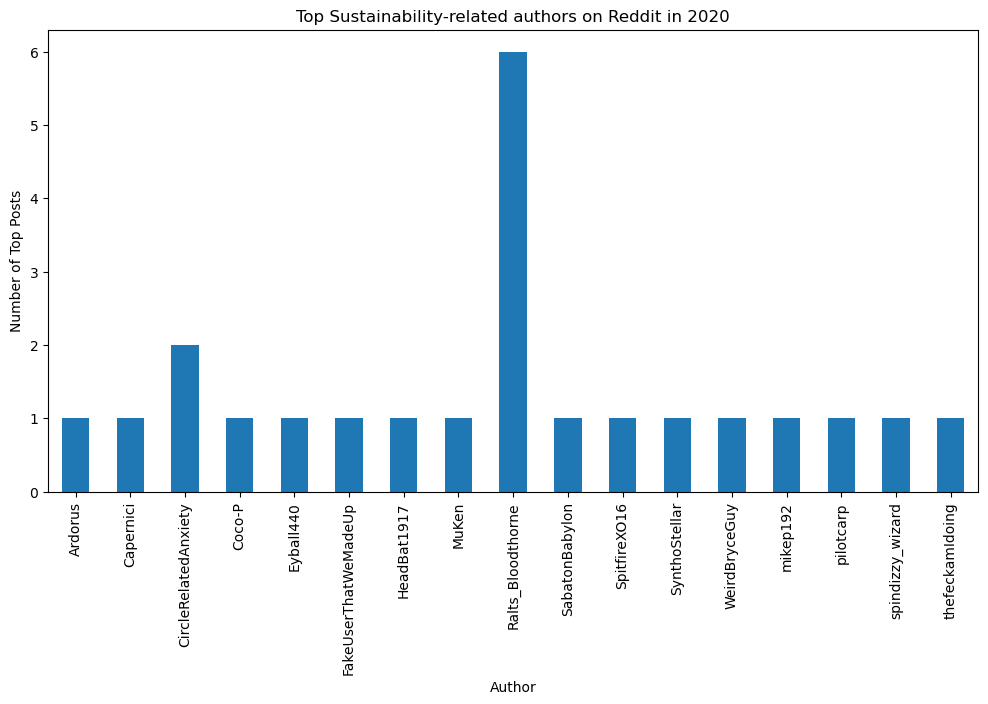

In [72]:
top_authors_per_freq = df_posts.groupby('author').size()

top_authors_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related authors on Reddit in 2020")
plt.xlabel("Author")
plt.ylabel("Number of Top Posts")
plt.show()

### 2021

In [74]:
df_all.columns

Index(['title', 'score', 'id', 'url', 'comms_num', 'created', 'subreddit',
       'body', 'author', 'month'],
      dtype='object')

In [75]:
df_2021 = df_all[(df_all['created'].dt.year == 2021)]
top_posts_per_month = df_2021.groupby('month').size()

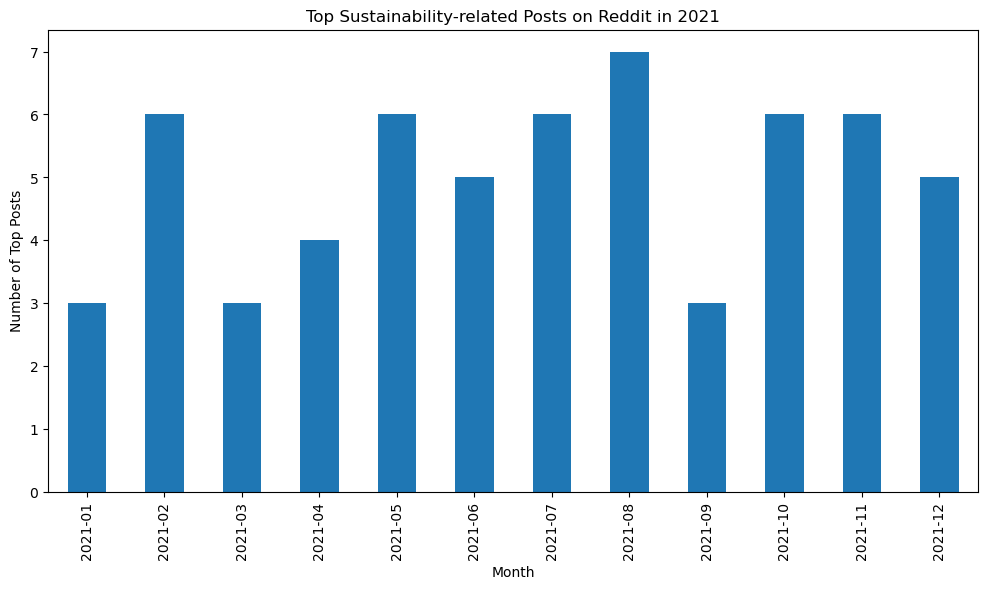

In [76]:
# Plotting the number of top posts over time
top_posts_per_month.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related Posts on Reddit in 2021")
plt.xlabel("Month")
plt.ylabel("Number of Top Posts")
plt.show()

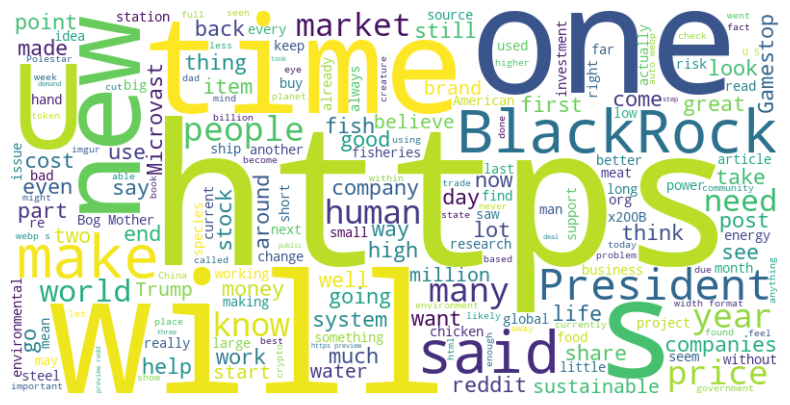

In [403]:
# Create the word cloud
# Concatenate the 'body' and 'text' columns into a single string
combined_text = ' '.join(df_2021['body'] + ' ' + df_2021['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)
# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Turn off axis
plt.show()

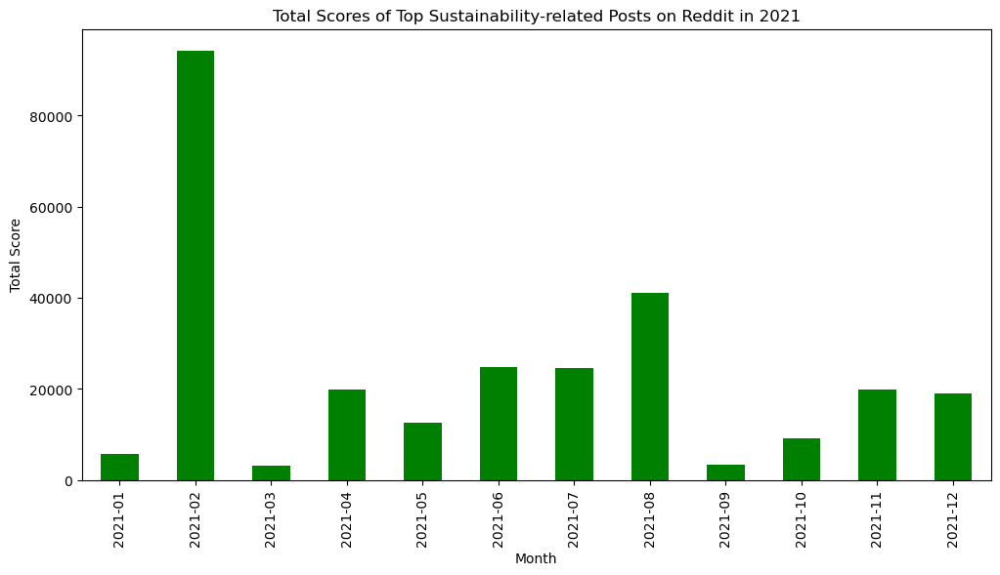

In [77]:
# Grouping by month and summing the scores
score_per_month = df_2021.groupby('month')['score'].sum()

# Plotting the total scores over time
score_per_month.plot(kind='bar', figsize=(12, 6), color='green')
plt.title("Total Scores of Top Sustainability-related Posts on Reddit in 2021")
plt.xlabel("Month")
plt.ylabel("Total Score")
plt.show()

In [78]:
df_feb = df_2021[(df_2021['created'].dt.month == 2)]

if df_feb.empty:
    print("No posts found for February 2021.")

df_feb[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
0,Chemists developed two sustainable plastic alt...,71984,1115,science,,mvea
10,Chemists developed two sustainable plastic alt...,13989,234,Futurology,,blaspheminCapn
57,Trump under criminal investigation in Georgia,3126,76,Keep_Track,Welcome to… a series I don’t have a name for. ...,rusticgorilla
82,So infuriated by meal kits,2337,324,ZeroWaste,I see commercials for meals kits like hello fr...,g00ber88
101,Today is Presidents' Day in the United States....,1875,121,suggestmeabook,"I made this list last year, but I've updated i...",vienna95
196,Environmental Sustainability,1023,65,sustainability,,lenasamford


In [79]:
df_feb.iloc[0]['title']

'Chemists developed two sustainable plastic alternatives to polyethylene, derived from plants, that can be recycled with a recovery rate of more than 96%, as low-waste, environmentally friendly replacements to conventional fossil fuel-based plastics. (Nature, 17 Feb)'

In [80]:
df_feb.loc[10]['title']

'Chemists developed two sustainable plastic alternatives to polyethylene, derived from plants, that can be recycled with a recovery rate of more than 96%, as low-waste, environmentally friendly replacements to conventional fossil fuel-based plastics. (Nature, 17 Feb)'

In [81]:
# Function to get comments for a specific Reddit post ID
def get_comments(post_id):
    submission = reddit.submission(id=post_id)
    submission.comments.replace_more(limit=0)  # Flatten the comment tree
    comments = []
    for comment in submission.comments.list():
        comments.append(comment.body)
    return comments

In [82]:
# Get post IDs for rows 0 and 10
post_id_row_0 = df_feb.iloc[0]['id']  # Assuming 'id' is the post ID
post_id_row_10 = df_feb.loc[10]['id']

In [83]:
# Get comments for these posts
comments_row_0 = get_comments(post_id_row_0)
comments_row_10 = get_comments(post_id_row_10)

In [84]:
def analyze_sentiment(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity

In [85]:
# Analyze sentiment for each comment in row 0
sentiments_row_0 = [analyze_sentiment(comment) for comment in comments_row_0]

# Analyze sentiment for each comment in row 10
sentiments_row_10 = [analyze_sentiment(comment) for comment in comments_row_10]

In [86]:
# Calculate and print average sentiment
print("Average sentiment for comment in row 0:", sum(sentiments_row_0) / len(sentiments_row_0))
print("Average sentiment for comment in row 10:", sum(sentiments_row_10) / len(sentiments_row_10))

Average sentiment for comment in row 0: 0.10020184585883025
Average sentiment for comment in row 10: 0.04991659947841668


In [87]:
user = reddit.redditor('blaspheminCapn')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: blaspheminCapn
Total Karma: 636611
Link Karma: 456222
Comment Karma: 180389
Account Created: 2009-05-04 02:11:47
Is Gold: False
Has Verified Email: True


In [88]:
df_aug = df_2021[(df_2021['created'].dt.month == 8)]

if df_aug.empty:
    print("No posts found for August 2021.")

df_aug[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
3,Why the FUCK are we still catering to billiona...,30048,3557,TooAfraidToAsk,"Seriously, what? Why? Why are we enabling the ...",audyaudvi
40,Why Humans Avoid War XXIV,4332,67,HFY,[Available on Amazon as a hard-copy and an eBo...,SpacePaladin15
76,Microvast ($MVST) -The only DD you'll ever need,2491,685,wallstreetbets,"Listen up retards, this won't be short.\n\nThi...",Wild-Fisherman-2573
170,I fucking hate ethical ETFs.,1169,264,AusFinance,I’m expecting to ruffle some feathers but sorr...,happy__pineapples
177,Prelude to the Great Uno Reversal: GameStop po...,1131,95,GMEJungle,This is different from [Director of Finance](h...,hunting_snipes
191,Momentous Day for $Time Token | First Donation...,1052,27,CryptoMoonShots,We are pleased to announce today we’ve made ou...,LongLambros
231,We’re software engineers working on climate so...,890,124,cscareerquestions,"Hello, we are A from Greece (fire, heat wave) ...",BeingChandler


In [89]:
df_aug.loc[3]['title']

'Why the FUCK are we still catering to billionaires and the "elite" class when we\'re on the cusp of a scorched earth and total societal collapse? The Titanic is sinking and we\'re serving cucumber sandwiches and playing Vivaldi to 1st class in front of the lifeboats we don\'t get to use, WHY is this OK'

In [90]:
df_aug.loc[3]['body']

'Seriously, what? Why? Why are we enabling the people who are fucking up the planet we all have to live on? Why do we serve them their meals and drive their cars and clean their laundry? I have a fantasy where every POS rich person who got what they got through human suffering and exploitation is just...ignored. \n\nSeriousky, try it. Pick your least favorite corrupt politician or out-of-touch space-fucking billionaire and play a scene in your mind where they wake up and no one acknowledges them.\n\nImagine their pissy little hissy fits when they demand their breakfast or clothes for the day or whatever only to be met by total silence and an indifferent, formerly-loyal workforce. Imagine their pathetic little scrunched up face getting redder and redder when they realize that they\'ve lost it, it\'s gone...they can\'t coerce or bribe or threaten people to do their bidding anymore. They have to fucking cooperate if they want to live.\n\nI know there will ALWAYS be indoctrinated dipshits 

In [91]:
df_aug.loc[40]['title']

'Why Humans Avoid War XXIV'

In [92]:
df_aug.loc[40]['body'][:2000]

'[Available on Amazon as a hard-copy and an eBook!](https://www.amazon.com/dp/B0C1JCNNF7?linkCode=ssc&tag=onamzedithm0b-20&creativeASIN=B0C1JCNNF7&asc_item-id=amzn1.shoppablemedia.v1.5115d86b-d1c1-40b6-8d5f-0bdaa69bc362&ref_=aip_sf_photo_spv_ons_photo_d_asin) \n\n[First](https://www.reddit.com/r/HFY/comments/lvgoah/why_humans_avoid_war/) | [Prev](https://www.reddit.com/r/HFY/comments/ozct1g/why_humans_avoid_war_xxiii/) | [Next](https://www.reddit.com/r/HFY/comments/pc3b2w/why_humans_avoid_war_xxv/)\n\n\\---\n\n**Kilon POV**\n\nAs we hurtled toward an imminent collision, the sounds of coughing filled the bridge. An involuntary shudder ran down my spine; while I knew it was rather commonplace for their species, I could practically feel the rattling of their lungs.\n\nThe deteriorating conditions inside the flagship were affecting me as well. My eyes were burning from the billows of smoke that pooled in the air, and my skin was smoldering from the temperature, which had risen to an uncomf

In [93]:
post_id_row_3 = df_aug.loc[3]['id']  # Assuming 'id' is the post ID
post_id_row_40 = df_aug.loc[40]['id']

In [94]:
# Get comments for these posts
comments_row_3 = get_comments(post_id_row_3)
comments_row_40 = get_comments(post_id_row_40)

In [95]:
sentiments_row_3 = [analyze_sentiment(comment) for comment in comments_row_3]
sentiments_row_40 = [analyze_sentiment(comment) for comment in comments_row_40]

In [96]:
# Calculate and print average sentiment
print("Average sentiment for comment in row 3:", sum(sentiments_row_3) / len(sentiments_row_3))
print("Average sentiment for comment in row 40:", sum(sentiments_row_40) / len(sentiments_row_40))

Average sentiment for comment in row 3: 0.0413129399789905
Average sentiment for comment in row 40: 0.22767932542335118


In [97]:
user = reddit.redditor('audyaudvi')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: audyaudvi
Total Karma: 32429
Link Karma: 25989
Comment Karma: 6440
Account Created: 2019-06-09 19:11:27
Is Gold: False
Has Verified Email: True


In [98]:
user = reddit.redditor('SpacePaladin15')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: SpacePaladin15
Total Karma: 257179
Link Karma: 155514
Comment Karma: 101665
Account Created: 2021-02-05 05:40:28
Is Gold: False
Has Verified Email: True


audyaudvi has less karma but got more score for its post and less positive comments and more comments

the subreddit he posted in has more members

In [100]:
# Fetch the subreddit information
subreddit = reddit.subreddit('TooAfraidToAsk')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: TooAfraidToAsk
Title: Everything & Anything You Were Too Afraid To Ask
Description/About:
A place for any question you’ve ever been TooAfraidToAsk
Subscriber Count: 1821148
Created on: 2011-08-28 07:24:30


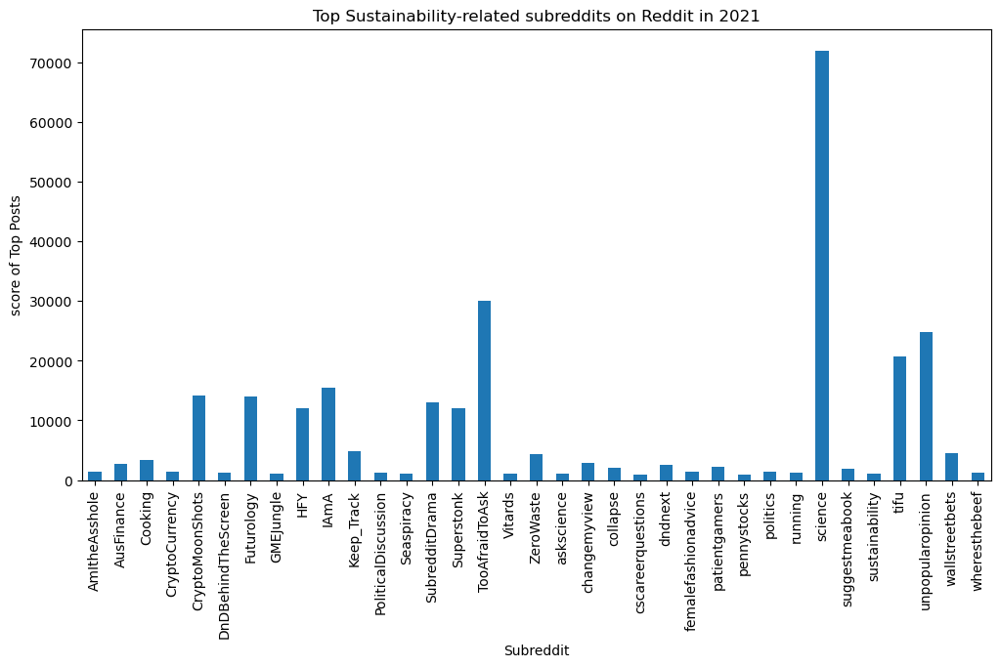

In [101]:
top_subs_per_freq = df_2021.groupby('subreddit')['score'].sum()

top_subs_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related subreddits on Reddit in 2021")
plt.xlabel("Subreddit")
plt.ylabel("score of Top Posts")
plt.show()

1 top subreddit of the 2 top months is not in the 2 total top: HFY.

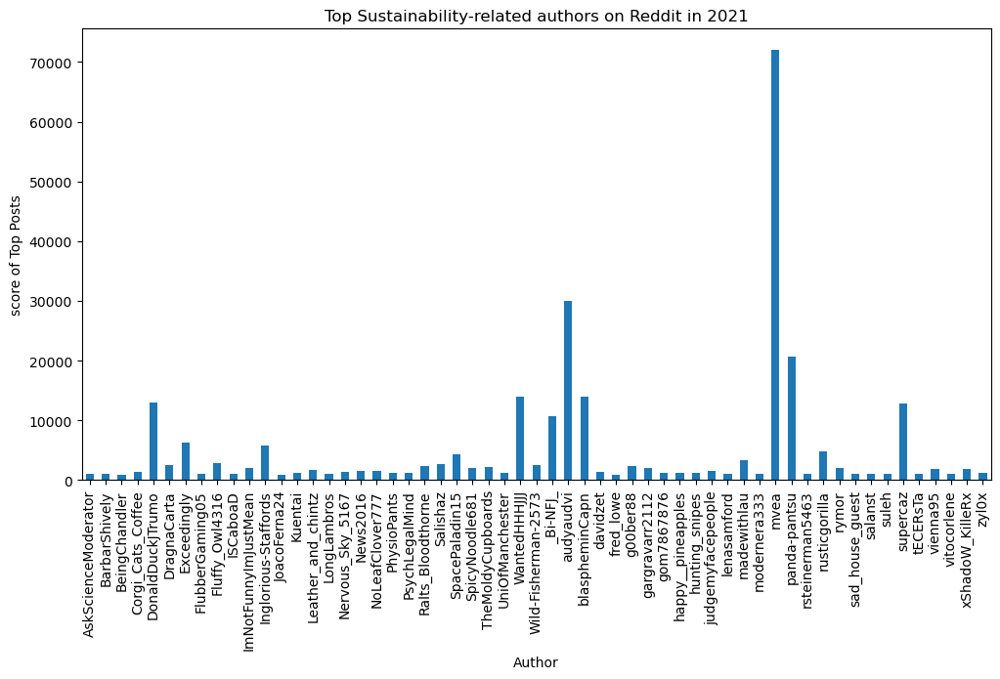

In [103]:
top_authors_per_freq = df_2021.groupby('author')['score'].sum()

top_authors_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related authors on Reddit in 2021")
plt.xlabel("Author")
plt.ylabel("score of Top Posts")
plt.show()

1 top author of the 2 top months is not in the 2 total top: SpacePaladin15.

In [105]:
query = "environmental sustainability"

limit = 500

# Setup Sentiment Analyzer
sid = SentimentIntensityAnalyzer()

In [106]:
# Set correct timestamps for the entire year of 2021
start_timestamp = int(time.mktime(datetime(2021, 1, 1).timetuple()))
end_timestamp = int(time.mktime(datetime(2021, 12, 31, 23, 59, 59).timetuple()))

In [107]:
# Collect posts and their comments
posts_data = []

for submission in reddit.subreddit('all').search(query, sort=sort_by, limit=limit):
    post_date = datetime.utcfromtimestamp(submission.created_utc)
    
    # Debugging output to track filtering
    #print(f"Found post from {post_date}: {submission.title}")

    # Filter posts from 2021
    if start_timestamp <= submission.created_utc <= end_timestamp:
        # Analyze sentiment of the post
        post_text = submission.title + " " + submission.selftext
        post_sentiment = sid.polarity_scores(post_text)['compound']
        
        # Initialize list to store comment sentiments
        comment_sentiments = []
        
        # Fetch comments
        submission.comments.replace_more(limit=0)  # Replace "MoreComments" objects
        for comment in submission.comments.list():
            # Analyze sentiment of the comment
            comment_text = comment.body
            comment_sentiment = sid.polarity_scores(comment_text)['compound']
            comment_sentiments.append(comment_sentiment)
        
        # Calculate average comment sentiment
        avg_comment_sentiment = sum(comment_sentiments) / len(comment_sentiments) if comment_sentiments else 0
        
        # Append post data
        posts_data.append({
            'title': submission.title,
            'score': submission.score,
            'id': submission.id,
            'url': submission.url,
            'num_comments': submission.num_comments,
            'created': post_date,
            'subreddit': submission.subreddit.display_name,
            'author': str(submission.author),
            'selftext': submission.selftext,
            'post_sentiment': post_sentiment,
            'avg_comment_sentiment': avg_comment_sentiment
        })
        
        print(f"Processed post: {submission.title}")

Processed post: Chemists developed two sustainable plastic alternatives to polyethylene, derived from plants, that can be recycled with a recovery rate of more than 96%, as low-waste, environmentally friendly replacements to conventional fossil fuel-based plastics. (Nature, 17 Feb)
Processed post: Why the FUCK are we still catering to billionaires and the "elite" class when we're on the cusp of a scorched earth and total societal collapse? The Titanic is sinking and we're serving cucumber sandwiches and playing Vivaldi to 1st class in front of the lifeboats we don't get to use, WHY is this OK
Processed post: TIFU by making my date believe I lead him to a field full of unburied corpses and acting cool about it
Processed post: Living an environmentally friendly life is a privilege.
Processed post: Chemists developed two sustainable plastic alternatives to polyethylene, derived from plants, that can be recycled with a recovery rate of more than 96%, as low-waste, environmentally friendly 

In [108]:
# Convert collected data to a DataFrame
df_posts = pd.DataFrame(posts_data)

# Display basic information about the DataFrame
print(f"Total posts collected: {len(df_posts)}")

Total posts collected: 60


Number of posts increased with respect to last year including number of series of fictional war stories

In [110]:
# Descriptive statistics for post sentiments
print("Post Sentiment Statistics:")
print(df_posts['post_sentiment'].describe())

Post Sentiment Statistics:
count    60.000000
mean      0.600003
std       0.695814
min      -0.998900
25%       0.668950
50%       0.980550
75%       0.997700
max       1.000000
Name: post_sentiment, dtype: float64


Mean sentiment has increased over the past 3 years

It took a dent in 2020 probably because of Covid?

In 2021 we see a lot of positive positive posts about green coins which were not present before

Also Trump leaves in 2021 and gives place to more enirroment friendly government

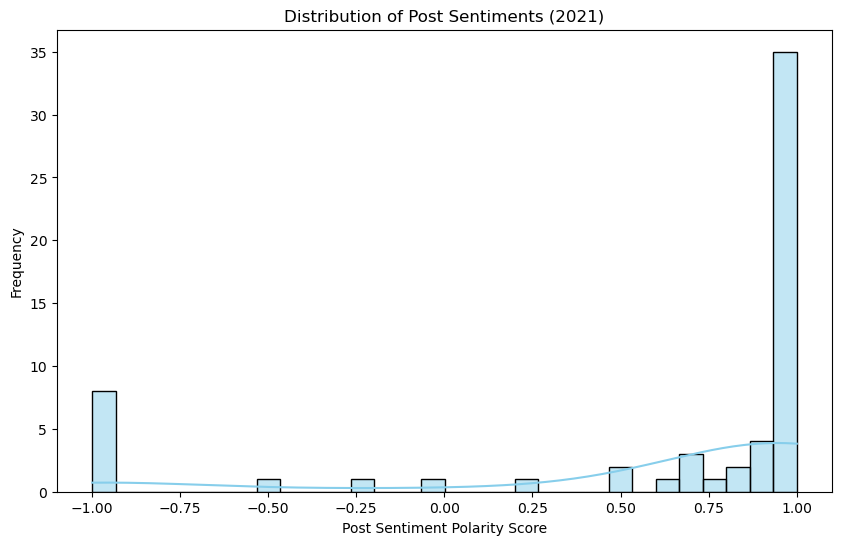

In [112]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['post_sentiment'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Post Sentiments (2021)')
plt.xlabel('Post Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

In [113]:
# Descriptive statistics for comment sentiments
print("\nAverage Comment Sentiment Statistics:")
print(df_posts['avg_comment_sentiment'].describe())


Average Comment Sentiment Statistics:
count    60.000000
mean      0.255849
std       0.209886
min      -0.078514
25%       0.109500
50%       0.224935
75%       0.332966
max       0.888500
Name: avg_comment_sentiment, dtype: float64


Max and min did not rich -1 and 1, but all statisctics increased with respect to last years

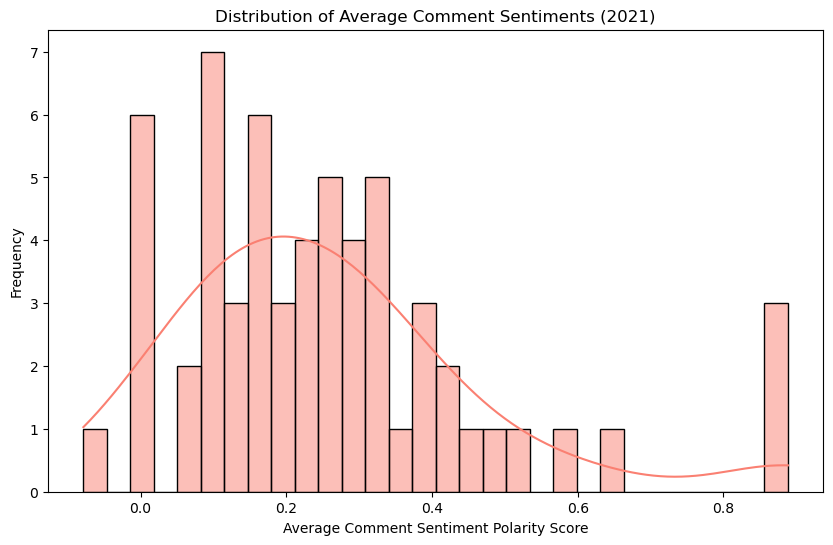

In [115]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['avg_comment_sentiment'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Average Comment Sentiments (2021)')
plt.xlabel('Average Comment Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

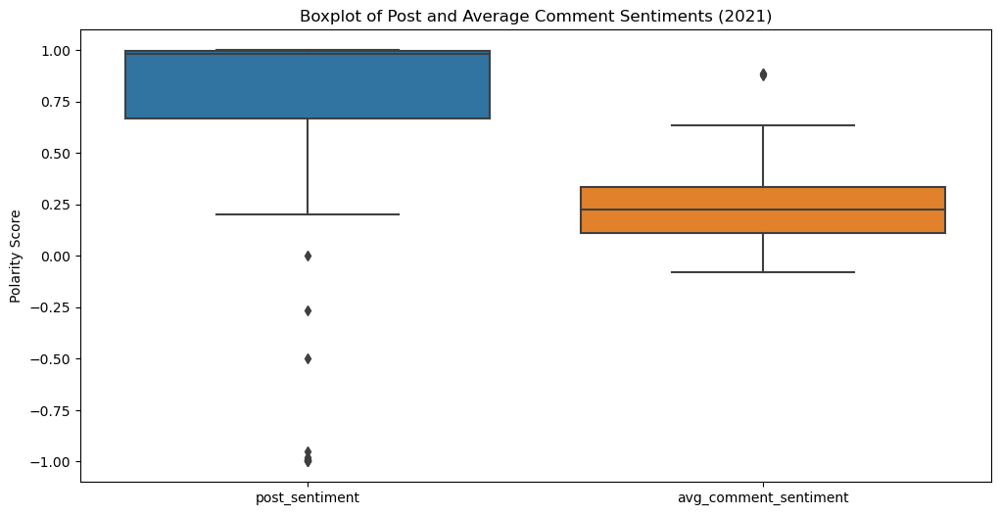

In [116]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_posts[['post_sentiment', 'avg_comment_sentiment']])
plt.title('Boxplot of Post and Average Comment Sentiments (2021)')
plt.ylabel('Polarity Score')
plt.show()

It is natural that by increasing the number of posts the number of outliers increased

All outliers all 0 or below

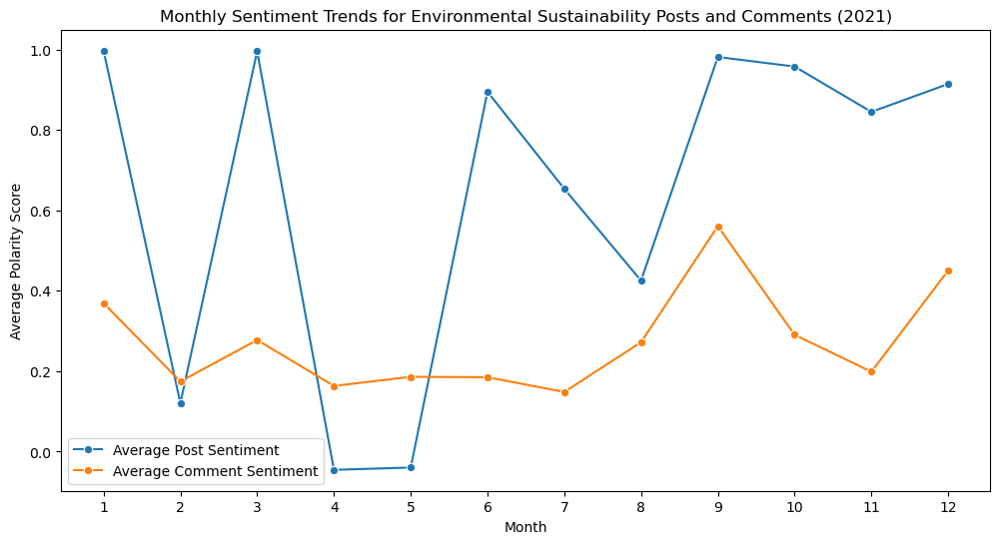

In [118]:
# Extract month from the 'created' timestamp
df_posts['month'] = df_posts['created'].dt.month

# Calculate average sentiments per month
monthly_sentiments = df_posts.groupby('month').agg({
    'post_sentiment': 'mean',
    'avg_comment_sentiment': 'mean'
}).reset_index()

# Plotting the sentiment trends over months
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sentiments, x='month', y='post_sentiment', label='Average Post Sentiment', marker='o')
sns.lineplot(data=monthly_sentiments, x='month', y='avg_comment_sentiment', label='Average Comment Sentiment', marker='o')
plt.title('Monthly Sentiment Trends for Environmental Sustainability Posts and Comments (2021)')
plt.xlabel('Month')
plt.ylabel('Average Polarity Score')
plt.xticks(range(1, 13))
plt.legend()
plt.show()

Again I can say they almost move together

In [120]:
df_april = df_2021[(df_2021['created'].dt.month == 5)]

if df_april.empty:
    print("No posts found for April 2021.")

df_april[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
23,Elon’s Bitcoin Stance,5818,454,Superstonk,Just a thought but what the heck. Elon hates H...,Inglorious-Staffords
113,Biden admin appoints ICE lawyers and Trump app...,1702,91,Keep_Track,Housekeeping:\n\n* **HOW TO SUPPORT:** I know ...,rusticgorilla
130,Democrats Are Releasing a Massive Green Jobs a...,1479,46,politics,,News2016
153,The Low Hanging Fruit of Injury Prevention Par...,1281,95,running,**Some background to start:**\n\nThis will be ...,PhysioPants
165,Clean Meat is at the brink of revolutionising ...,1212,137,wheresthebeef,"**Reposting here if that is ok, because it was...",Kuentai
204,🌲GREENTREE COIN 🌲 | the first tree planting cr...,992,61,CryptoMoonShots,Elon Musk Tweeted today that they need a susta...,suleh


In [121]:
df_april.loc[23]['body']

'Just a thought but what the heck. Elon hates Hedgies.  Elon knows that Hedgies are using crypto currency to stave off margins calls and generate money in an unregulated environment. How do you crash crypto? Elon makes an announcement that he is no longer supporting it under the guise of environmental issues. Hedgies alternative liquidity (crypto) is falling plus the market value is falling Hedgies can no longer sustain revenue and guess what happens next?  MARGIN CALL. ELON WINS \nGME Soars!!!!'

Again the story of coins that emerged in 2021 affected also here

In [124]:
df_april.loc[113]['title']

'Biden admin appoints ICE lawyers and Trump appointees in first slate of immigration judges, angering advocates'

The aftermath of last years' elections and comparing governments

In [184]:
df_april.loc[113]['body'][:2000]

'Housekeeping:\n\n* **HOW TO SUPPORT:** I know we are all facing unprecedented financial hardships right now. If you are in the position to support my work, I have a [patreon](https://www.patreon.com/RusticGorilla), [venmo](http://www.venmo.com/rusticgorilla), and a [paypal](http://paypal.me/CobbAdrienne) set up. No pressure though, I will keep posting these pieces publicly no matter what - paywalls suck.\n\n* **NOTIFICATIONS:** You can [signup](http://eepurl.com/gKUtUH) to receive a once-weekly email with links to my posts.\n\n---\n---\n\n##Conflicts of interest\n\n**Tommy Beaudreau, Biden’s choice for deputy interior secretary, has drawn attention for a long list of conflicts of interest stemming from his work in the private sector.** Beaudreau’s recent financial disclosure ([PDF](https://extapps2.oge.gov/201/Presiden.nsf/PAS+Index/C41A98393C66DBB4852586BF002EB529/%24FILE/Beaudreau,%20Tommy%20%20final278.pdf)) reported work for 35 clients in the energy business, including fossil fuel

In [185]:
df_may = df_2021[(df_2021['created'].dt.month == 4)]

if df_may.empty:
    print("No posts found for May 2021.")

df_may[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
9,Living an environmentally friendly life is a p...,14017,759,unpopularopinion,Many poor people do not have the financial cap...,WantedHHHJJJ
75,Why Skill Challenges Fix 5e's Broken Explorati...,2500,337,dndnext,# Why the Exploration Pillar is Broken\n\nTher...,DragnaCarta
95,Watched Seaspiracy last night. Absolutely amaz...,1992,442,collapse,So I turned vegetarian about 5 years ago for e...,gargravarr2112
155,Want more eldritch horror in your D&D? Check o...,1278,31,DnDBehindTheScreen,Edit: thank you everyone so much for all the h...,zyl0x


In [186]:
df_may.loc[9]['title']

'Living an environmentally friendly life is a privilege.'

In [187]:
df_may.loc[9]['body']

'Many poor people do not have the financial capabilities to be environmentally friendly. Refusing to buy single use plastics, driving a new car, and buying food from sustainable places is all a very costly practice. People who act like being environmentally friendly is easy don’t realize the privilege that they have.\n\nEdit: walking, riding a bike, or taking public transportation is not a viable choice for many people living in North America. People who live in rural communities, or in a neighbouring city have a commute that’s too long to walk/cycle. Also, public transportation infrastructure rarely is intercity and rarely serves rural communities. \n\nWhy not make bus routes then? is a massive diesel bus really worth the economic and pollution cost to pick up people from rural communities. Will an electric bus have the range to make these long trips multiple times a day?\n\nPeople who need to commute are often forced into financial troubles if their car has been made obsolete by emis

In [188]:
df_may.loc[75]['title']

"Why Skill Challenges Fix 5e's Broken Exploration System"

In [189]:
df_may.loc[75]['body'][:2000]

'# Why the Exploration Pillar is Broken\n\nThere has been [ample debate](https://www.reddit.com/r/dndnext/comments/mh4s3t/hot_take_this_game_has_plenty_of_exploration/) over the depth of the Exploration pillar in 5th Edition. Many DMs have rightly pointed out that 5e offers a complex array of mechanics for foraging, travelling, and hazards. Other DMs have argued that these rules are tedious to apply, easy to remove, and make for poor player engagement.\n\n5e’s Combat and Roleplay pillars are successful because they excel at *creating scenes*: opportunities for play-by-play conflict resolution, clear stakes, ongoing tension, and meaningful choice. By contrast, the Exploration pillar lacks any framework whatsoever for creating such scenes. *Unless your players can experience your campaign through interactive “scenes,” they’re not actually playing D&D*—they’re just rolling dice and listening to DM narration. Scenes are not “part” of D&D—they are *all* of D&D.\n\nCreating a combat scene is

This piece is taling about wheather situations in a game and therefore wrongfully included

### 2022

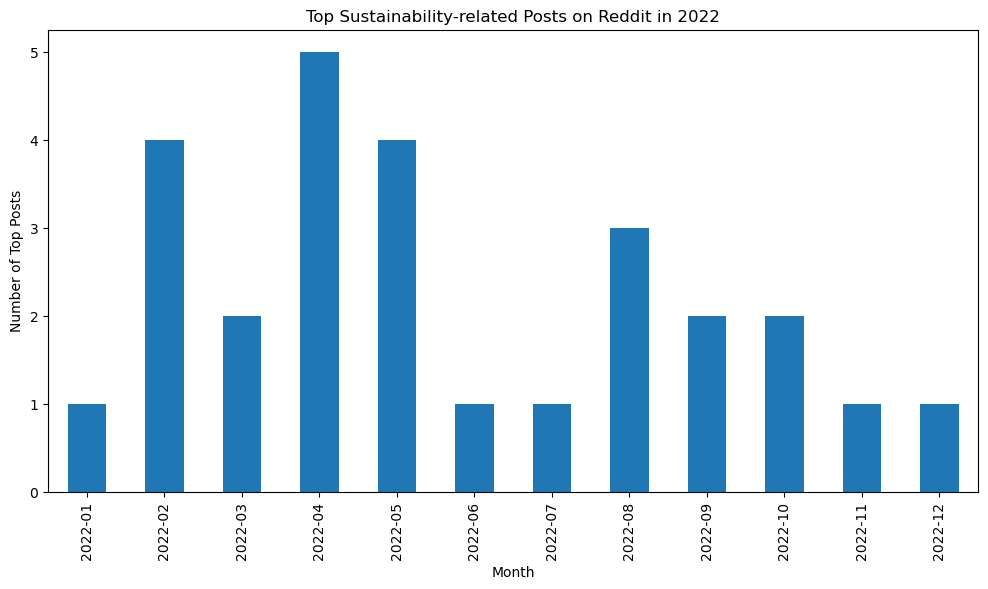

In [192]:
df_2022 = df_all[(df_all['created'].dt.year == 2022)]
top_posts_per_month = df_2022.groupby('month').size()

# Plotting the number of top posts over time
top_posts_per_month.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related Posts on Reddit in 2022")
plt.xlabel("Month")
plt.ylabel("Number of Top Posts")
plt.show()

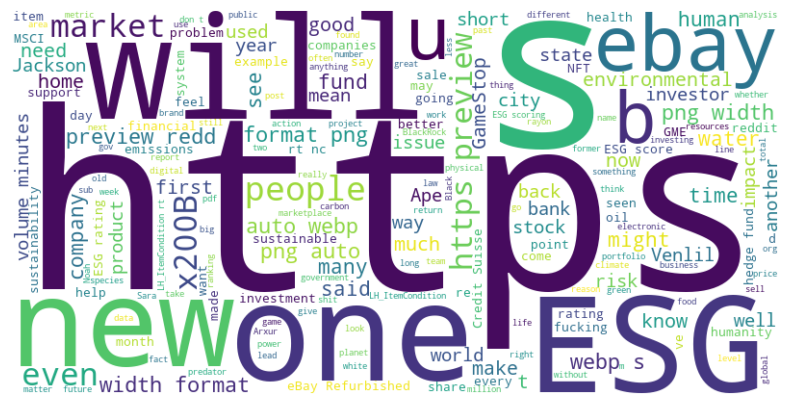

In [401]:
# Create the word cloud
# Concatenate the 'body' and 'text' columns into a single string
combined_text = ' '.join(df_2022['body'] + ' ' + df_2022['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)
# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Turn off axis
plt.show()

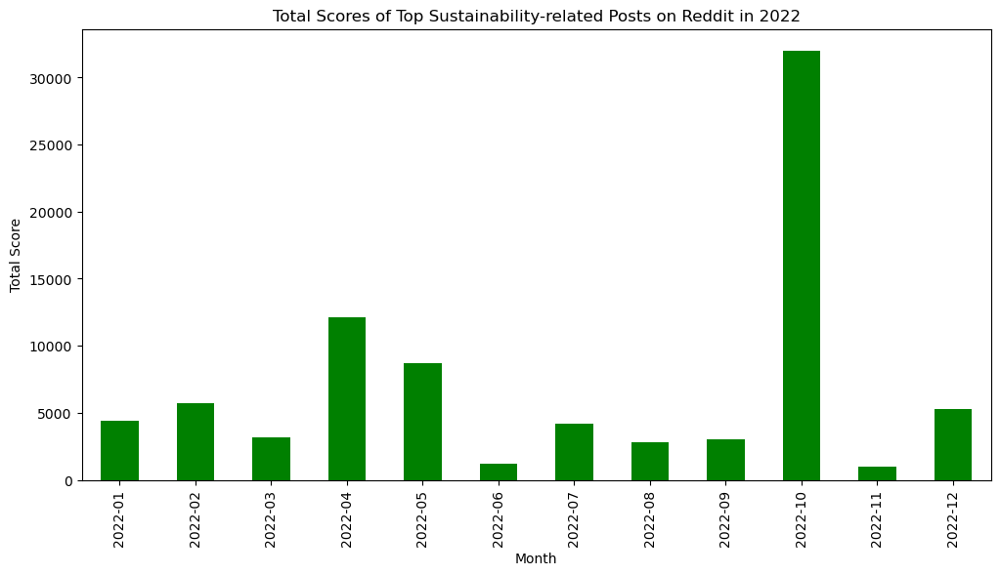

In [193]:
# Grouping by month and summing the scores
score_per_month = df_2022.groupby('month')['score'].sum()

# Plotting the total scores over time
score_per_month.plot(kind='bar', figsize=(12, 6), color='green')
plt.title("Total Scores of Top Sustainability-related Posts on Reddit in 2022")
plt.xlabel("Month")
plt.ylabel("Total Score")
plt.show()

Contrary to last years, the order of month by number of posts do not match the on by score.

In [195]:
df_oct = df_2022[(df_2022['created'].dt.month == 10)]

if df_oct.empty:
    print("No posts found for October 2022.")

df_oct[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
5,Researchers describe in a paper how growing al...,29184,724,science,,giuliomagnifico
61,Low-meat diets nutritionally adequate for reco...,2829,570,science,,tzaeru


Again the science subreddit is shining, but this time the author is not science moderator.

In [197]:
df_oct.loc[5]['title']

'Researchers describe in a paper how growing algae onshore could close a projected gap in society’s future nutritional demands while also improving environmental sustainability'

In [198]:
df_oct.loc[61]['title']

'Low-meat diets nutritionally adequate for recommendation to the general population in reaching environmental sustainability.'

In [199]:
user = reddit.redditor('giuliomagnifico')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: giuliomagnifico
Total Karma: 3247900
Link Karma: 3070019
Comment Karma: 177881
Account Created: 2015-01-30 15:37:45
Is Gold: True
Has Verified Email: True


In [200]:
user = reddit.redditor('tzaeru')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: tzaeru
Total Karma: 102808
Link Karma: 7489
Comment Karma: 95319
Account Created: 2015-04-06 19:25:55
Is Gold: False
Has Verified Email: True


Much less karma and much less score

In [202]:
post_id_row_5 = df_oct.loc[5]['id']  
post_id_row_61 = df_oct.loc[61]['id']

# Get comments for these posts
comments_row_5 = get_comments(post_id_row_5)
comments_row_61 = get_comments(post_id_row_61)

sentiments_row_5 = [analyze_sentiment(comment) for comment in comments_row_5]
sentiments_row_61 = [analyze_sentiment(comment) for comment in comments_row_61]

# Calculate and print average sentiment
print("Average sentiment for comment in row 5:", sum(sentiments_row_5) / len(sentiments_row_5))
print("Average sentiment for comment in row 61:", sum(sentiments_row_61) / len(sentiments_row_61))

Average sentiment for comment in row 5: 0.07353731965680303
Average sentiment for comment in row 61: 0.06620378867847289


So far w have seen numerous example that getting a lot of comments, does not mean a lot of sentimented ones.

In [204]:
df_apr = df_2022[(df_2022['created'].dt.month == 4)]

if df_apr.empty:
    print("No posts found for April 2022.")

df_apr[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
26,[MEGATHREAD] Everything You've Ever Wanted To ...,5681,78,u_eBay_Inc,**TLDR;** [eBay Refurbished](https://www.ebay....,eBay_Inc
84,Mr. Bill Pulte Jr. said he wants to be helpful...,2298,291,Superstonk,**Superstonk Lexicon 10 April 2022**\n\n**AMA:...,tinyorangealligator
134,Project AUSMT | Mining Project | CMC CG coming...,1435,81,CryptoMoonShots,AusMining Token\n\nAUSMT strives to be Austral...,jectonsarbew
138,The Montana mine that produces 240 million ton...,1408,25,Keep_Track,Housekeeping:\n\n* HOW TO SUPPORT: I know we a...,rusticgorilla
148,"Is it just me, or is the ""outdoorsy"", Granola,...",1306,370,simpleliving,"Edit: Hey all, just wanted to say sorry if I c...",neverfakemaplesyrup


In [205]:
df_apr.loc[26]['title']

"[MEGATHREAD] Everything You've Ever Wanted To Know About eBay Refurbished"

In [206]:
df_apr.loc[26]['body'][:2000]

'**TLDR;** [eBay Refurbished](https://www.ebay.com/b/eBay-Refurbished/bn_7040708936) helps you save and feel extra good about it. Shop all the top brands you already know and love, while helping our planet with every purchase. All this with industry-leading warranties, hassle-free returns, and a money back guarantee? [Happy Earth Month](https://www.ebay.com/b/Earth-Day/bn_7115058703), indeed.\n\n**Table of Contents:**\n\n* Why eBay Refurbished?\n* eBay Refurbished condition guide\n   * Certified\n   * Excellent\n   * Very good\n   * Good\n* eBay Refurbished warranties\n* Sustainability\n* Another. TLDR;.\n* Helpful links & resources\n\n# WHY EBAY REFURBISHED?\n\nYou’ve got questions and we’ve got answers (but only about eBay! We’re sure there’s a subreddit for that weird question you have.)\n\nSimply put, eBay Refurbished provides a wide range of premium brands up to 50% off retail price and backed by industry-leading warranties. More importantly, buying refurbished is better for the p

Contrary to what we have seen so far, the most scored post of this month does not have the most comments. It might be becasue it is sort of an ad.

In [208]:
df_apr.loc[84]['title']

'Mr. Bill Pulte Jr. said he wants to be helpful if he can and someone responded that maybe we should write a glossary of the Superstonk slang for him. Here is my humble attempt to capture the basics in a non-DD post. Please help by adding any that I missed or correcting the info.'

In [209]:
df_apr.loc[84]['body'][:2000]

'**Superstonk Lexicon 10 April 2022**\n\n**AMA:** Ask Me Anything - Q&A interview with a subject matter expert via video & comments or comments only.\n\n**APE:** Apes together strong from the movie *Planet of the Apes*. A retail investor who just likes the stock. Thanks to u/spencer2e who helped out with the sub migration and PC language history: "apes have significantly less grooves/wrinkles than humans and it was adopted pretty quickly." Sometimes All People Equal. See Smooth Brain\n\n**Bag holder:** A shareholder left holding shares of worthless stocks after a SHF or other financial terrorist completed a "pump and dump." Also see Coke Rat.\n\n🍌: The preferred sex toy of some Apes. Can also be used as a threat or ultimatum. "Unzip my pants" can refer to receiving punishment by or using a fruit in the Musaceae family sometimes as well.\n\n**BCG:** Boston Consulting Group. Evil bad guys who gut a company from within, so their short seller partners can profit from bankruptcy of their cl

In [210]:
# Fetch the subreddit information
subreddit = reddit.subreddit('Superstonk')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: Superstonk
Title: 💎🙌Superstonk🚀🦍
Description/About:
A place for theoretical discussions about GameStop stock ($GME). Opinions and memes welcome. Suspected crypto coin scams such as the "Superstonk" coin and "DumbMoney" crypto coin (with the symbol "$GME") have nothing to do with GameStop stock. None of this is financial advice.
Subscriber Count: 1115843
Created on: 2021-03-16 00:16:45



GameStop ($GME) is a video game retailer that gained significant attention in early 2021 due to an unprecedented surge in its stock price. This surge was largely driven by retail investors from the Reddit community r/WallStreetBets, who collectively bought shares and options, causing a short squeeze. This event led to massive price increases, catching the attention of the media, regulators, and the broader financial market.

In [212]:
# Fetch the subreddit information
subreddit = reddit.subreddit('u_eBay_Inc')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: u_eBay_Inc
Title: eBay
Description/About:
🌏's largest marketplace
Subscriber Count: 0
Created on: 2019-01-01 01:39:35


The subreddit is deleted now

In [214]:
user = reddit.redditor('eBay_Inc')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: eBay_Inc
Total Karma: 843
Link Karma: 767
Comment Karma: 76
Account Created: 2019-01-01 01:39:35
Is Gold: False
Has Verified Email: True


Being the highest scored with such a low karma is strange

In [216]:
user = reddit.redditor('tinyorangealligator')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: tinyorangealligator
Total Karma: 77410
Link Karma: 3998
Comment Karma: 73412
Account Created: 2020-08-11 08:40:25
Is Gold: False
Has Verified Email: True


First time I see somene with comment karma more than link karma. Probbably this is why the most scored post failed to get the most comments.

In [218]:
post_id_row_26 = df_apr.loc[26]['id']  
post_id_row_84 = df_apr.loc[84]['id']

# Get comments for these posts
comments_row_26 = get_comments(post_id_row_26)
comments_row_84 = get_comments(post_id_row_84)

sentiments_row_26 = [analyze_sentiment(comment) for comment in comments_row_26]
sentiments_row_84 = [analyze_sentiment(comment) for comment in comments_row_84]

# Calculate and print average sentiment
print("Average sentiment for comment in row 5:", sum(sentiments_row_26) / len(sentiments_row_26))
print("Average sentiment for comment in row 61:", sum(sentiments_row_84) / len(sentiments_row_84))

Average sentiment for comment in row 5: 0.4375
Average sentiment for comment in row 61: 0.14673327100470246


An out of ordinary high positive sentiment for the ad-like post

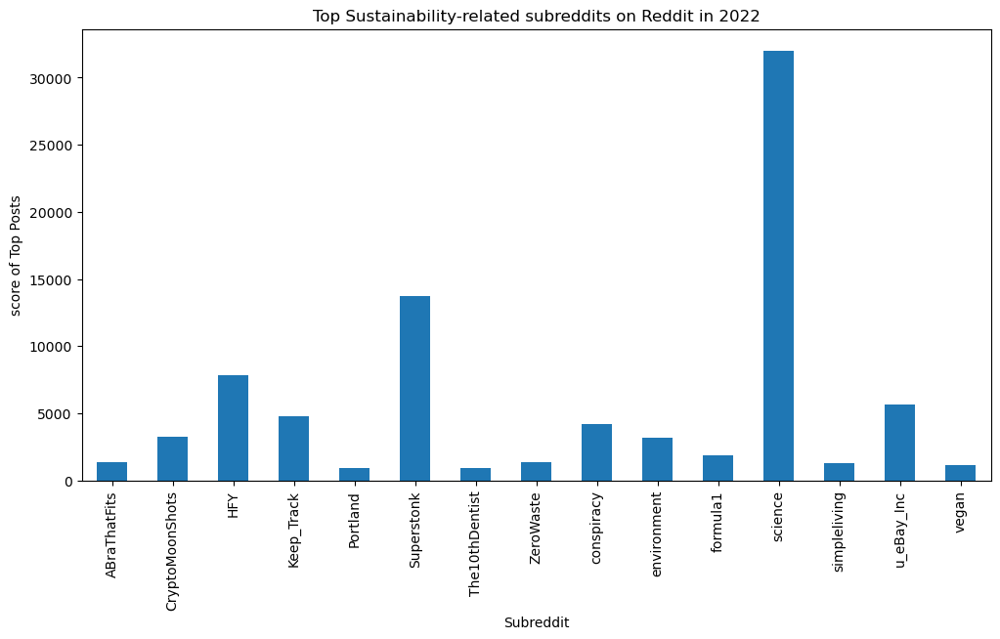

In [220]:
top_subs_per_freq = df_2022.groupby('subreddit')['score'].sum()

top_subs_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related subreddits on Reddit in 2022")
plt.xlabel("Subreddit")
plt.ylabel("score of Top Posts")
plt.show()

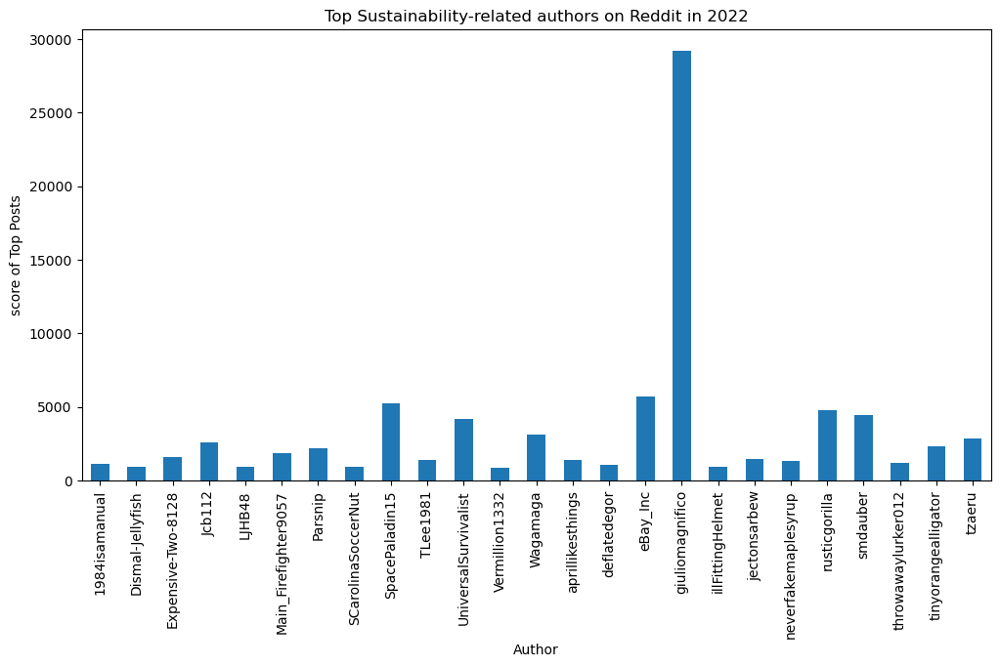

In [221]:
top_authors_per_freq = df_2022.groupby('author')['score'].sum()

top_authors_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related authors on Reddit in 2022")
plt.xlabel("Author")
plt.ylabel("score of Top Posts")
plt.show()

Above can be seen that the sum of the highest scored author and subreddit made the exremely high scored post of October While the advantage of month 4 is the highest number of posts

In [223]:
# Set correct timestamps for the entire year
start_timestamp = int(time.mktime(datetime(2022, 1, 1).timetuple()))
end_timestamp = int(time.mktime(datetime(2022, 12, 31, 23, 59, 59).timetuple()))

# Collect posts and their comments
posts_data = []

for submission in reddit.subreddit('all').search(query, sort=sort_by, limit=limit):
    post_date = datetime.utcfromtimestamp(submission.created_utc)
    
    # Debugging output to track filtering
    #print(f"Found post from {post_date}: {submission.title}")

    # Filter posts from 2021
    if start_timestamp <= submission.created_utc <= end_timestamp:
        # Analyze sentiment of the post
        post_text = submission.title + " " + submission.selftext
        post_sentiment = sid.polarity_scores(post_text)['compound']
        
        # Initialize list to store comment sentiments
        comment_sentiments = []
        
        # Fetch comments
        submission.comments.replace_more(limit=0)  # Replace "MoreComments" objects
        for comment in submission.comments.list():
            # Analyze sentiment of the comment
            comment_text = comment.body
            comment_sentiment = sid.polarity_scores(comment_text)['compound']
            comment_sentiments.append(comment_sentiment)
        
        # Calculate average comment sentiment
        avg_comment_sentiment = sum(comment_sentiments) / len(comment_sentiments) if comment_sentiments else 0
        
        # Append post data
        posts_data.append({
            'title': submission.title,
            'score': submission.score,
            'id': submission.id,
            'url': submission.url,
            'num_comments': submission.num_comments,
            'created': post_date,
            'subreddit': submission.subreddit.display_name,
            'author': str(submission.author),
            'selftext': submission.selftext,
            'post_sentiment': post_sentiment,
            'avg_comment_sentiment': avg_comment_sentiment
        })
        
        print(f"Processed post: {submission.title}")

Processed post: Researchers describe in a paper how growing algae onshore could close a projected gap in society’s future nutritional demands while also improving environmental sustainability
Processed post: [MEGATHREAD] Everything You've Ever Wanted To Know About eBay Refurbished
Processed post: The Nature of Predators 74
Processed post: GameStop’s NFT Marketplace is going to be bigger than we can imagine
Processed post: You'll rarely need a doctor, lawyer, or policeman. But every day, three times a day, you need a farmer
Processed post: Trump Policies Sent U.S. Tumbling in a Climate Ranking. The Environmental Performance Index, published every two years by researchers at Yale and Columbia, found only Denmark and Britain on sustainable paths to net-zero emissions by 2050.
Processed post: Low-meat diets nutritionally adequate for recommendation to the general population in reaching environmental sustainability.
Processed post: Humans are Stubborn
Processed post: Mr. Bill Pulte Jr. said

In [224]:
# Convert collected data to a DataFrame
df_posts = pd.DataFrame(posts_data)

# Display basic information about the DataFrame
print(f"Total posts collected: {len(df_posts)}")

Total posts collected: 27


Decrease

In [226]:
# Descriptive statistics for post sentiments
print("Post Sentiment Statistics:")
print(df_posts['post_sentiment'].describe())

Post Sentiment Statistics:
count    27.000000
mean      0.477707
std       0.752141
min      -0.999300
25%       0.380700
50%       0.832300
75%       0.984400
max       0.999600
Name: post_sentiment, dtype: float64


Sentiment close to 2019, median more or less the same for years

range full

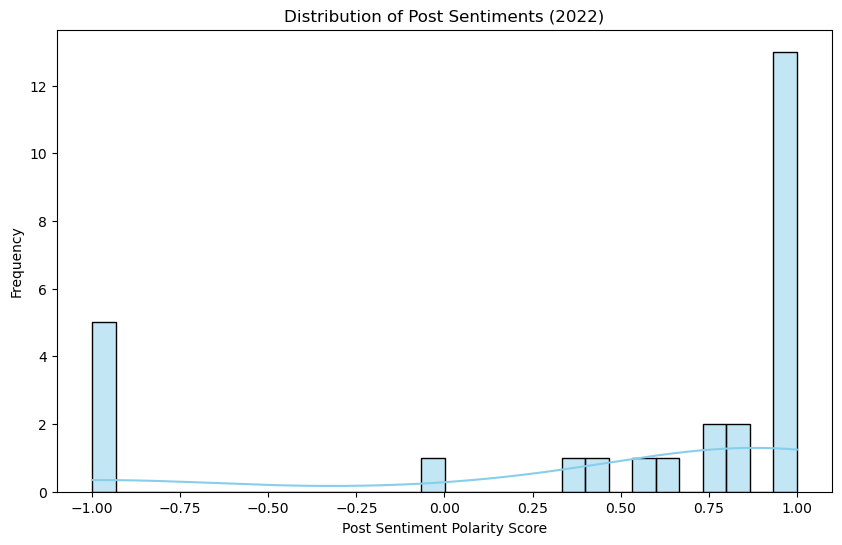

In [228]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['post_sentiment'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Post Sentiments (2022)')
plt.xlabel('Post Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

In [229]:
# Descriptive statistics for comment sentiments
print("\nAverage Comment Sentiment Statistics:")
print(df_posts['avg_comment_sentiment'].describe())


Average Comment Sentiment Statistics:
count    27.000000
mean      0.194978
std       0.164768
min      -0.070982
25%       0.065020
50%       0.183545
75%       0.326946
max       0.492600
Name: avg_comment_sentiment, dtype: float64


Max decreased back like last years

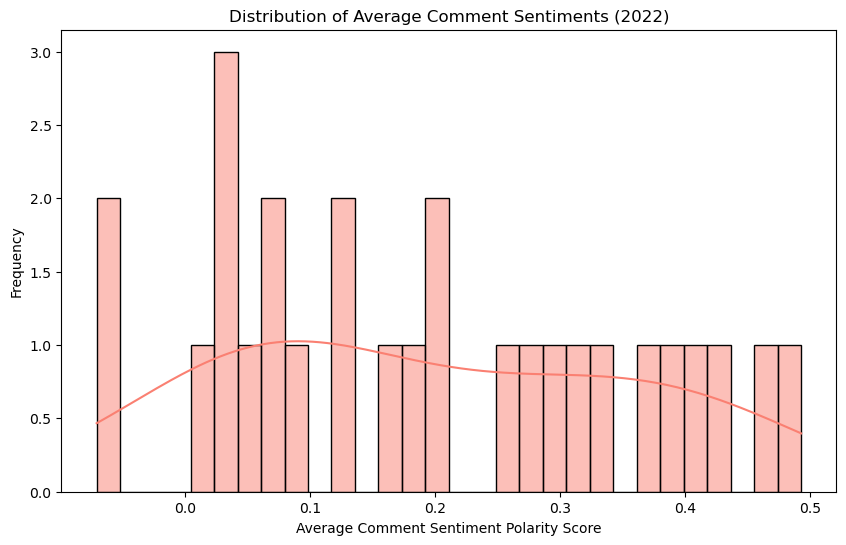

In [231]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['avg_comment_sentiment'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Average Comment Sentiments (2022)')
plt.xlabel('Average Comment Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

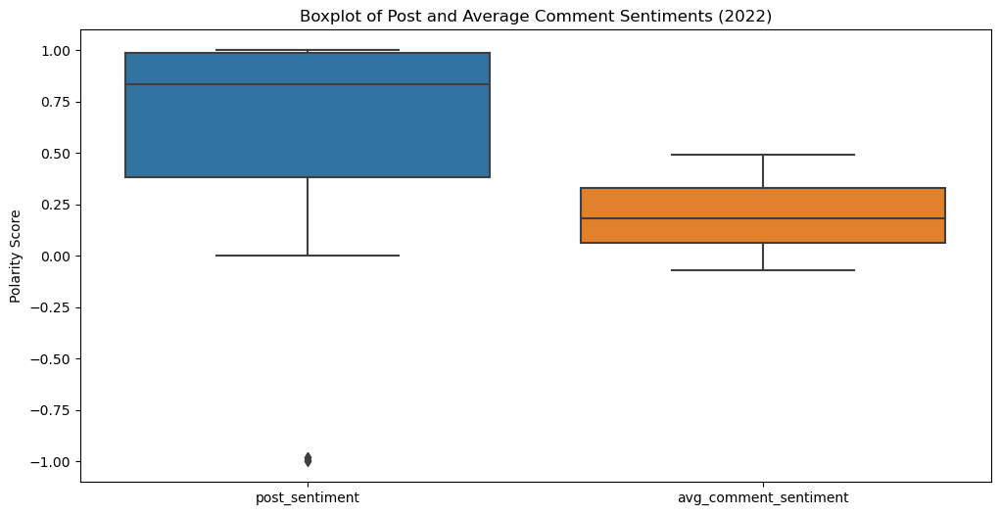

In [232]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_posts[['post_sentiment', 'avg_comment_sentiment']])
plt.title('Boxplot of Post and Average Comment Sentiments (2022)')
plt.ylabel('Polarity Score')
plt.show()

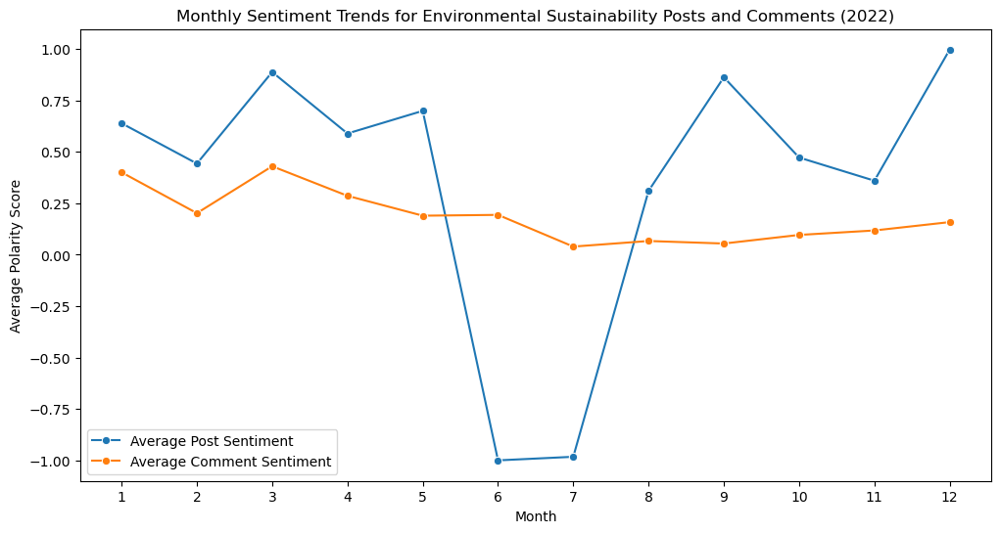

In [233]:
# Extract month from the 'created' timestamp
df_posts['month'] = df_posts['created'].dt.month

# Calculate average sentiments per month
monthly_sentiments = df_posts.groupby('month').agg({
    'post_sentiment': 'mean',
    'avg_comment_sentiment': 'mean'
}).reset_index()

# Plotting the sentiment trends over months
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sentiments, x='month', y='post_sentiment', label='Average Post Sentiment', marker='o')
sns.lineplot(data=monthly_sentiments, x='month', y='avg_comment_sentiment', label='Average Comment Sentiment', marker='o')
plt.title('Monthly Sentiment Trends for Environmental Sustainability Posts and Comments (2022)')
plt.xlabel('Month')
plt.ylabel('Average Polarity Score')
plt.xticks(range(1, 13))
plt.legend()
plt.show()

In [234]:
df_jun = df_2022[(df_2022['created'].dt.month == 6)]

if df_jun.empty:
    print("No posts found.")

df_jun[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
166,"""The Whores at the Ratings Agencies"": Pt. 1 Li...",1204,46,Superstonk,**TL;DR:** \n\n* **ESG = Environmental Social ...,throwawaylurker012


In [243]:
df_jun.loc[166]['title']

'"The Whores at the Ratings Agencies": Pt. 1 Lies, Damned Lies, & ESG Scores'

In [266]:
df_jun.loc[166]['body'][:2000]

'**TL;DR:** \n\n* **ESG = Environmental Social Governance. ESG ratings provided by ratings agencies help determine whether a mutual fund or ETF does well by ratings of metrics including environmental concerns, slavery use in supply chain issues, animal cruelty and more. ESG ratings have grown more popular and have been performing well in recent markets.**\n* **However, ESG scores have been horribly inconsistent across different companies. Most notably, Tesla was at one point ranked an #1 and dead last across different agencies. Currently, Musk has criticized S&P for removing Tesla from a sustainability index but keeping oil giant Exxon Mobil. Even ESG scores among ratings agencies in the same company (Morgan Stanley\'s MSCI in one study) do not correlate often with one another\'s ESG ratings.**\n* **ESG ratings might be seen as a proxy for risk, so good ESG score is seen as good risk management. This might not be true, as not only are ratings often inconsistent, many companies hide the

In [267]:
df_jul = df_2022[(df_2022['created'].dt.month == 7)]

if df_jul.empty:
    print("No posts found.")

df_jul[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
41,"You'll rarely need a doctor, lawyer, or police...",4210,664,conspiracy,The WEF is very open on its websites about des...,UniversalSurvivalist


In [268]:
df_jul.loc[41]['title']

"You'll rarely need a doctor, lawyer, or policeman. But every day, three times a day, you need a farmer"

In [269]:
df_jul.loc[41]['body']

'The WEF is very open on its websites about destroying farming and setting up WEF food banks. Where the only food will be genetically modified or synthetically lab produced. Meat and naturally grown food will only be for the globalists. People need to open their eyes.\n\nI stand with the Dutch farmers  💪🏻\n\nThey are fighting against the WEF who are taking steps to seize their land by stopping them farming.\n\nMeanwhile in SRI LANKA -  The newly installed WEF President is simply more of the same. He has vowed to crackdown on ‘fascist’ protests. He means his own people, desperately trying to stop the globalist experiment that was originally responsible for destroying farming and their economy. \n\nBill Gates and his WEF friends are infiltrating and buying up farms around the world, while Western governments are bribing farmers to retire.\n\nIn July 2019, the WEF explained how global farming can take on climate change. https://www.weforum.org/agenda/2019/07/agriculture-climate-change-sol

WEF: World Economic Forum

### 2023

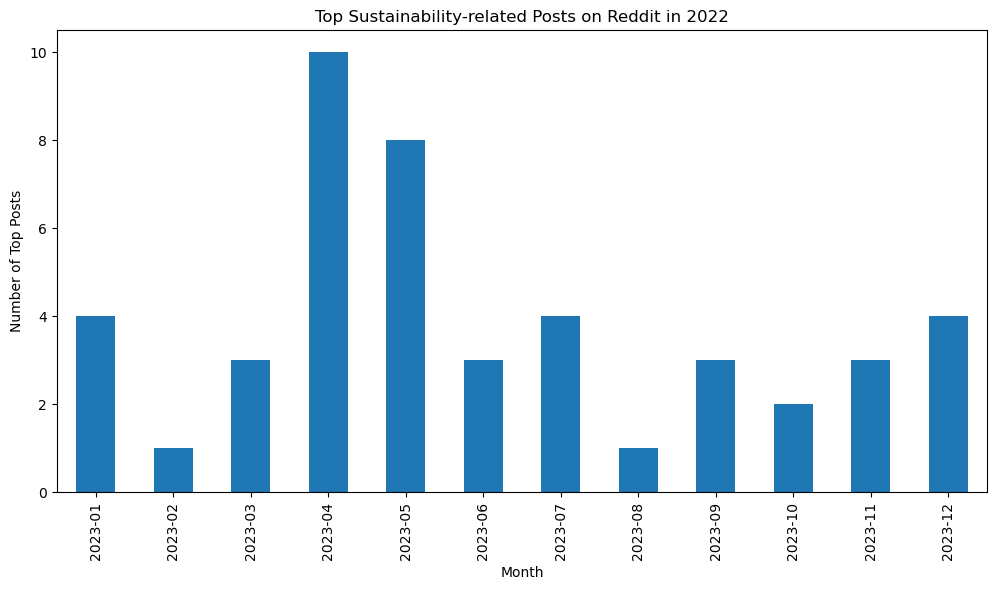

In [272]:
df_2023 = df_all[(df_all['created'].dt.year == 2023)]
top_posts_per_month = df_2023.groupby('month').size()

# Plotting the number of top posts over time
top_posts_per_month.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related Posts on Reddit in 2022")
plt.xlabel("Month")
plt.ylabel("Number of Top Posts")
plt.show()

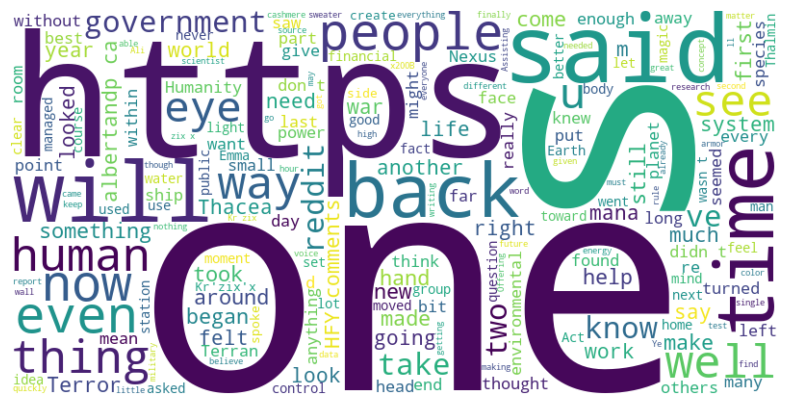

In [397]:
# Create the word cloud
# Concatenate the 'body' and 'text' columns into a single string
combined_text = ' '.join(df_2023['body'] + ' ' + df_2023['title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)
# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Turn off axis
plt.show()

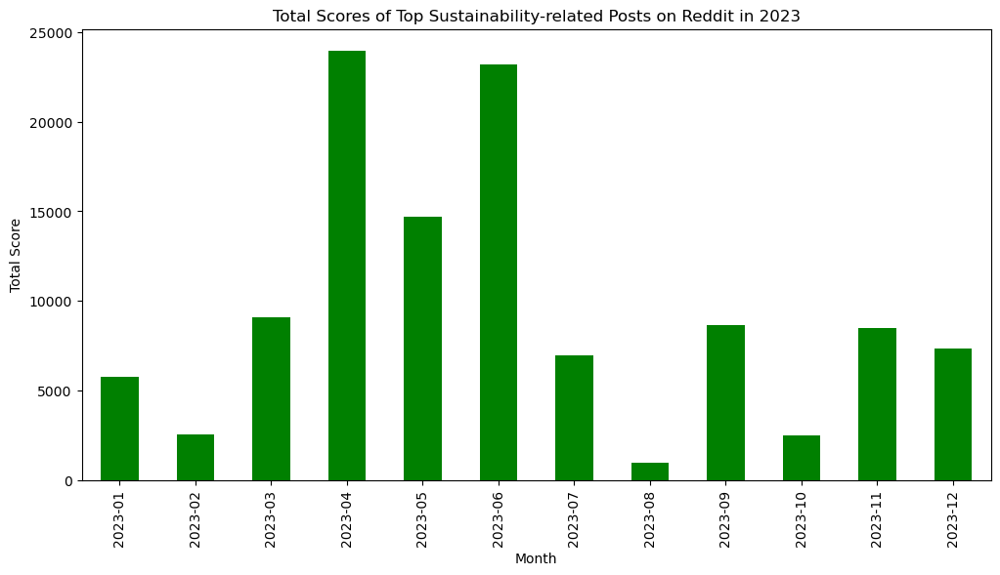

In [273]:
# Grouping by month and summing the scores
score_per_month = df_2023.groupby('month')['score'].sum()

# Plotting the total scores over time
score_per_month.plot(kind='bar', figsize=(12, 6), color='green')
plt.title("Total Scores of Top Sustainability-related Posts on Reddit in 2023")
plt.xlabel("Month")
plt.ylabel("Total Score")
plt.show()

In [274]:
df_apr = df_2023[(df_2023['created'].dt.month == 4)]

if df_apr.empty:
    print("No posts found.")

df_apr[['title', 'score', 'comms_num', 'subreddit', 'body', 'author', 'url']]

,title,score,comms_num,subreddit,body,author,url
22,oof ouch my solution to climate change,6068,291,bonehurtingjuice,,Life-Membership-1411,https://i.redd.it/8rmtllia4tra1.jpg
44,Yes,3852,553,PoliticalCompassMemes,,BisonicLemur,https://i.redd.it/vbfys3758qra1.jpg
49,Wearing Power Armor to a Magic School (28/?),3467,390,HFY,[First](https://www.reddit.com/r/HFY/comments/...,Jcb112,https://www.reddit.com/r/HFY/comments/133x9m1/...
83,We Do.,2320,202,HFY,*\[For some reason Reddit's SpamBot nuked almo...,Salishaz,https://www.reddit.com/r/HFY/comments/12sme7v/...
99,Update on Niagara Bottling trying to tap into ...,1931,187,minnesota,"If you don’t already know, Niagara Bottling - ...",CascadeInTwilight,https://www.reddit.com/r/minnesota/comments/12...
108,"I Am Doug Busch, a photographer known for usin...",1772,194,IAmA,"Hello Reddit, I am very excited to be here for...",GenosCenter,https://www.reddit.com/r/IAmA/comments/12jrotm...
133,First Contact - Chapter 940 - The Setting Sun,1440,90,HFY,\[[first](https://www.reddit.com/r/HFY/comment...,Ralts_Bloodthorne,https://www.reddit.com/r/HFY/comments/130bt05/...
187,I'm not sure if some people on this subreddit ...,1057,484,washingtondc,I've noticed a huge anti-car sentiment in r/wa...,lDontFuckWithCondoms,https://www.reddit.com/r/washingtondc/comments...
189,Humans are the Reluctant Masters of Warfare Ch...,1053,87,HFY,[First](https://www.reddit.com/r/HFY/comments/...,XfoXshoreX,https://www.reddit.com/r/HFY/comments/12vjypf/...
197,We are here to help.,1019,38,HFY,"Sucking nervously on his antennae, Kr’zix’x ro...",Entrak,https://www.reddit.com/r/HFY/comments/12uekjc/...


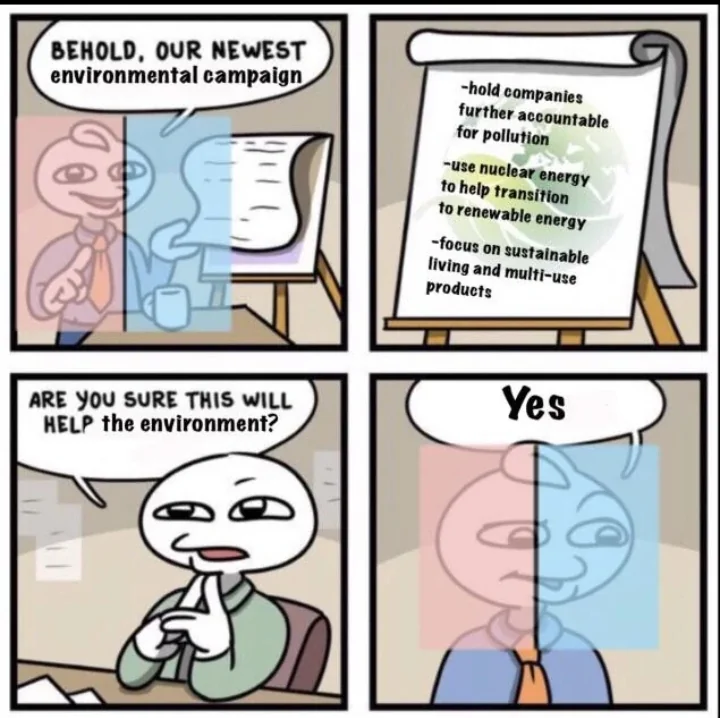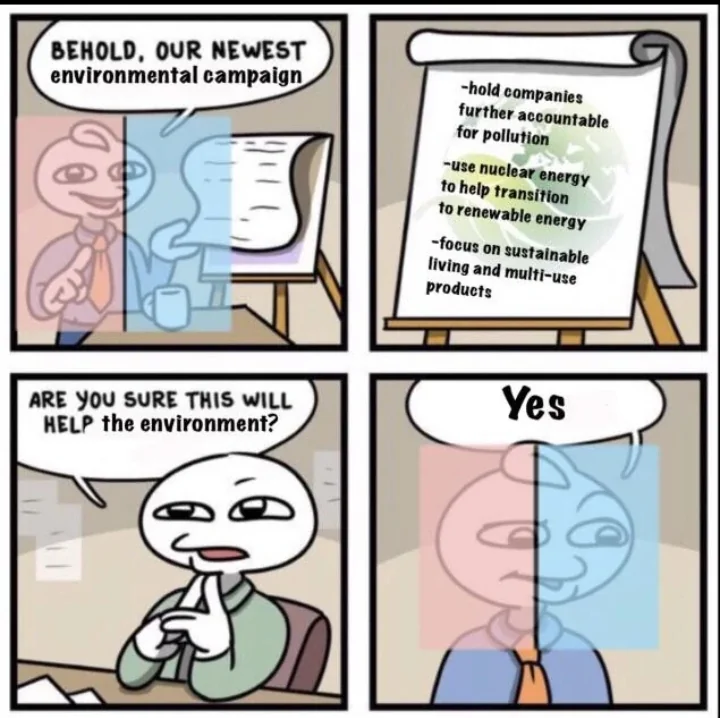

In [276]:
user = reddit.redditor('Life-Membership-1411')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: Life-Membership-1411
Total Karma: 413792
Link Karma: 384734
Comment Karma: 29058
Account Created: 2023-01-04 01:27:54
Is Gold: False
Has Verified Email: True


In [277]:
user = reddit.redditor('BisonicLemur')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: BisonicLemur
Total Karma: 41680
Link Karma: 15671
Comment Karma: 26009
Account Created: 2022-10-14 02:50:09
Is Gold: False
Has Verified Email: True


In [278]:
# Fetch the subreddit information
subreddit = reddit.subreddit('bonehurtingjuice')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: bonehurtingjuice
Title: send u/kirbizia bubsy 1
Description/About:
Bonehurtingjuice memes are memes that are out of context and misuse the template completely. Imagine you're a 10 year old kid who just discovered the internet a week ago and your only exposure is iFunny. It's like that.
Here's the original for example!
(https://www.reddit.com/r/bonehurtingjuice/comments/640w0f/the_original/) 🧃

------ READ THE HISTORY ( https://irony.wiki/wiki/BoneHurtingJuice) -------

https://discord.gg/4avADksSYU DISCORD SERVER
Subscriber Count: 930592
Created on: 2017-04-07 16:54:50


In [279]:
# Fetch the subreddit information
subreddit = reddit.subreddit('PoliticalCompassMemes')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: PoliticalCompassMemes
Title: Political Compass Memes
Description/About:
Political Compass Memes
Subscriber Count: 582790
Created on: 2017-01-22 00:23:42


In [280]:
df_jun = df_2023[(df_2023['created'].dt.month == 6)]

if df_jun.empty:
    print("No posts found.")

df_jun[['title', 'score', 'comms_num', 'subreddit', 'body', 'author', 'url']]

,title,score,comms_num,subreddit,body,author,url
7,"Ah yes, the cattle industry. The best example ...",15587,511,terriblefacebookmemes,,TheRealHogshead,https://i.redd.it/jbm8k1c4r15b1.jpg
35,100 ways to use ChatGPT with prompts - beginne...,4515,390,ChatGPT,A lot of beginners come to the community and a...,Write_Code_Sport,https://www.reddit.com/r/ChatGPT/comments/14h4...
58,Wearing Power Armor to a Magic School (35/?),3116,347,HFY,[First](https://www.reddit.com/r/HFY/comments/...,Jcb112,https://www.reddit.com/r/HFY/comments/14cphmt/...


In [281]:
df_jun.loc[7]['title']

'Ah yes, the cattle industry. The best example of sustainable environmentalism.'

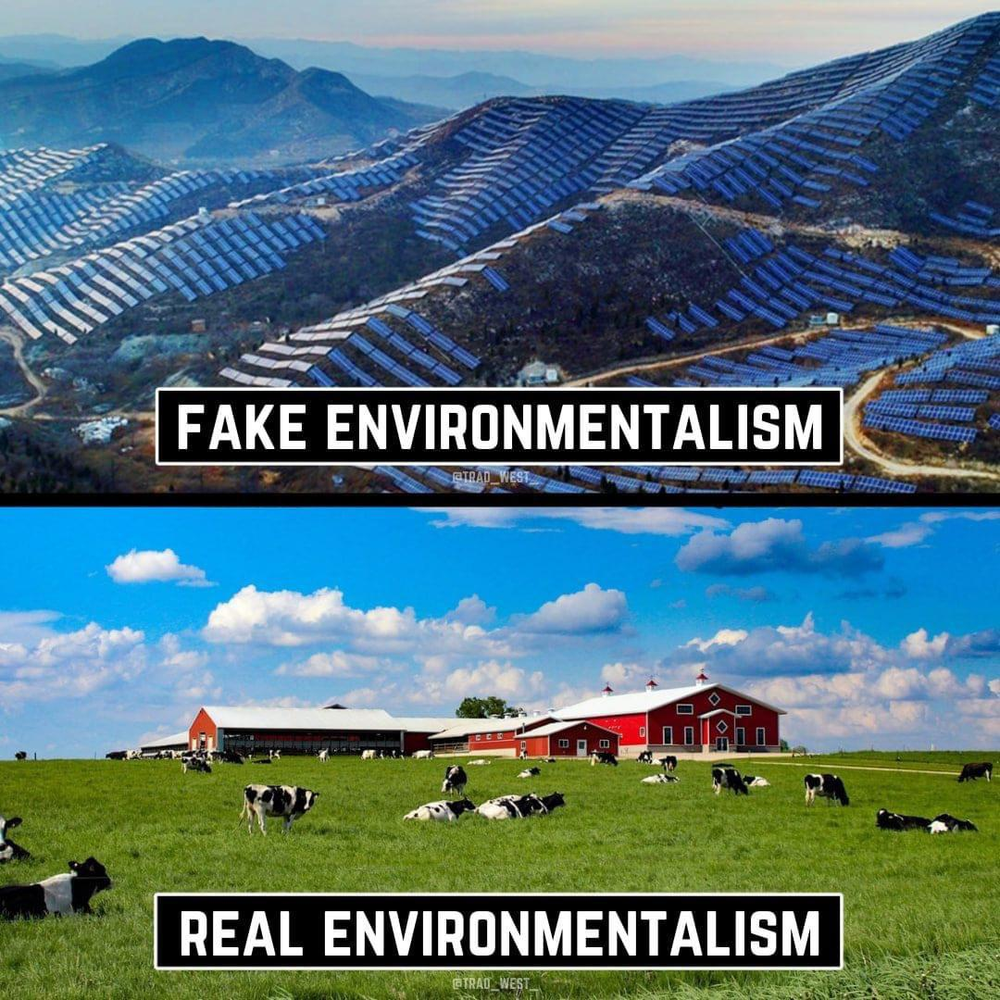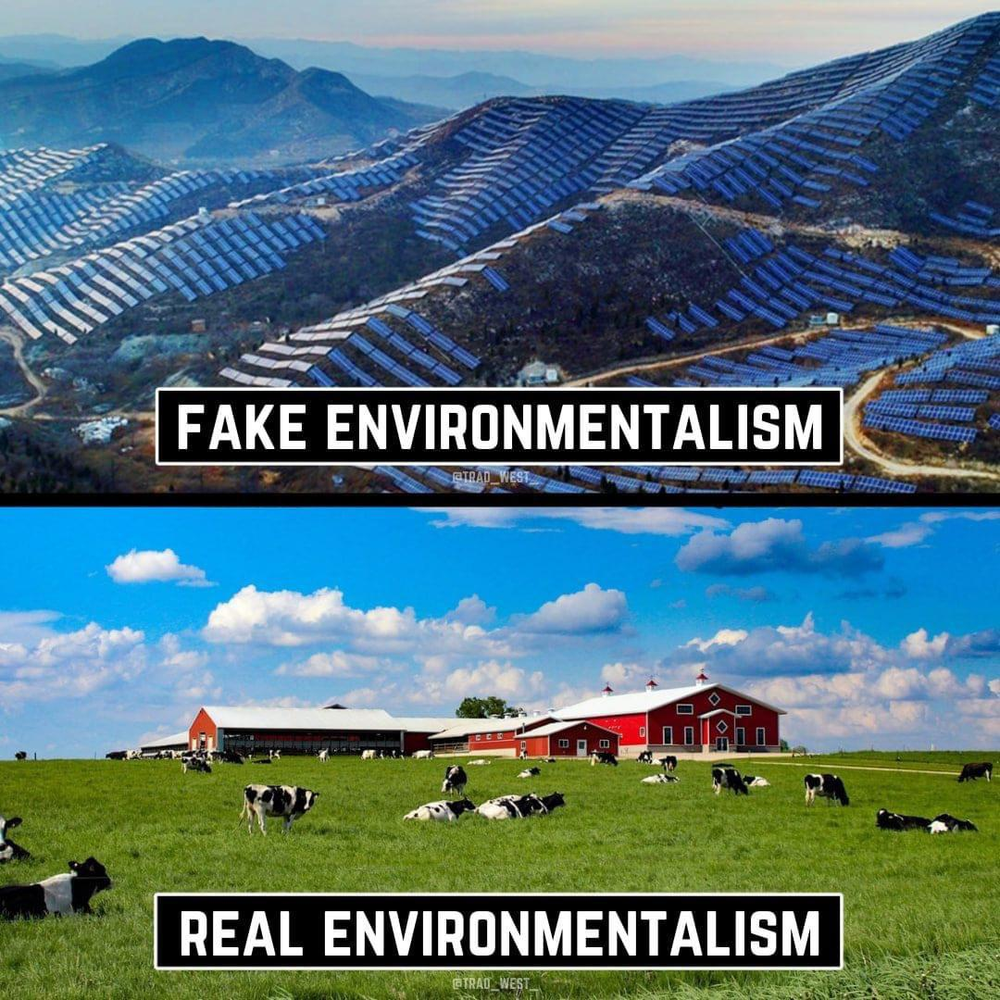

In [283]:
df_jun.loc[35]['title']

'100 ways to use ChatGPT with prompts - beginners you should bookmark this'

In [284]:
df_jun.loc[35]['body'][:2000]

'A lot of beginners come to the community and ask about what/how they can use ChatGPT. They usually get the “ask ChatGPT” response, which is not particularly helpful.\n\nSo, here’s a list for beginners to give you an idea of a few things that ChatGPT can do, with an example prompt.\n\nAlso suggest you [Check out this article](https://www.chatgptguide.ai/2023/06/19/100-ways-to-use-chatgpt-with-prompts/) if you want more prompt ideas, intermediate-level prompts, and expanded descriptions.\n\nAnd, if you’re not a beginner, but found your way here, you might be interested in checking out this 100 ways to make money with [ChatGPT article](https://www.chatgptguide.ai/2023/06/23/100-ways-to-make-money-with-chatgpt-with-prompts/) here for some ideas.\n\n&#x200B;\n\n|\\*\\*Use Case\\*\\*| |\\*\\*Category\\*\\*|\\*\\*Sample Prompt\\*\\*| |\n\n:--|:--|:--|:--|:--|\n\n|1. Drafting emails| |Corporate|"Draft an email about the quarterly sales report."| |\n\n|2. Writing company blog posts| |Corporate

In [285]:
user = reddit.redditor('TheRealHogshead')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: TheRealHogshead
Total Karma: 59479
Link Karma: 47323
Comment Karma: 12156
Account Created: 2021-07-22 13:21:46
Is Gold: False
Has Verified Email: True


In [286]:
user = reddit.redditor('Write_Code_Sport')

# Print the author's information
print(f"Username: {user.name}")
print(f"Total Karma: {user.link_karma + user.comment_karma}")
print(f"Link Karma: {user.link_karma}")
print(f"Comment Karma: {user.comment_karma}")
print(f"Account Created: {datetime.fromtimestamp(user.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Is Gold: {user.is_gold}")
print(f"Has Verified Email: {user.has_verified_email}")

Username: Write_Code_Sport
Total Karma: 10588
Link Karma: 10156
Comment Karma: 432
Account Created: 2020-05-12 22:52:04
Is Gold: False
Has Verified Email: True


In [287]:
# Fetch the subreddit information
subreddit = reddit.subreddit('terriblefacebookmemes	')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: terriblefacebookmemes	
Title: 😎HAHA DAE MINIONS!!!😎
Description/About:
Community for all those terrible memes your uncle posts on facebook
Subscriber Count: 2215763
Created on: 2012-02-10 19:51:21


In [288]:
# Fetch the subreddit information
subreddit = reddit.subreddit('ChatGPT')

# Print the about/description section
print(f"Subreddit: {subreddit.display_name}")
print(f"Title: {subreddit.title}")
print(f"Description/About:\n{subreddit.public_description}")
print(f"Subscriber Count: {subreddit.subscribers}")
print(f"Created on: {datetime.fromtimestamp(subreddit.created_utc).strftime('%Y-%m-%d %H:%M:%S')}")

Subreddit: ChatGPT
Title: ChatGPT
Description/About:
Subreddit to discuss about ChatGPT and AI. Not affiliated with OpenAI. Thanks Nat!
Subscriber Count: 6870408
Created on: 2022-12-01 21:19:27


Seems like after stories, politics, and coins, the theme of this year is memes.

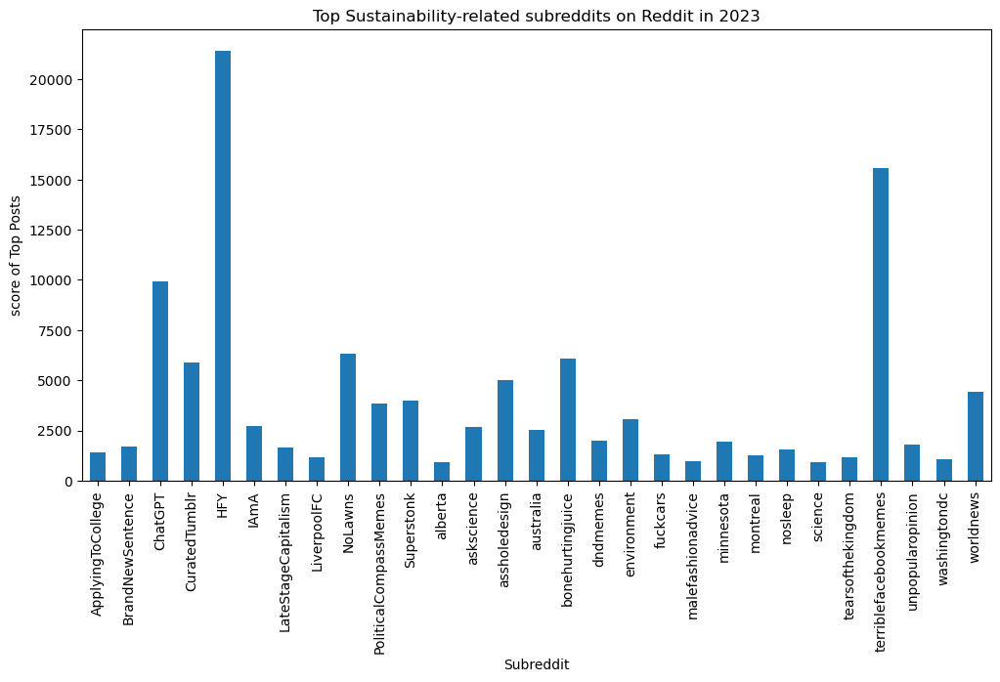

In [290]:
top_subs_per_freq = df_2023.groupby('subreddit')['score'].sum()

top_subs_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related subreddits on Reddit in 2023")
plt.xlabel("Subreddit")
plt.ylabel("score of Top Posts")
plt.show()

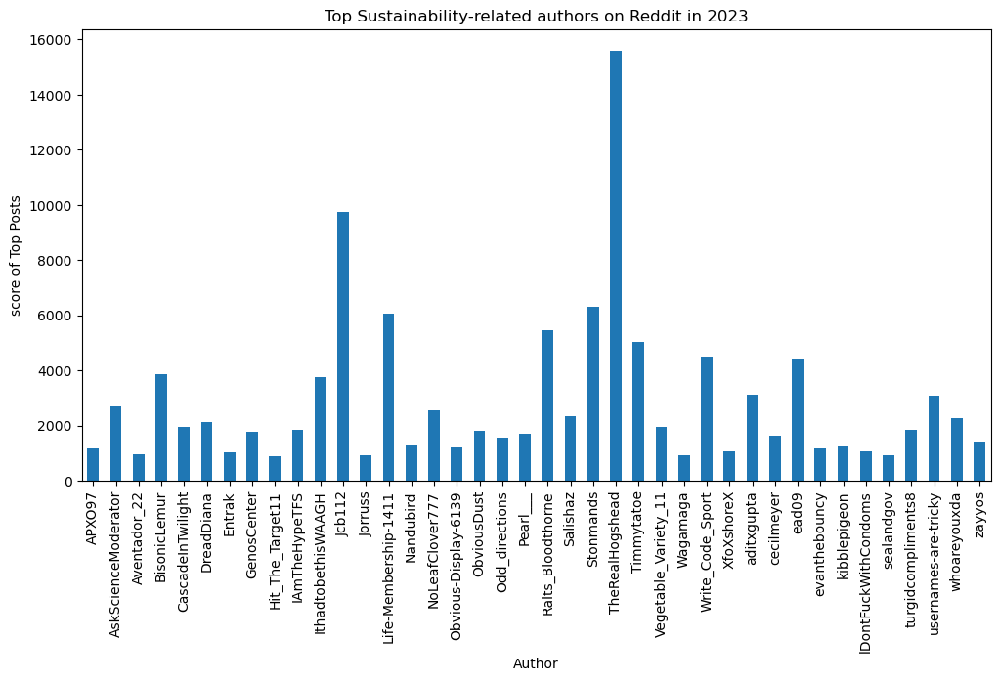

In [312]:
top_authors_per_freq = df_2023.groupby('author')['score'].sum()

top_authors_per_freq.plot(kind='bar', figsize=(12, 6))
plt.title("Top Sustainability-related authors on Reddit in 2023")
plt.xlabel("Author")
plt.ylabel("score of Top Posts")
plt.show()

In [314]:
# Set correct timestamps for the entire year
start_timestamp = int(time.mktime(datetime(2023, 1, 1).timetuple()))
end_timestamp = int(time.mktime(datetime(2023, 12, 31, 23, 59, 59).timetuple()))

# Collect posts and their comments
posts_data = []

for submission in reddit.subreddit('all').search(query, sort=sort_by, limit=limit):
    post_date = datetime.utcfromtimestamp(submission.created_utc)
    
    # Debugging output to track filtering
    #print(f"Found post from {post_date}: {submission.title}")

    
    if start_timestamp <= submission.created_utc <= end_timestamp:
        # Analyze sentiment of the post
        post_text = submission.title + " " + submission.selftext
        post_sentiment = sid.polarity_scores(post_text)['compound']
        
        # Initialize list to store comment sentiments
        comment_sentiments = []
        
        # Fetch comments
        submission.comments.replace_more(limit=0)  # Replace "MoreComments" objects
        for comment in submission.comments.list():
            # Analyze sentiment of the comment
            comment_text = comment.body
            comment_sentiment = sid.polarity_scores(comment_text)['compound']
            comment_sentiments.append(comment_sentiment)
        
        # Calculate average comment sentiment
        avg_comment_sentiment = sum(comment_sentiments) / len(comment_sentiments) if comment_sentiments else 0
        
        # Append post data
        posts_data.append({
            'title': submission.title,
            'score': submission.score,
            'id': submission.id,
            'url': submission.url,
            'num_comments': submission.num_comments,
            'created': post_date,
            'subreddit': submission.subreddit.display_name,
            'author': str(submission.author),
            'selftext': submission.selftext,
            'post_sentiment': post_sentiment,
            'avg_comment_sentiment': avg_comment_sentiment
        })
        
        print(f"Processed post: {submission.title}")

Processed post: Ah yes, the cattle industry. The best example of sustainable environmentalism.
Processed post: Saw this on Facebook, thought you guys might appreciate
Processed post: oof ouch my solution to climate change
Processed post: My Environmental Science Textbook has a word limit on copy / paste commands. Over $160 this bullshit cost me.
Processed post: 100 ways to use ChatGPT with prompts - beginners you should bookmark this
Processed post: UK Budget 2023: Nuclear power to be reclassed as 'environmentally sustainable'
Processed post: Yes
Processed post: Of Diversity of Action
Processed post: Wearing Power Armor to a Magic School (28/?)
Processed post: Wearing Power Armor to a Magic School (32/?)
Processed post: Created using chatgpt
Processed post: Wearing Power Armor to a Magic School (35/?)
Processed post: Why Americans should eat lentils every day | Food is the single strongest lever to optimize human health and environmental sustainability on Earth
Processed post: We shoul

In [316]:
# Convert collected data to a DataFrame
df_posts = pd.DataFrame(posts_data)

# Display basic information about the DataFrame
print(f"Total posts collected: {len(df_posts)}")

Total posts collected: 46


a significant increase over last year, and surprisingly not connected to certain themes, but about all things enironment.

In [319]:
# Descriptive statistics for post sentiments
print("Post Sentiment Statistics:")
print(df_posts['post_sentiment'].describe())

Post Sentiment Statistics:
count    46.000000
mean      0.370007
std       0.713317
min      -0.999800
25%      -0.038700
50%       0.663150
75%       0.995550
max       0.999900
Name: post_sentiment, dtype: float64


a bit less positive then last year

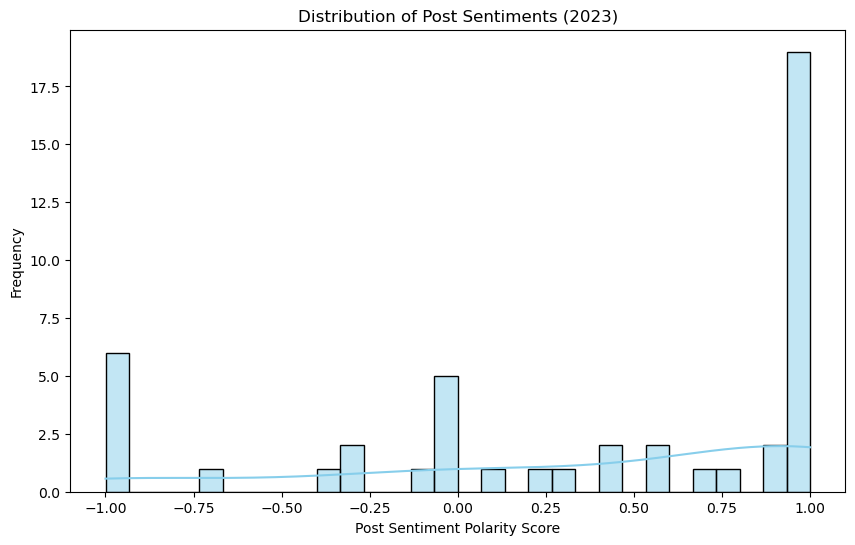

In [322]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['post_sentiment'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Post Sentiments (2023)')
plt.xlabel('Post Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

In [324]:
# Descriptive statistics for comment sentiments
print("\nAverage Comment Sentiment Statistics:")
print(df_posts['avg_comment_sentiment'].describe())


Average Comment Sentiment Statistics:
count    46.000000
mean      0.139167
std       0.148332
min      -0.206168
25%       0.069123
50%       0.119160
75%       0.188482
max       0.581792
Name: avg_comment_sentiment, dtype: float64


same for comments

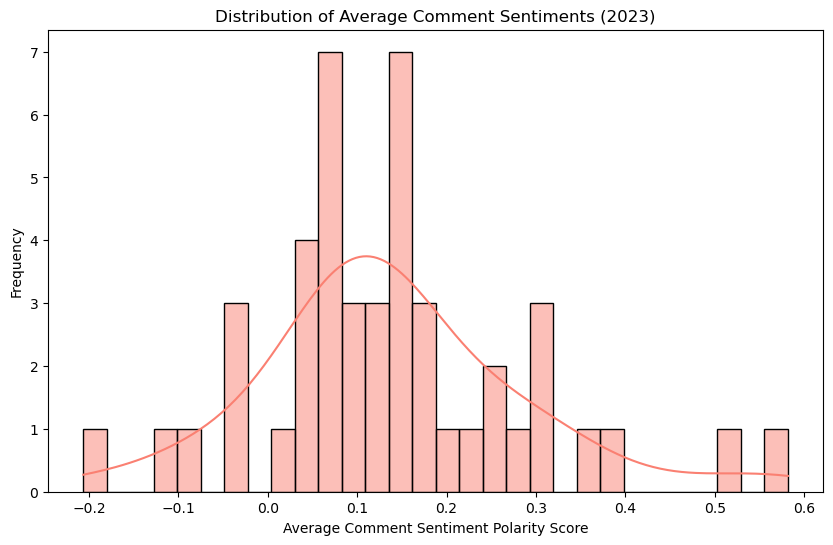

In [328]:
plt.figure(figsize=(10, 6))
sns.histplot(df_posts['avg_comment_sentiment'], bins=30, kde=True, color='salmon')
plt.title('Distribution of Average Comment Sentiments (2023)')
plt.xlabel('Average Comment Sentiment Polarity Score')
plt.ylabel('Frequency')
plt.show()

very normal like

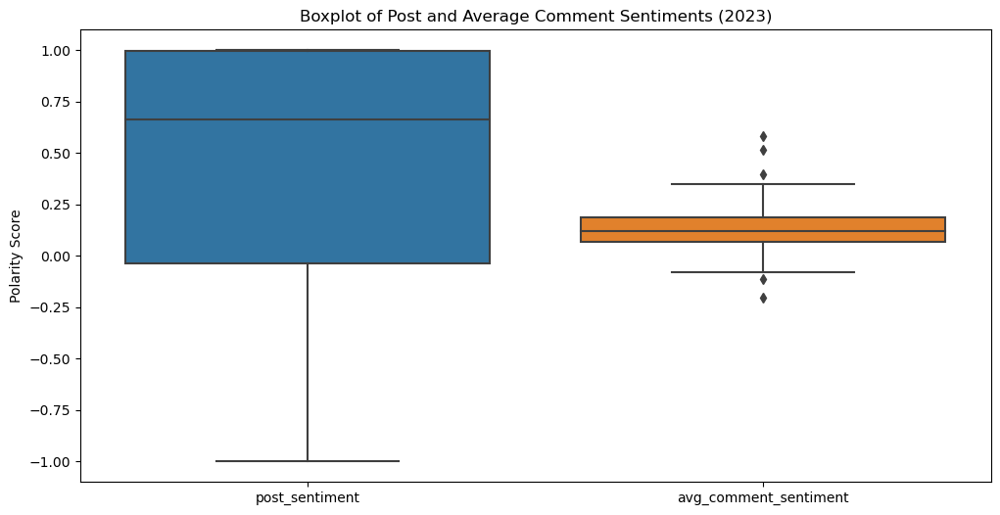

In [331]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_posts[['post_sentiment', 'avg_comment_sentiment']])
plt.title('Boxplot of Post and Average Comment Sentiments (2023)')
plt.ylabel('Polarity Score')
plt.show()

increased range of emotions of posts while as always more prone to positive
comments as always symmetric around median, close to neutral

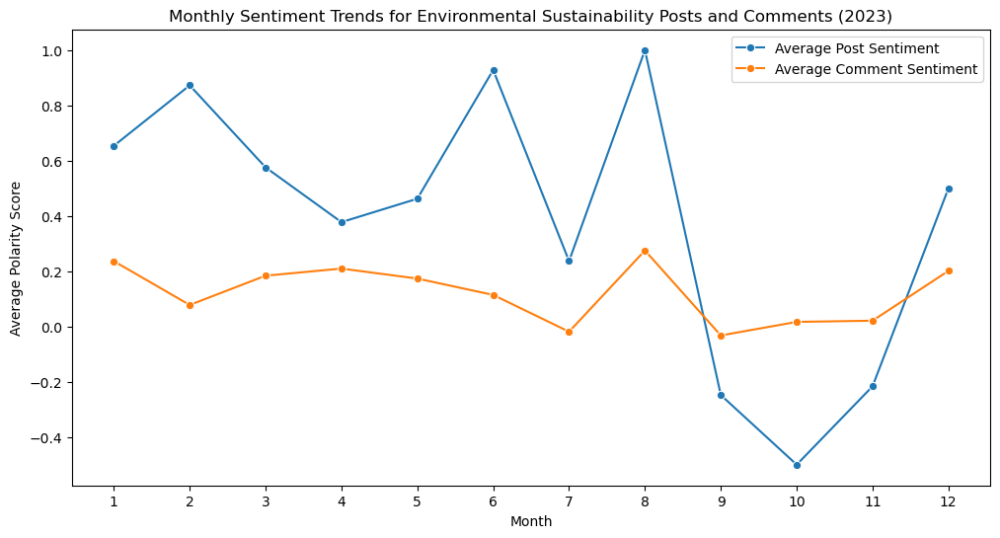

In [336]:
# Extract month from the 'created' timestamp
df_posts['month'] = df_posts['created'].dt.month

# Calculate average sentiments per month
monthly_sentiments = df_posts.groupby('month').agg({
    'post_sentiment': 'mean',
    'avg_comment_sentiment': 'mean'
}).reset_index()

# Plotting the sentiment trends over months
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sentiments, x='month', y='post_sentiment', label='Average Post Sentiment', marker='o')
sns.lineplot(data=monthly_sentiments, x='month', y='avg_comment_sentiment', label='Average Comment Sentiment', marker='o')
plt.title('Monthly Sentiment Trends for Environmental Sustainability Posts and Comments (2023)')
plt.xlabel('Month')
plt.ylabel('Average Polarity Score')
plt.xticks(range(1, 13))
plt.legend()
plt.show()

In [342]:
df_aug = df_2023[(df_2023['created'].dt.month == 8)]

if df_aug.empty:
    print("No posts found.")

df_aug[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
217,I Spent $2615 on Cashmere Sweaters and Here is...,943,114,malefashionadvice,So in an effort of helping this sub get back t...,Aventador_22


In [344]:
df_aug.loc[217]['title']

'I Spent $2615 on Cashmere Sweaters and Here is What I Learned'

In [376]:
df_aug.loc[217]['body'][7000:12000]

"lar things can be said about the bottom hem. The neckline is fairly simple but is comprised of two layers giving it a bit of structure compared to the cuffs.\n* **Thoughts**\n   * The sweater comes in seven different colors majority of which are neutrals. Sizes are limited ranging from S-XL. Quince set the bar pretty high for an entry level cashmere sweater especially at $60. We’ll find out how it ages and if it’ll last but it’s likely one of the best entry level pieces I’ve had on this channel.\n\n# Nadaam ($75):\n\nNadaam kicked the whole revolution off with their $75 cashmere sweater. It became super popular, super fast, as the company touted their sustainable practices and competitive prices. I remember cashmere being such an unattainable item in college before I came across Nadaam. I was hesitant to buy it online at the time - expecting it to feel like a scratchy wool sweater at that price but on a trip to NY walking through SOHO I came across their shop and walked out with my fi

He is comparing sweter brands and among other quality factors, points brands sustainability and use of ustainable material out

In [379]:
df_oct = df_2023[(df_2023['created'].dt.month == 10)]

if df_oct.empty:
    print("No posts found.")

df_oct[['title', 'score', 'comms_num', 'subreddit', 'body', 'author']]

,title,score,comms_num,subreddit,body,author
144,The Dark Ages - 0.2.2,1333,247,HFY,\[[Real First](https://www.reddit.com/r/HFY/co...,Ralts_Bloodthorne
169,environmentally sustainable mining,1173,51,tearsofthekingdom,,evanthebouncy


The Dark Ages - 0.2.2 story explores themes of respect for the dead, the dangers of scientific hubris, and the raw emotional power and terrifying potential of humanity in this fictional universe.It is not related to environmental sustainability!

In [385]:
df_oct.loc[169]['url']

'https://v.redd.it/y1h7q7ttqawb1'

a video of the game, The Legend of Zelda: Tears of the Kingdom, on Nintendo Switch planting